
## Imports

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import time
from collections import defaultdict

import torch
import torch.nn as nn
from torch.nn import functional as F
import torch.utils.data as data_utils
from sklearn.linear_model import LinearRegression, Ridge, RidgeCV, Lasso
import sklearn
from torch.utils.data.sampler import SubsetRandomSampler

import sys,os
sys.path.append(os.path.abspath("/mnt/home/yjo10/ceph/CAMELS/MIEST/utils/"))
from imp import reload 
# Change in mymodule/'

import callback
reload(callback)
from callback import *
import vib_utils
reload(vib_utils)
from vib_utils import *
import mist_utils
reload(mist_utils)
from mist_utils import *

import sys,os 
import matplotlib.pyplot as plt
import numpy as np
sys.path.append(os.path.abspath("/mnt/home/yjo10/ceph/myutils/"))
from plt_utils import generateAxesForMultiplePlots, remove_inner_axes
from scipy.stats import pearsonr
from sklearn.metrics import mean_squared_error, r2_score    

from scipy.stats import chi2_contingency


warnings.filterwarnings('ignore')

# Device Config
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [3]:
be = np.load("/mnt/home/fvillaescusa/CAMELS/PUBLIC_RELEASE/CMD/2D_maps/data/Maps_B_IllustrisTNG_BE_z=0.00.npy")

In [4]:
be.shape

(405, 256, 256)

In [5]:
param_be = np.loadtxt("/mnt/home/fvillaescusa/CAMELS/PUBLIC_RELEASE/CMD/2D_maps/data/params_BE_IllustrisTNG.txt")

In [6]:
param_be.shape

(27, 6)

In [11]:
param_sb = np.loadtxt("/mnt/home/fvillaescusa/CAMELS/Results/images_IllustrisTNG_SB28/params_IllustrisTNG_SB28_6.txt")

In [12]:
param_sb.shape

(1024, 6)

In [13]:
sb = np.load("/mnt/home/fvillaescusa/CAMELS/Results/images_IllustrisTNG_SB28/Images_Mtot_IllustrisTNG_SB28_z=0.00.npy")

In [14]:
sb.shape

(15360, 256, 256)

In [ ]:
mist.output[:150:30,:]

$\Omega_m$: MSE=0.005, % error=20.061%, R2 score=0.644,chi2=1.014, bias=-0.058
$\sigma_8$: MSE=0.010, % error=11.142%, R2 score=0.258,chi2=1.046, bias=-0.028
The ROC AUC score for classification is 0.98748207357339.

(15000, 2)
$\Omega_m$: MSE=0.006, % error=26.470%, R2 score=0.545,chi2=1.310, bias=-0.180
$\sigma_8$: MSE=0.011, % error=11.475%, R2 score=0.142,chi2=1.219, bias=-0.012


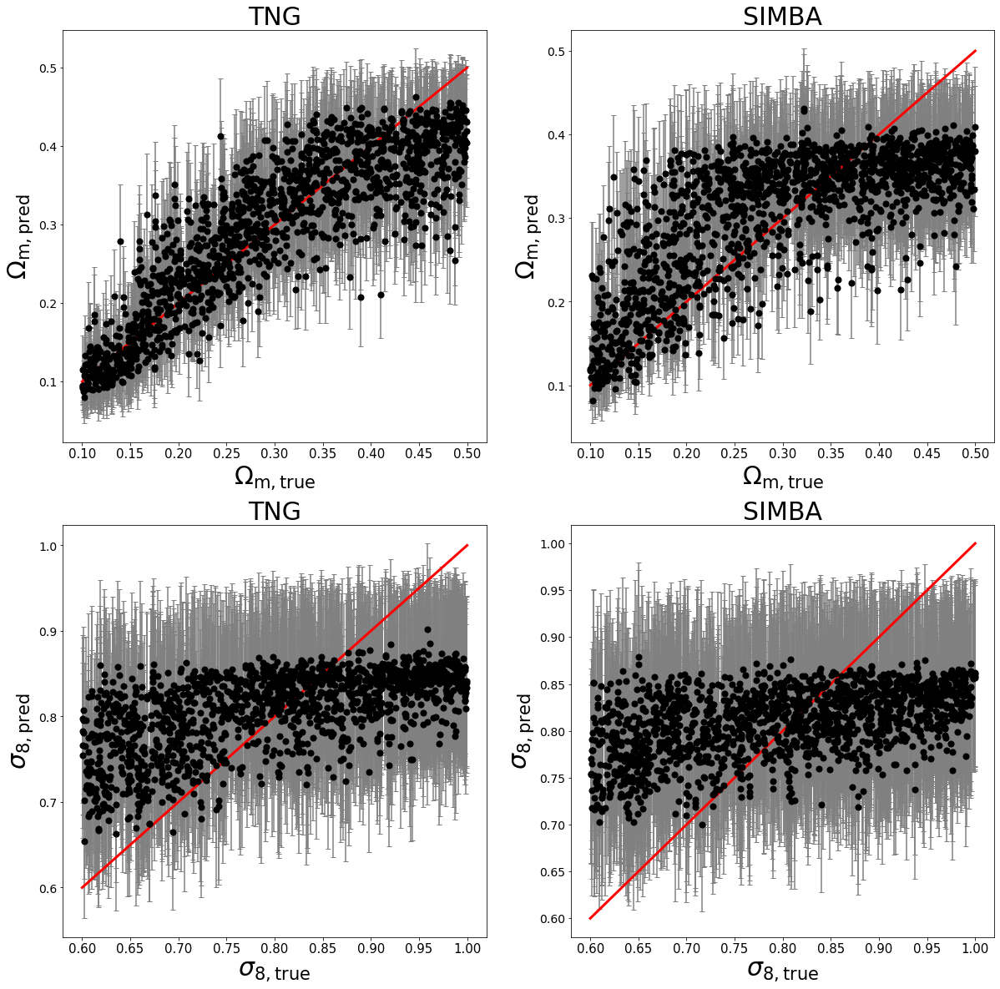

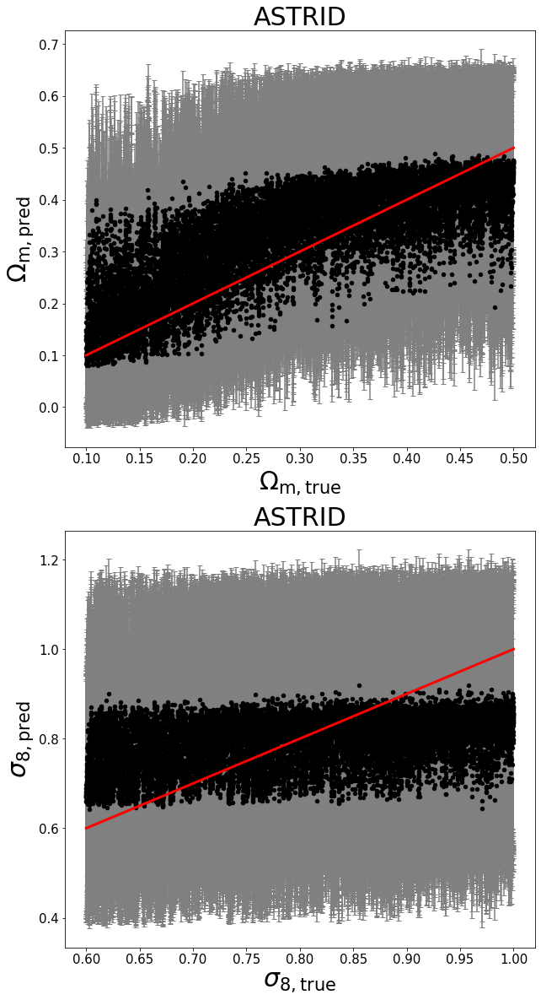

In [3]:
mist.get_score()
mist.make_plots(fname='cnn_test')
mist.test_on('ASTRID', show_score=True)

In [2]:
field = 'HI';
sim   = ['TNG', 'SIMBA']
#sim   = 'TNG'
norm = True
mono = False
fe=0.47;fd=0.1;z_dim=1000;dr=0.0
average=False
projection=True
fname = "TNG_{}_test".format(field)
mist = MIST(sim=sim,field=field, normalization=norm, monopole=mono, average=average, data_type='wph',
            L=4, dn=0, projection=projection,batch_size=100, proc_imag=np.absolute)
mist.train(which_machine='vib+cls', tol=1e-5,z_dim=z_dim, hidden1=fe, hidden2=fd,dr=dr,
           patience=50, gamma=1e-4, beta=0,epochs=1000,learning_rate=1e-4, fname=fname, save_plot=True,
           save_model=False)


You can't use no monopole with projection!
Turning on monopole...
epoch 0   | loss: -8.06803 | accuracy: 0.71337  | val_loss: -9.71863 | Om_m: 0.26343  | sig8: 0.12338 
epoch 1   | loss: -9.26556 | accuracy: 0.40767  | val_loss: -9.47304 | Om_m: 0.16922  | sig8: 0.12414 
epoch 2   | loss: -9.61761 | accuracy: 0.3543   | val_loss: -10.12892 | Om_m: 0.1354   | sig8: 0.12197 
epoch 3   | loss: -9.72688 | accuracy: 0.33797  | val_loss: -10.39015 | Om_m: 0.16641  | sig8: 0.12084 
epoch 4   | loss: -9.90482 | accuracy: 0.3249   | val_loss: -10.48183 | Om_m: 0.13304  | sig8: 0.12264 
epoch 5   | loss: -10.02592 | accuracy: 0.30553  | val_loss: -10.00779 | Om_m: 0.13621  | sig8: 0.11917 
epoch 6   | loss: -10.06827 | accuracy: 0.29803  | val_loss: -10.50042 | Om_m: 0.16295  | sig8: 0.11927 
epoch 7   | loss: -10.16101 | accuracy: 0.29471  | val_loss: -9.99314 | Om_m: 0.22292  | sig8: 0.12291 
epoch 8   | loss: -10.16686 | accuracy: 0.29055  | val_loss: -10.69483 | Om_m: 0.10547  | sig8: 0.1198

KeyboardInterrupt: 

$\Omega_m$: MSE=0.001, % error=7.500%, R2 score=0.918,chi2=198.464, bias=0.023
$\sigma_8$: MSE=0.005, % error=6.945%, R2 score=0.658,chi2=1.098, bias=-0.021
The ROC AUC score for classification is 0.9725341130604288.

(3000, 2)
$\Omega_m$: MSE=0.004, % error=16.042%, R2 score=0.719,chi2=926.754, bias=-0.095
$\sigma_8$: MSE=0.113, % error=36.030%, R2 score=-7.473,chi2=63.672, bias=0.357


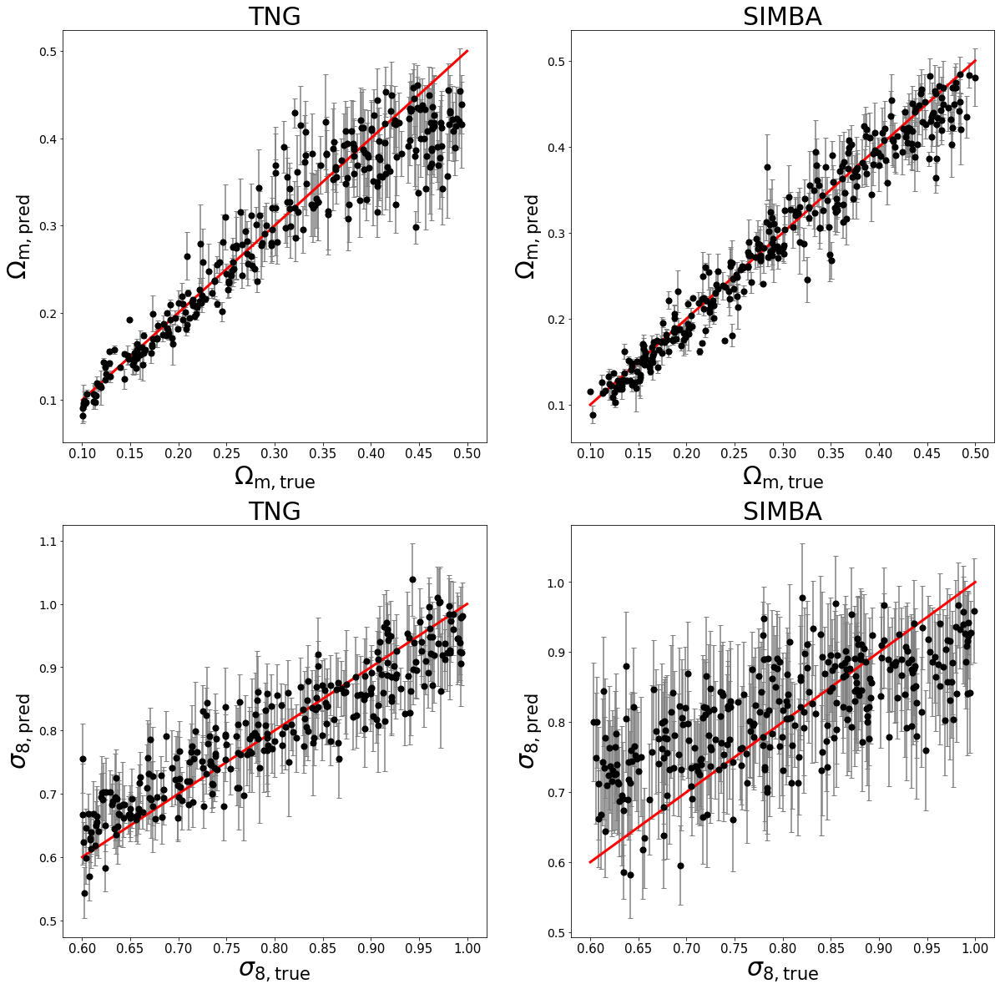

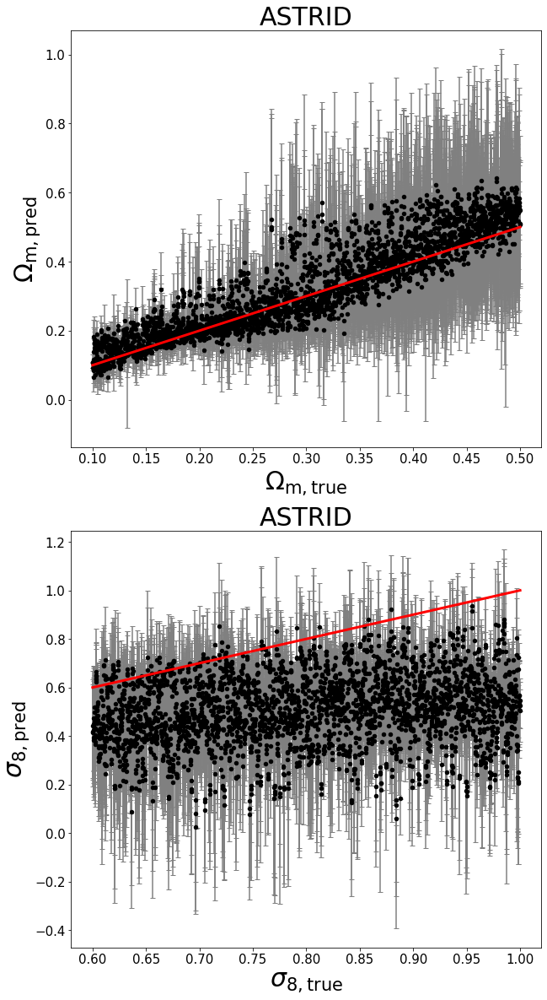

In [3]:
mist.get_score()
mist.make_plots(fname='cnn_test')
mist.test_on('ASTRID', show_score=True)

epoch 0   | loss: -3.87116 | accuracy: 3.3554   | val_loss: -4.14983 | Om_m: 1.35449  | sig8: 0.47954 
epoch 1   | loss: -7.14369 | accuracy: 0.81891  | val_loss: -7.58194 | Om_m: 0.68645  | sig8: 0.13832 
epoch 2   | loss: -8.67297 | accuracy: 0.51509  | val_loss: -8.61342 | Om_m: 0.4295   | sig8: 0.13173 
epoch 3   | loss: -9.08105 | accuracy: 0.42566  | val_loss: -8.63768 | Om_m: 0.31207  | sig8: 0.13971 


KeyboardInterrupt: 

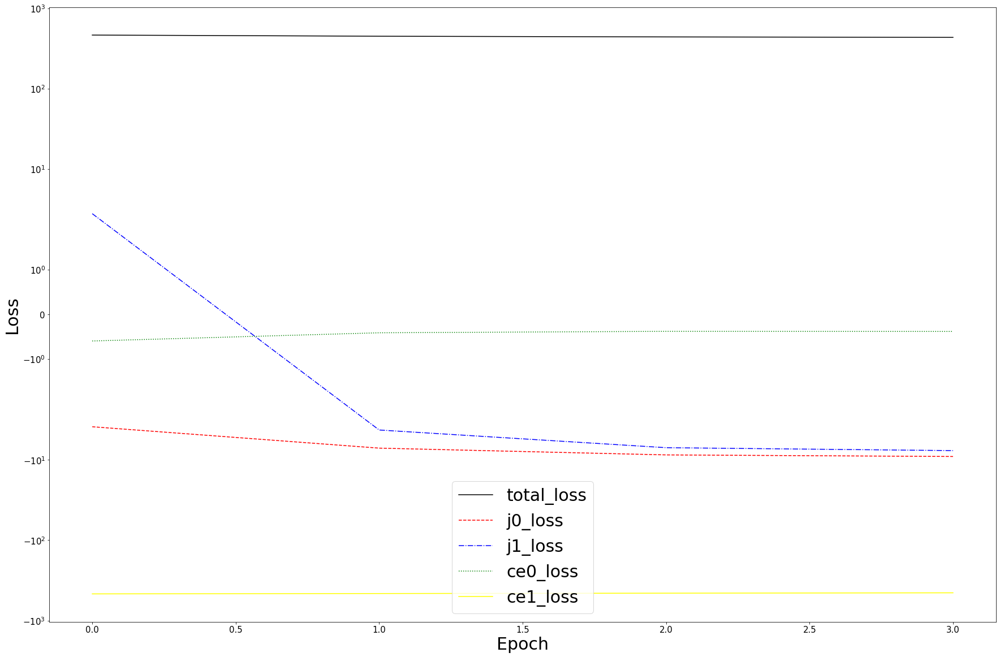

In [7]:
field = 'HI';
sim   = ['TNG', 'SIMBA']
#sim   = 'TNG'
norm = True
mono = True
fe=0.47;fd=0.1;z_dim=1000;dr=0.0
average=True
projection=False
fname = "TNG_{}_test".format(field)
mist = MIST(sim=sim,field=field, normalization=norm, monopole=mono, average=average, data_type='wph',
            L=4, dn=0, projection=projection,batch_size=100, proc_imag=np.absolute)
mist.train(which_machine='vib+cls', tol=1e-5,z_dim=z_dim, hidden1=fe, hidden2=fd,dr=dr,
           patience=50, gamma=1e-1, beta=1,epochs=1000,learning_rate=1e-4, fname=fname, save_plot=True,
           save_model=False)


$\Omega_m$: MSE=0.001, % error=8.238%, R2 score=0.914,chi2=87402.642, bias=-0.004
$\sigma_8$: MSE=0.005, % error=7.629%, R2 score=0.599,chi2=1.038, bias=-0.019
The ROC AUC score for classification is 0.2659927596769702.

(3000, 2)
$\Omega_m$: MSE=0.003, % error=14.723%, R2 score=0.795,chi2=90.250, bias=-0.126
$\sigma_8$: MSE=0.075, % error=28.357%, R2 score=-4.606,chi2=231966.407, bias=0.274


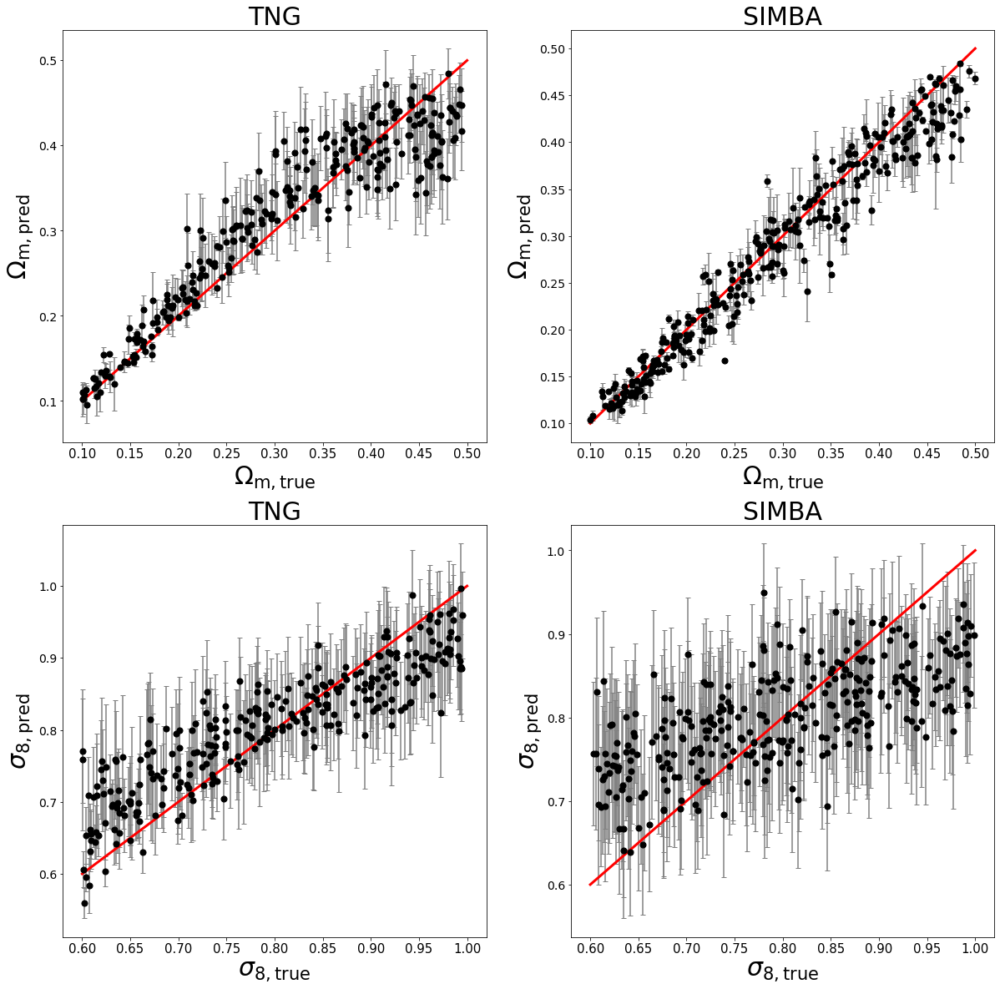

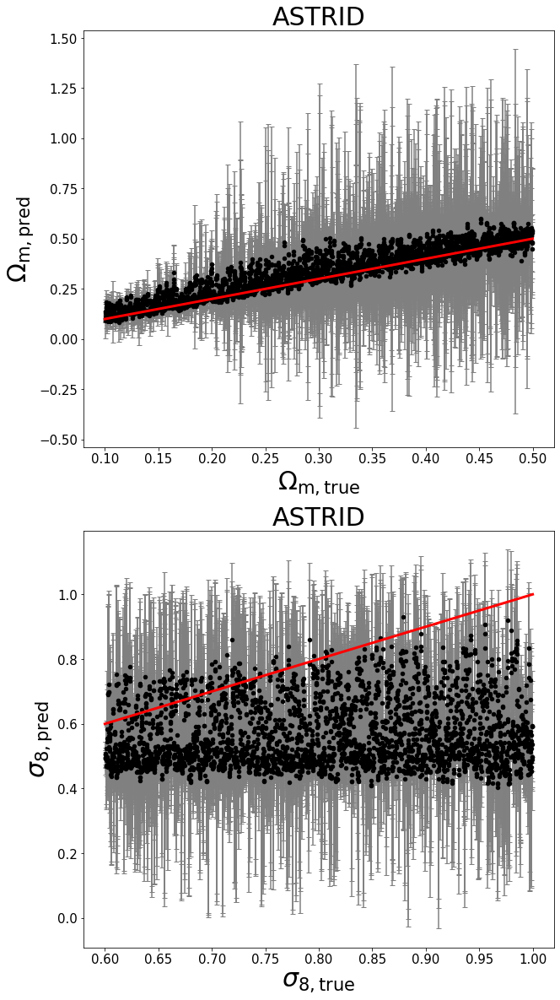

In [5]:
mist.get_score()
mist.make_plots(fname='cnn_test')
mist.test_on('ASTRID', show_score=True)

epoch 0   | loss: -5.00613 | accuracy: 1.39706  | val_loss: -5.86825 | Om_m: 0.60096  | sig8: 0.25647 
epoch 1   | loss: -6.17221 | accuracy: 0.8667   | val_loss: -6.72876 | Om_m: 0.76421  | sig8: 0.14222 
epoch 2   | loss: -6.9027  | accuracy: 0.90735  | val_loss: -7.27112 | Om_m: 0.67391  | sig8: 0.13228 
epoch 3   | loss: -7.86193 | accuracy: 0.5935   | val_loss: -8.64939 | Om_m: 0.26591  | sig8: 0.1823  
epoch 4   | loss: -8.28061 | accuracy: 0.52229  | val_loss: -9.12682 | Om_m: 0.18871  | sig8: 0.1427  
epoch 5   | loss: -8.72183 | accuracy: 0.43342  | val_loss: -7.29253 | Om_m: 0.64557  | sig8: 0.15616 
epoch 6   | loss: -8.71302 | accuracy: 0.45116  | val_loss: -9.14423 | Om_m: 0.18056  | sig8: 0.13416 
epoch 7   | loss: -9.06313 | accuracy: 0.39704  | val_loss: -7.59088 | Om_m: 0.52734  | sig8: 0.15924 
epoch 8   | loss: -9.17799 | accuracy: 0.38583  | val_loss: -8.70852 | Om_m: 0.29292  | sig8: 0.14372 
epoch 9   | loss: -9.31454 | accuracy: 0.36508  | val_loss: -8.79445 | Om

KeyboardInterrupt: 

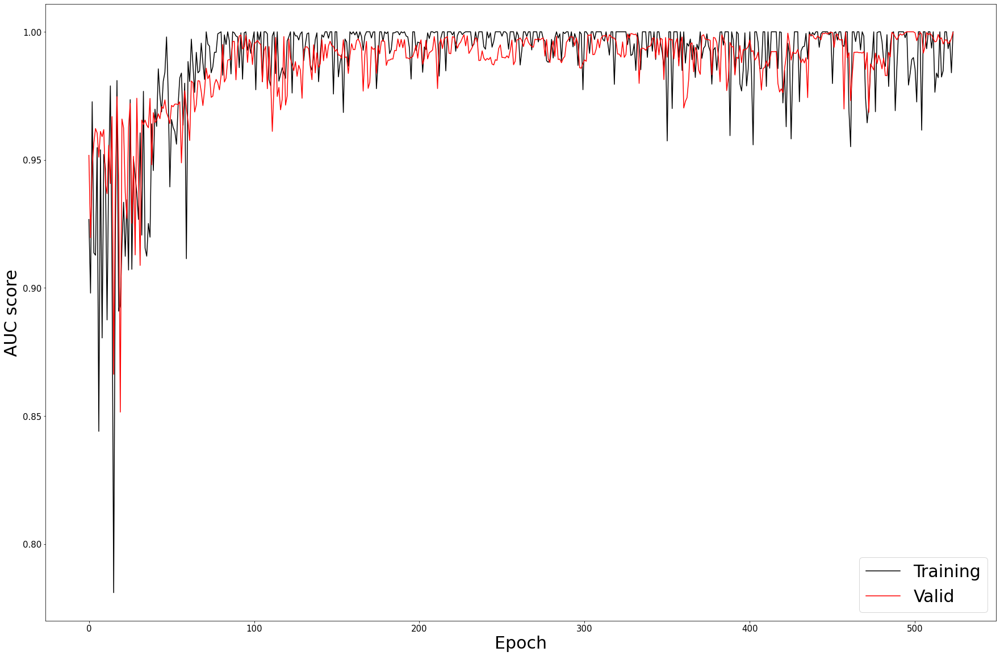

In [15]:
field = 'HI';
sim   = ['TNG', 'SIMBA']
#sim   = 'TNG'
norm = True
mono = False
fe=0.47;fd=0.1;z_dim=1000;dr=0.0
average=True
projection=False
fname = "TNG_{}_test".format(field)
mist = MIST(sim=sim,field=field, normalization=norm, monopole=mono, average=average, data_type='wph',
            L=4, dn=2, projection=projection,batch_size=100, proc_imag=np.absolute)
mist.train(which_machine='vib+cls', tol=1e-5,z_dim=z_dim, hidden1=fe, hidden2=fd,dr=dr,
           patience=50, gamma=1e-4, beta=0,epochs=1000,learning_rate=1e-4, fname=fname, save_plot=True,
           save_model=False)


$\Omega_m$: MSE=0.001, % error=5.854%, R2 score=0.957,chi2=186.331, bias=-0.017
$\sigma_8$: MSE=0.002, % error=4.390%, R2 score=0.832,chi2=37.079, bias=0.008
The ROC AUC score for classification is 0.9973247324732473.

(1000, 2)
$\Omega_m$: MSE=0.011, % error=29.984%, R2 score=0.202,chi2=40745489.416, bias=-0.296
$\sigma_8$: MSE=0.035, % error=18.502%, R2 score=-1.653,chi2=21290.864, bias=0.170


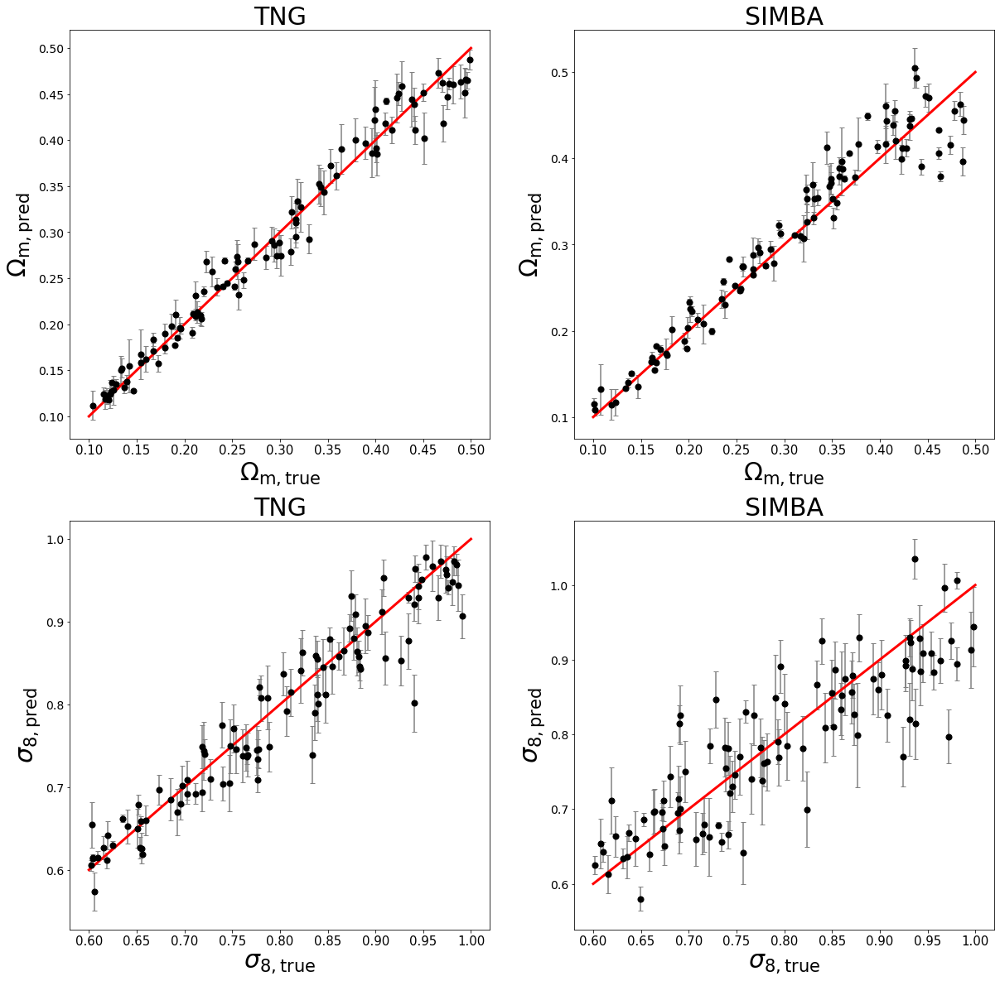

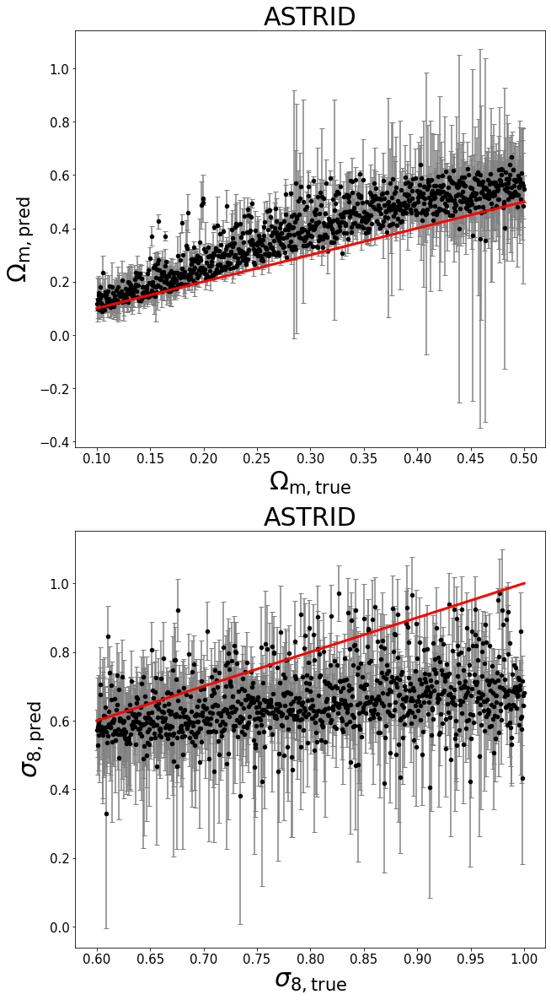

In [16]:
mist.get_score()
mist.make_plots(fname='cnn_test')
mist.test_on('ASTRID', show_score=True)

In [10]:
field = 'HI';
sim   = ['TNG', 'SIMBA']
#sim   = 'TNG'
norm = True
mono = True
fe=0.47;fd=0.1;z_dim=1000;dr=0.0
average=True
projection=False
fname = "TNG_{}_test".format(field)
mist = MIST(sim=sim,field=field, normalization=norm, monopole=mono, average=average, data_type='wph',
            L=4, dn=2, projection=projection,batch_size=100, proc_imag=np.absolute)
mist.train(which_machine='vib+cls', tol=1e-5,z_dim=z_dim, hidden1=fe, hidden2=fd,dr=dr,
           patience=50, gamma=1e-4, beta=0,epochs=1000,learning_rate=1e-4, fname=fname, save_plot=True,
           save_model=False)


epoch 0   | loss: -5.9382  | accuracy: 1.77177  | val_loss: -8.83693 | Om_m: 0.35187  | sig8: 0.13608 
epoch 1   | loss: -8.5443  | accuracy: 0.55791  | val_loss: -8.99879 | Om_m: 0.40649  | sig8: 0.12978 
epoch 2   | loss: -9.20997 | accuracy: 0.43227  | val_loss: -9.10496 | Om_m: 0.2183   | sig8: 0.14708 
epoch 3   | loss: -9.43569 | accuracy: 0.41397  | val_loss: -9.38005 | Om_m: 0.31972  | sig8: 0.14389 
epoch 4   | loss: -9.52597 | accuracy: 0.41584  | val_loss: -9.75072 | Om_m: 0.19548  | sig8: 0.13933 
epoch 5   | loss: -9.75752 | accuracy: 0.36188  | val_loss: -9.98136 | Om_m: 0.24036  | sig8: 0.12922 
epoch 6   | loss: -9.85892 | accuracy: 0.35843  | val_loss: -10.24504 | Om_m: 0.17093  | sig8: 0.13409 
epoch 7   | loss: -10.02042 | accuracy: 0.32775  | val_loss: -10.55162 | Om_m: 0.16936  | sig8: 0.12808 
epoch 8   | loss: -10.15224 | accuracy: 0.30993  | val_loss: -10.5728 | Om_m: 0.16169  | sig8: 0.13149 
epoch 9   | loss: -10.2627 | accuracy: 0.29374  | val_loss: -10.68119

KeyboardInterrupt: 

In [3]:
field = 'HI';
sim   = ['TNG', 'SIMBA']
#sim   = 'TNG'
norm = True
mono = True
fe=0.4;fd=0.4;z_dim=200;dr=0.01
average=False
projection=False
fname = "TNG_{}_test".format(field)
mist = MIST(sim=sim,field=field, normalization=norm, monopole=mono, average=average, data_type='wph',
            L=4, dn=2, projection=projection,batch_size=1000, proc_imag=np.absolute)
mist.train(which_machine='vib+cls', tol=1e-5,z_dim=z_dim, hidden1=fe, hidden2=fd,dr=dr,
           patience=50, gamma=1e-4, beta=0,epochs=1000,learning_rate=1e-3, fname=fname, save_plot=True,
           save_model=False)

epoch 0   | loss: -5.66375 | accuracy: 1.21776  | val_loss: -6.89349 | Om_m: 0.77252  | sig8: 0.1376  
epoch 1   | loss: -6.7809  | accuracy: 0.73591  | val_loss: -8.04468 | Om_m: 0.37294  | sig8: 0.15721 
epoch 2   | loss: -7.89307 | accuracy: 0.57701  | val_loss: -8.62627 | Om_m: 0.41184  | sig8: 0.12668 
epoch 3   | loss: -8.22649 | accuracy: 0.57155  | val_loss: -8.73982 | Om_m: 0.42309  | sig8: 0.12656 
epoch 4   | loss: -8.33411 | accuracy: 0.56389  | val_loss: -8.64204 | Om_m: 0.41842  | sig8: 0.12701 
epoch 5   | loss: -8.32932 | accuracy: 0.56632  | val_loss: -8.69021 | Om_m: 0.41133  | sig8: 0.12672 
epoch 6   | loss: -8.43389 | accuracy: 0.55675  | val_loss: -8.6863  | Om_m: 0.45544  | sig8: 0.13117 
epoch 7   | loss: -8.47308 | accuracy: 0.55804  | val_loss: -8.70376 | Om_m: 0.45387  | sig8: 0.13049 
epoch 8   | loss: -8.53184 | accuracy: 0.55361  | val_loss: -8.76596 | Om_m: 0.41303  | sig8: 0.12652 
epoch 9   | loss: -8.57804 | accuracy: 0.54889  | val_loss: -8.76465 | Om

True

In [2]:
field = 'Mtot';
sim   = ['TNG', 'SIMBA']
#sim   = 'TNG'
norm = True
mono = True
fe=0.4;fd=0.4;z_dim=200;dr=0.01
average=False
projection=False
fname = "TNG_{}_test".format(field)
mist = MIST(sim=sim,field=field, normalization=norm, monopole=mono, average=average, data_type='wph',
            L=4, dn=2, projection=projection,batch_size=1000, proc_imag=np.absolute)
mist.train(which_machine='vib+cls', tol=1e-5,z_dim=z_dim, hidden1=fe, hidden2=fd,dr=dr,
           patience=50, gamma=1e-4, beta=0,epochs=1000,learning_rate=1e-3, fname=fname, save_plot=True,
           save_model=False)

epoch 0   | loss: -6.04115 | accuracy: 1.0013   | val_loss: -7.91565 | Om_m: 0.39924  | sig8: 0.13226 
epoch 1   | loss: -7.43978 | accuracy: 0.62537  | val_loss: -8.47249 | Om_m: 0.41154  | sig8: 0.13643 
epoch 2   | loss: -7.88965 | accuracy: 0.60977  | val_loss: -8.59058 | Om_m: 0.45257  | sig8: 0.13235 
epoch 3   | loss: -8.01308 | accuracy: 0.6047   | val_loss: -8.52115 | Om_m: 0.40724  | sig8: 0.13956 
epoch 4   | loss: -8.19958 | accuracy: 0.58075  | val_loss: -8.73468 | Om_m: 0.43163  | sig8: 0.1293  
epoch 5   | loss: -8.35791 | accuracy: 0.55302  | val_loss: -8.89414 | Om_m: 0.41624  | sig8: 0.12886 
epoch 6   | loss: -8.48942 | accuracy: 0.53103  | val_loss: -9.06166 | Om_m: 0.34768  | sig8: 0.13032 
epoch 7   | loss: -8.63125 | accuracy: 0.50756  | val_loss: -8.98587 | Om_m: 0.32517  | sig8: 0.12806 
epoch 8   | loss: -8.737   | accuracy: 0.49099  | val_loss: -9.21665 | Om_m: 0.35606  | sig8: 0.12411 
epoch 9   | loss: -8.90989 | accuracy: 0.46487  | val_loss: -9.34962 | Om


KeyboardInterrupt



<Figure size 2160x1440 with 0 Axes>

In [ ]:
mist.output.shape

In [ ]:
field = 'Mtot';
sim   = ['TNG', 'SIMBA']
#sim   = 'TNG'
norm       = False
mono       = True
average    = False
projection = False

fe=0.4;fd=0.4;z_dim=200;dr=0.01
fname = "TNG_{}_test".format(field)
mist = MIST(sim=sim,field=field, normalization=norm, monopole=mono, average=average, data_type='wph',
            L=4, dn=2, projection=projection,batch_size=100, proc_imag=np.absolute)
mist.train(which_machine='vib', tol=1e-5,z_dim=z_dim, hidden1=fe, hidden2=fd,dr=dr,
           patience=50, gamma=1e-4, beta=0,epochs=500,learning_rate=1e-4, fname=fname, save_plot=True,
           save_model=False)

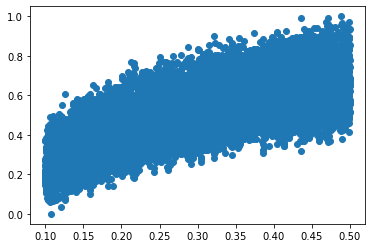

In [35]:
plt.scatter(mist.output[:,0], mist.input[:,-1])

In [19]:
field = 'HI';
sim   = 'TNG' #['TNG', 'SIMBA']
norm = True
mono = True
fe=0.5;fd=0.5;z_dim=500;dr=0.01
average=False
projection=False
fname = "TNG_{}_test".format(field)
mist = MIST(sim=sim,field=field, normalization=norm, monopole=mono, average=average, data_type='wph',
            L=4, dn=2, projection=projection,batch_size=100, proc_imag=np.absolute)
mist.train(which_machine='vib',tol=1e-5,z_dim=z_dim,hidden1=fe, hidden2=fd,dr=dr,
           patience=50, gamma=0, beta=0,epochs=500,learning_rate=1e-3, fname=fname, save_plot=True
           , save_model=False)

epoch 0   | loss: -4.28704 | accuracy: 0.4529   | val_loss: -4.37018 | Om_m: 0.43112 
epoch 1   | loss: -4.3065  | accuracy: 0.44434  | val_loss: -4.36811 | Om_m: 0.42628 
epoch 2   | loss: -4.44176 | accuracy: 0.41254  | val_loss: -4.72939 | Om_m: 0.35355 
epoch 3   | loss: -5.46504 | accuracy: 0.20553  | val_loss: -5.82053 | Om_m: 0.15235 
epoch 4   | loss: -5.72125 | accuracy: 0.16679  | val_loss: -5.75195 | Om_m: 0.17487 
epoch 5   | loss: -5.60526 | accuracy: 0.17877  | val_loss: -5.78888 | Om_m: 0.14953 
epoch 6   | loss: -5.6283  | accuracy: 0.17382  | val_loss: -5.8588  | Om_m: 0.14669 
epoch 7   | loss: -5.61383 | accuracy: 0.1792   | val_loss: -5.86365 | Om_m: 0.15608 
epoch 8   | loss: -5.75073 | accuracy: 0.16465  | val_loss: -5.69715 | Om_m: 0.15801 
epoch 9   | loss: -5.88391 | accuracy: 0.15197  | val_loss: -5.85164 | Om_m: 0.15672 
epoch 10  | loss: -6.05498 | accuracy: 0.13636  | val_loss: -6.05699 | Om_m: 0.13835 
epoch 11  | loss: -6.10984 | accuracy: 0.13031  | val_

True

In [4]:
mist.output.shape

(15000, 2)

In [ ]:
mist.make_plots()

In [9]:
mist.input

array([[-3.93226133e-04, -5.80304331e-04, -1.23215459e-04, ...,
        -3.52870779e-03, -3.52871247e-03, -3.52870779e-03],
       [-1.12361012e-03, -1.26402932e-03, -9.94596341e-04, ...,
        -3.52870779e-03, -3.52878642e-03, -3.52870779e-03],
       [-1.06534380e-03, -1.30326703e-03, -1.07679520e-03, ...,
        -3.52870779e-03, -3.52874082e-03, -3.52870779e-03],
       ...,
       [-1.72518984e-04, -6.38945707e-04, -3.80103120e-04, ...,
        -3.52870779e-03, -3.52874613e-03, -3.52870779e-03],
       [-9.29479265e-05, -6.22394626e-04, -4.20467453e-04, ...,
        -3.52870779e-03, -3.52877631e-03, -3.52870779e-03],
       [-1.03069373e-03, -1.39478849e-03, -1.22395396e-03, ...,
        -3.52870779e-03, -3.52875167e-03, -3.52870779e-03]])

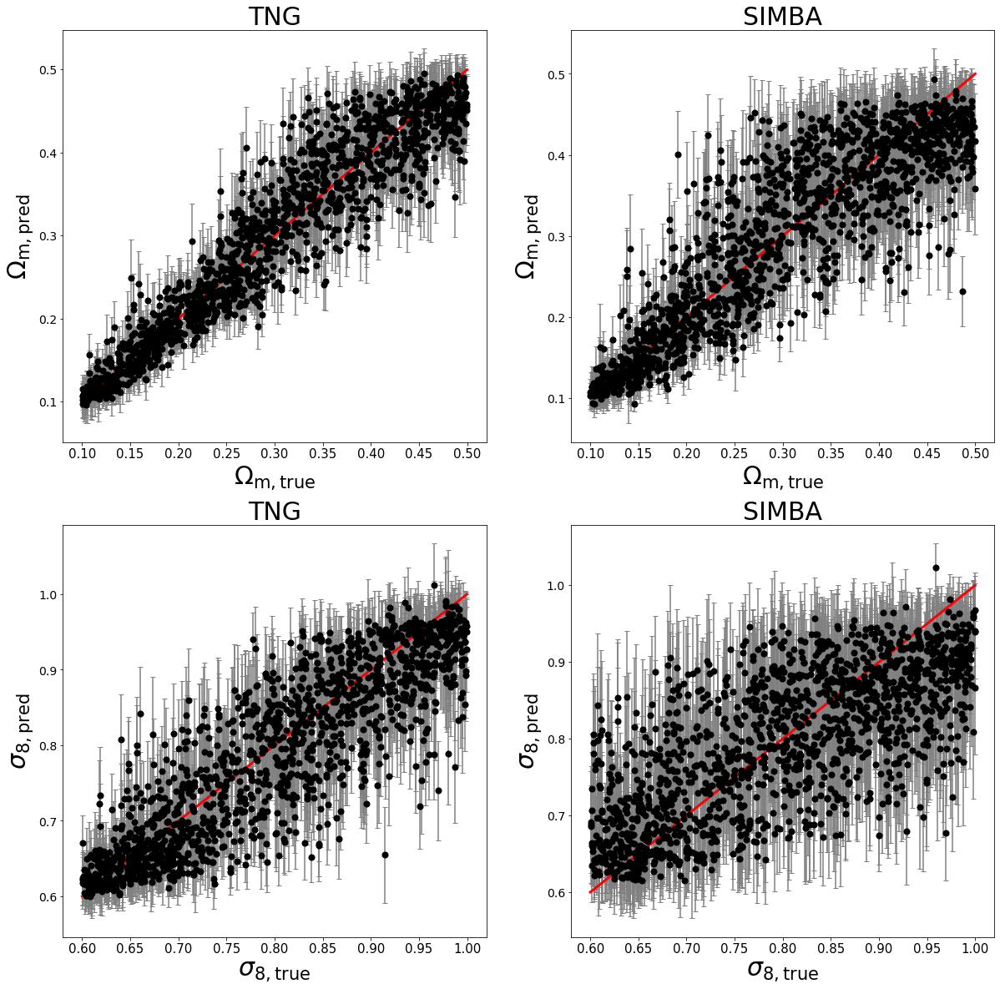

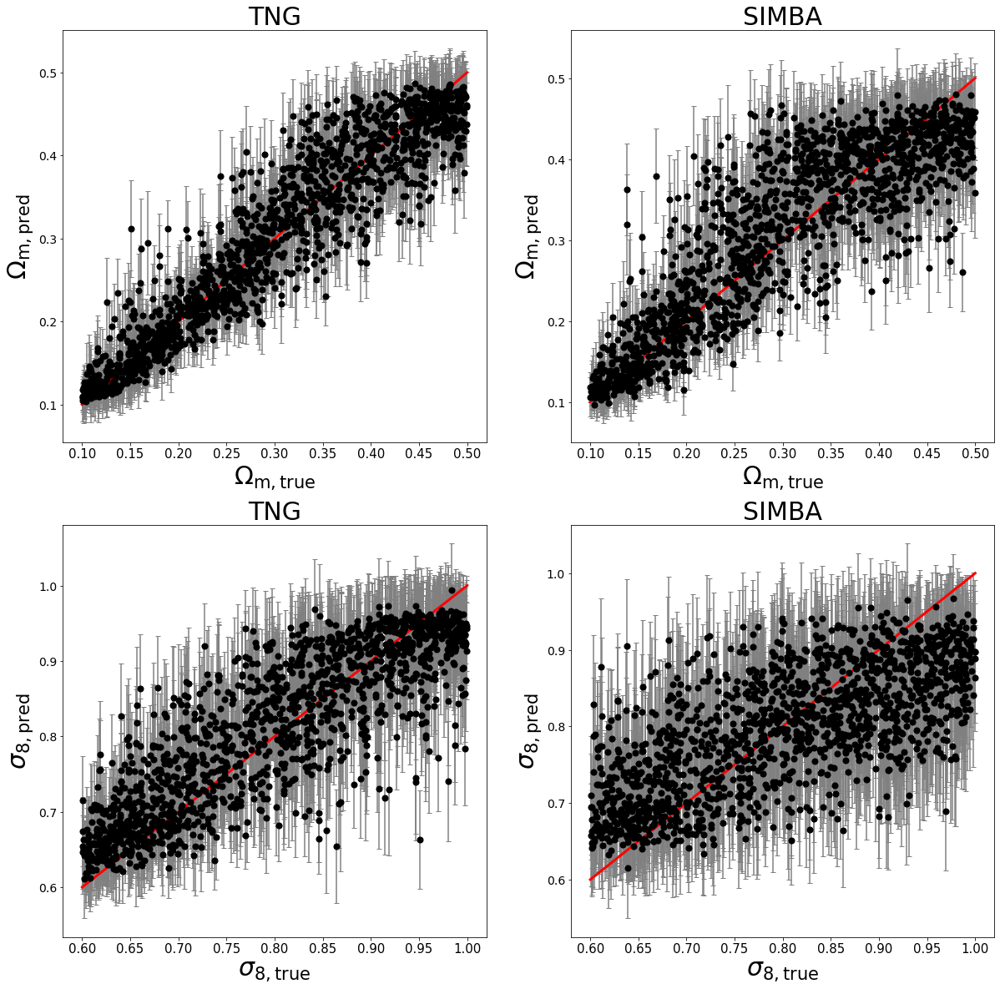

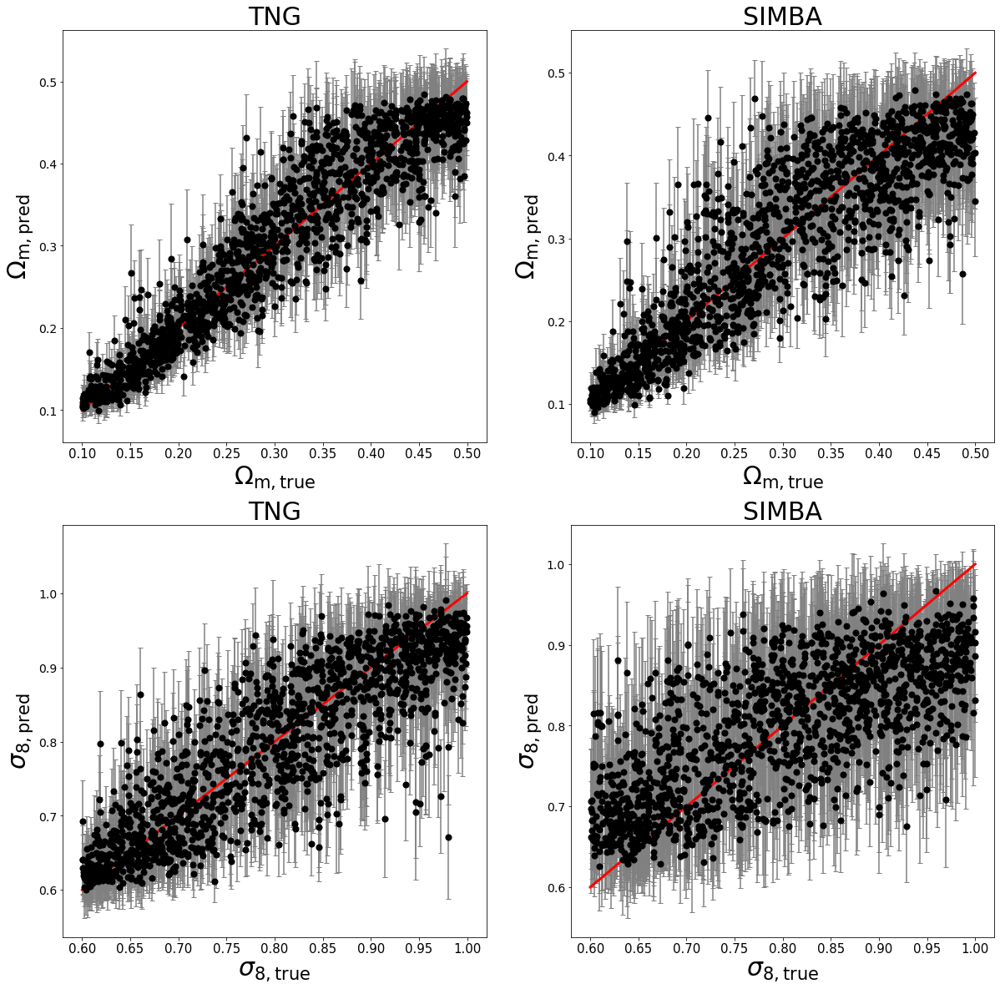

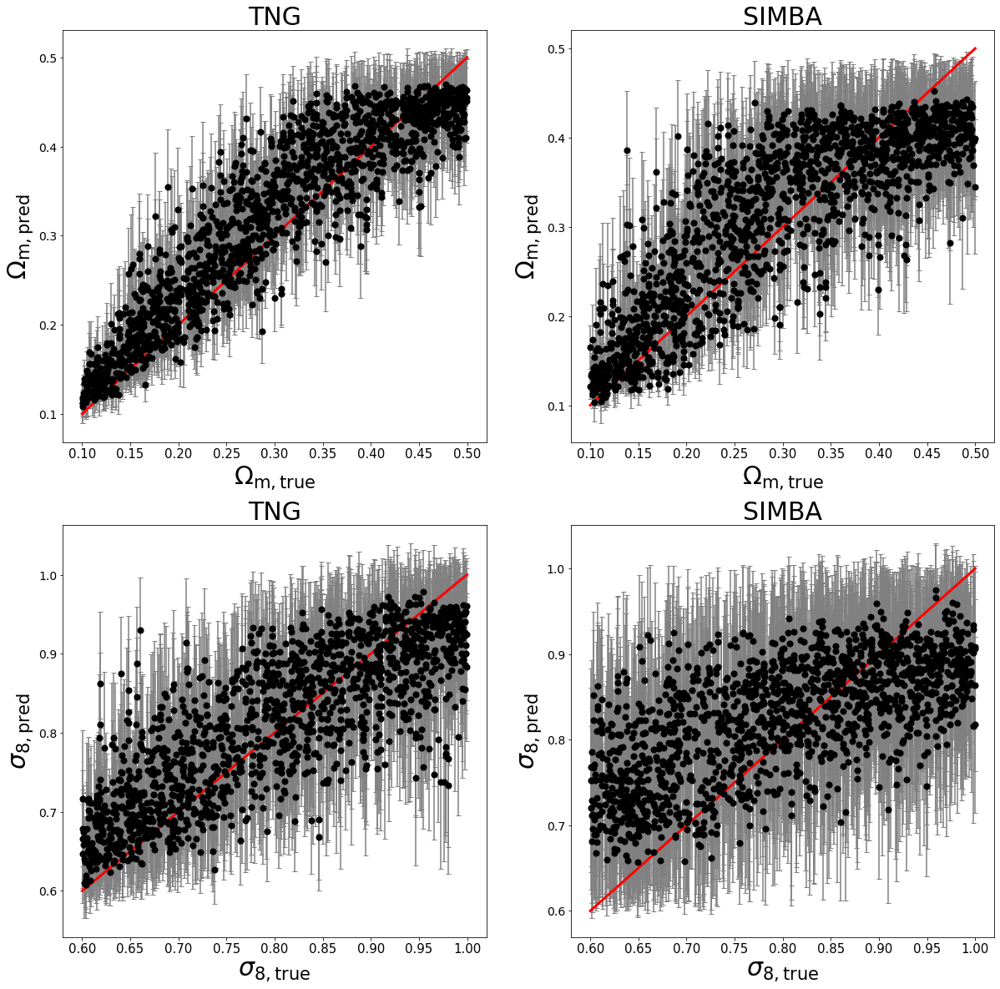

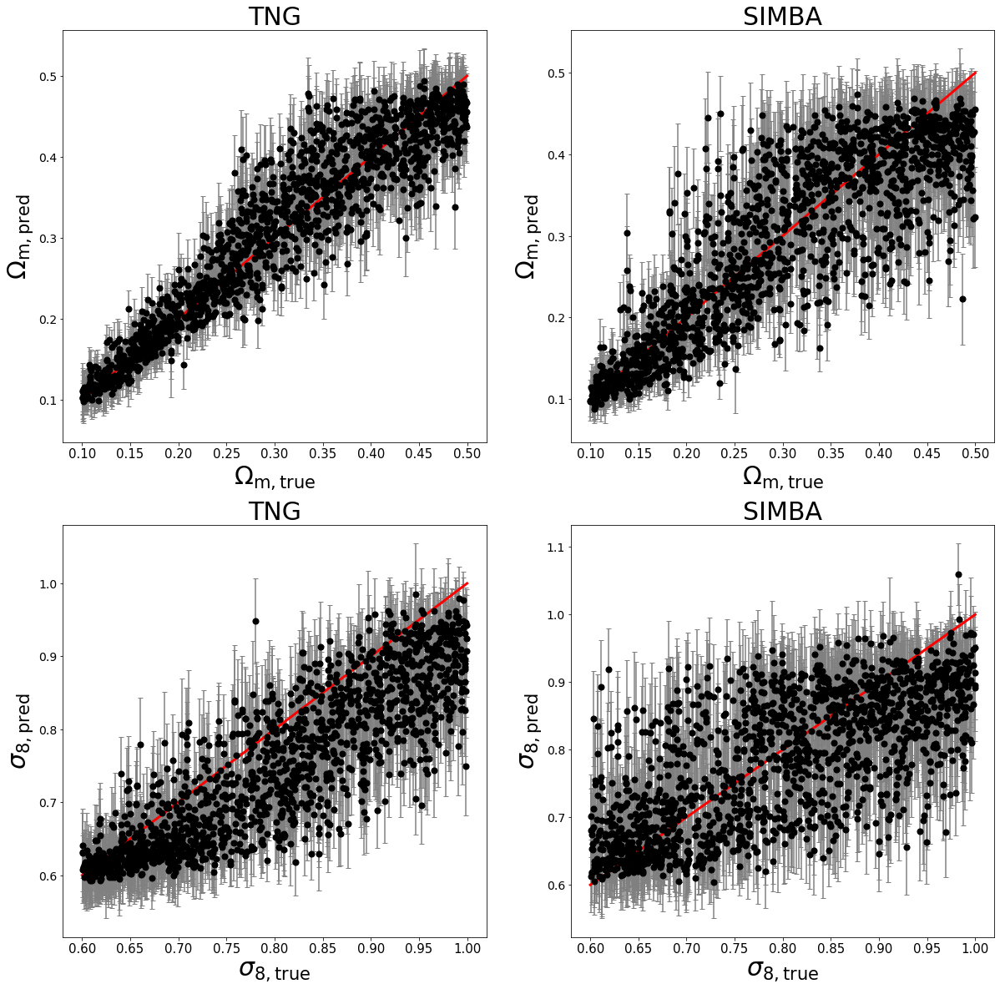

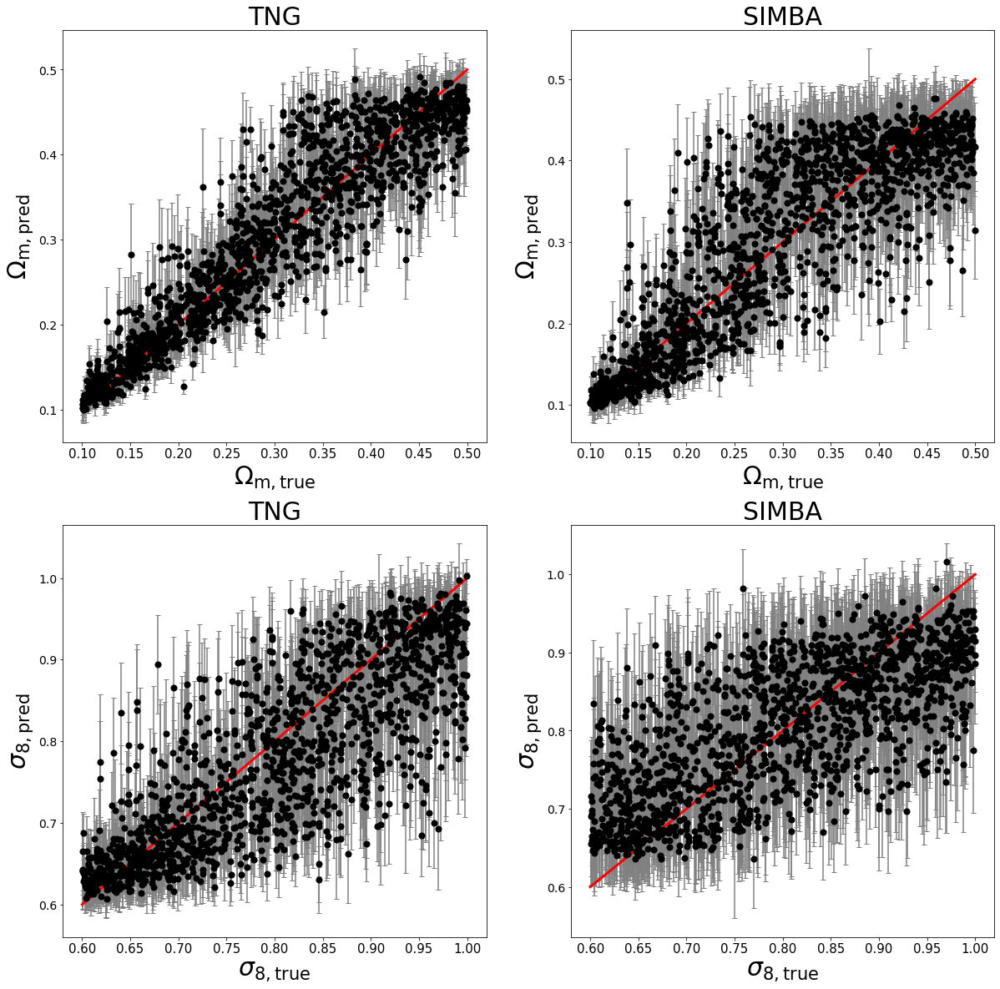

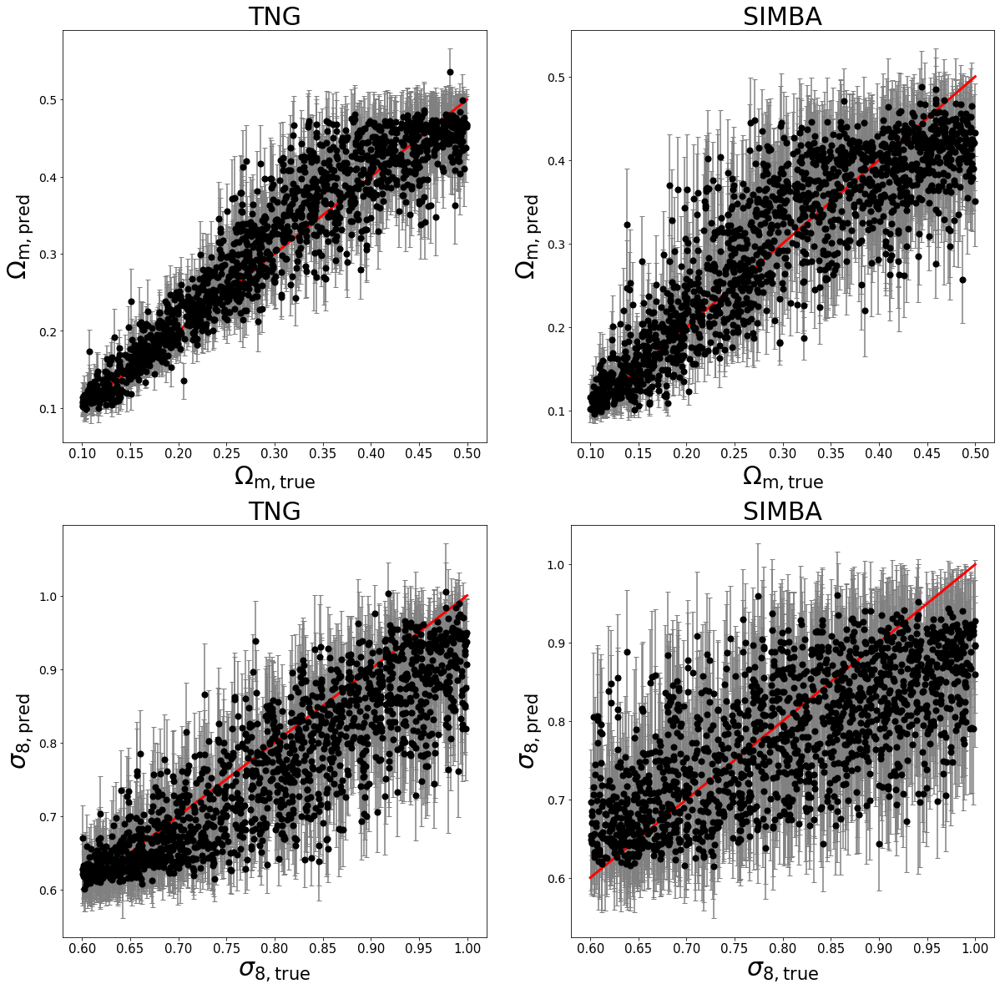

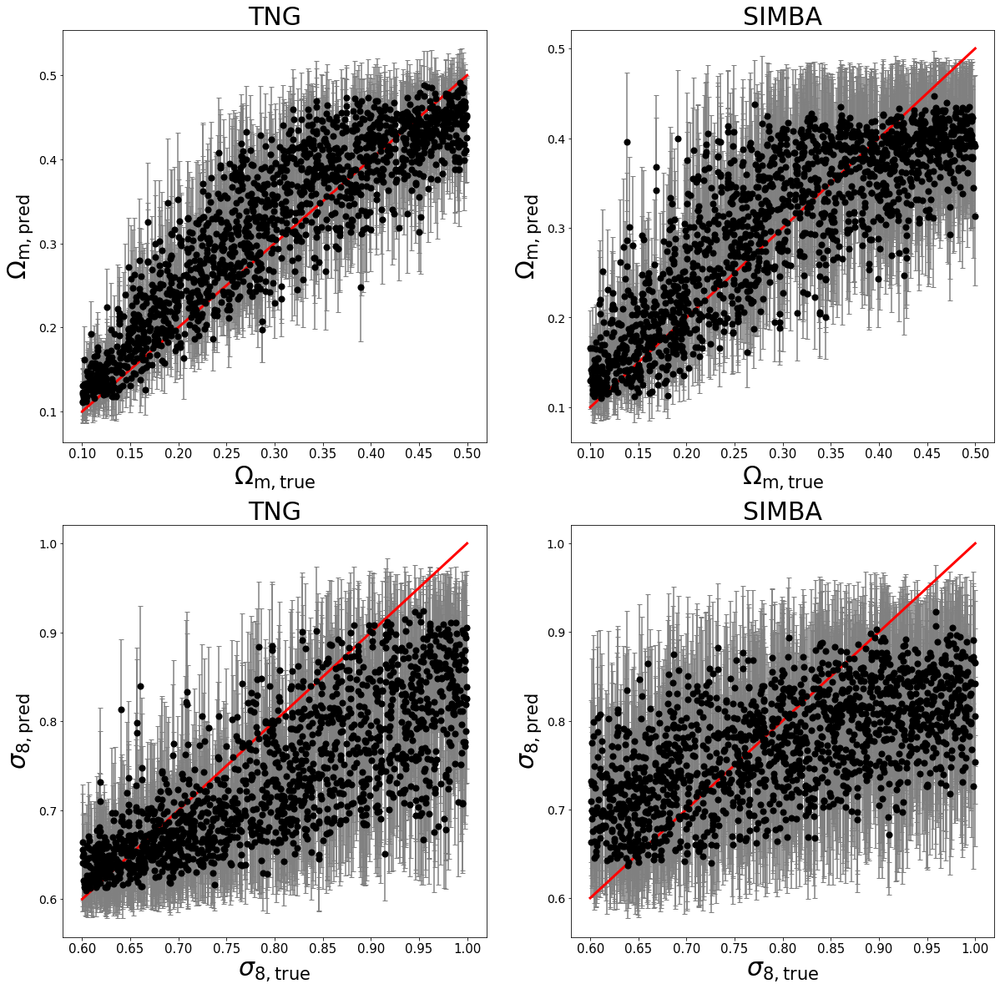

In [10]:
field = "ne";
#field = "T";
field_name = field
fe=0.3;fd=0.6;z_dim=400;dr=0.1

betas  = [0.1,1]#,10,100]
gammas = [0.001, 0.01,0.1,1]
#betas  = [10]#,1,10,100]
#gammas = [0.1]#, 0.01,0.1,1]

data = np.empty((4,4),dtype=object)
for i in range(len(betas)):
    for j in range(len(gammas)):
        beta, gamma = betas[i], gammas[j]
        fname = "search/TNG_SIMBA_{}_b_{}_g_{}".format(field_name, beta, gamma)
        mist = MIST(sim=["TNG","SIMBA"],field=field, L=4, dn=0, 
                    monopole=True, normalization=True, average=False, projection=False)
        mist.load_models(which_machine='vib+cls', fname=fname, z_dim=z_dim, hidden1=fe, hidden2=fd,dr=dr)
        mist.make_plots(show_plot=True)
        plt.show()
        y_true, y_pred = mist.test_on(sims="ASTRID", fname="0.01", data_return=True,show_plot=False, 
                                      show_score=False, save_plot=False)
        data[i,j] = (y_true, y_pred)

Text(0, 0.5, '$\\Omega_\\mathrm{m, pred}$')

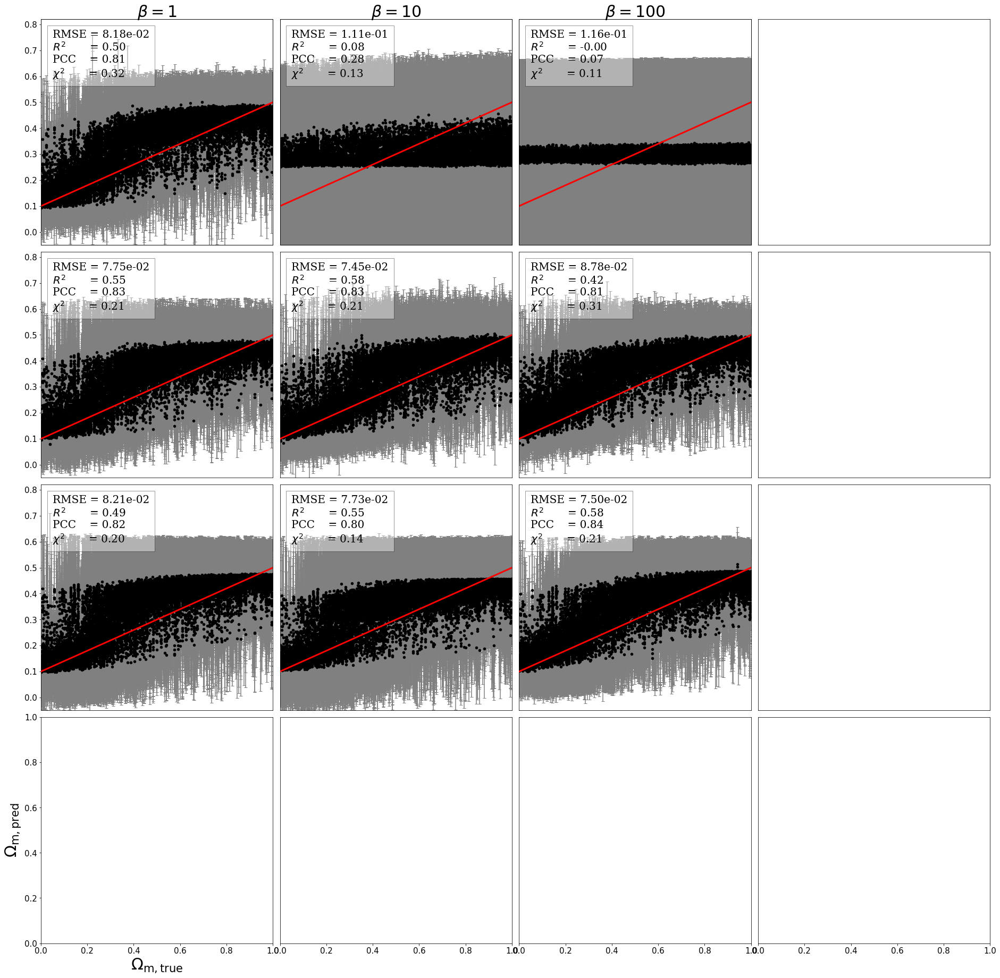

In [5]:
fig_shape = (4,4)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(32,32),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,0.5,3)
ideal2 = np.linspace(0.2,1.2,3)


#betas  = [1,10,100]
#gammas = [ 0.01,0.1,1]

for i in range(len(betas)):
    for j in range(len(gammas)):
        beta, gamma = betas[i], gammas[j]
        y_true, y_pred = data[i,j]
        axes[i,j].errorbar(y_true[:,0], y_pred[0][:,0], y_pred[1][:,0],linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true[:,0], y_pred[0][:,0],s=20,c='k', zorder=10)
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        RMSE = np.sqrt(mean_squared_error(y_true[:,0], y_pred[0][:,0]))
        R2   = r2_score(y_true[:,0], y_pred[0][:,0])
        PCC  = pearsonr(y_true[:,0], y_pred[0][:,0])[0]
        CHI2 = np.mean((y_true[:,0]-y_pred[0][:,0])**2/y_pred[1][:,0]**2)
        text_om = \
        r"""{:<5}= {:.2e}
{:<12}= {:.2f}
{:<7}= {:.2f}
{:<15}= {:.2f}""".format("RMSE", RMSE,"$R^2$", R2,
                            "PCC", PCC, "$\chi^2$", CHI2)
        axes[i,j].text(0.12, 0.78, text_om, fontsize=20,
                       ha='left', va='top',bbox=dict(facecolor='white', alpha=0.4,pad=10),zorder=12)
    
        remove_inner_axes(axes,fig_shape)
        axes[i,j].set_xlim(0.1,0.5)
        axes[i,j].set_ylim(-0.05,0.82) #(0.1,0.5)#
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"$\beta={}$".format(beta),fontsize=fontsize)
        if i == 3:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"$\gamma={}$".format(gamma),fontsize=fontsize)
axes[0,3].set_xlabel(r"$\Omega_\mathrm{m, true}$", fontsize=fontsize)
axes[0,3].set_ylabel(r"$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam.png", dpi=200, bbox_inches='tight')

In [2]:
field = 'HI';
sim   = 'ASTRID' #['TNG', 'SIMBA']
norm = True; mono = True
average=False; projection=False
batch_size = 128
fe=0.3;fd=0.6;z_dim=400;dr=0.1


fname = "{}_test_no_projection".format(sim, field)
mist = MIST(sim=sim,field=field, normalization=norm, monopole=mono, average=average, data_type='wph',
            L=4, dn=0, batch_size=batch_size,projection=projection)
mist.train(which_machine='vib',tol=1e-5,z_dim=z_dim,hidden1=fe, hidden2=fd,dr=dr,
           patience=50, gamma=1e-3, beta=1e-2,epochs=3000,learning_rate=1e-3, fname=fname, save_plot=True
           , save_model=False)

epoch 0   | loss: 4.39807  | accuracy: 0.00728  | val_loss: 8.41448  | Om_m: 0.58654  | sig8: 0.23875 
0.0 9.101114908854167e-05
0.0 0.05497582491408007
epoch 1   | loss: 3.00018  | accuracy: 0.00478  | val_loss: 7.38461  | Om_m: 0.42156  | sig8: 0.21419 
0.001251485697428385 7.536757787068686e-05
did it work?
0.6989439434193565 0.04623902562133811
did it work?
epoch 2   | loss: 1.83108  | accuracy: 0.00343  | val_loss: 6.37844  | Om_m: 0.30826  | sig8: 0.17486 
0.0014109829937970196 6.455521795484756e-05
did it work?
0.8810832996458603 0.03845551304572019
did it work?
epoch 3   | loss: 1.10231  | accuracy: 0.00281  | val_loss: 5.84276  | Om_m: 0.28919  | sig8: 0.15444 
0.0014538636525472004 5.719428221384685e-05
did it work?
1.1162133566401113 0.03228635866333672
did it work?
epoch 4   | loss: 0.6783   | accuracy: 0.00253  | val_loss: 5.51536  | Om_m: 0.23899  | sig8: 0.14053 
0.0014905817464192707 5.2077238082885746e-05
did it work?
1.197708715986699 0.02752482693404594
did it work?


KeyboardInterrupt: 

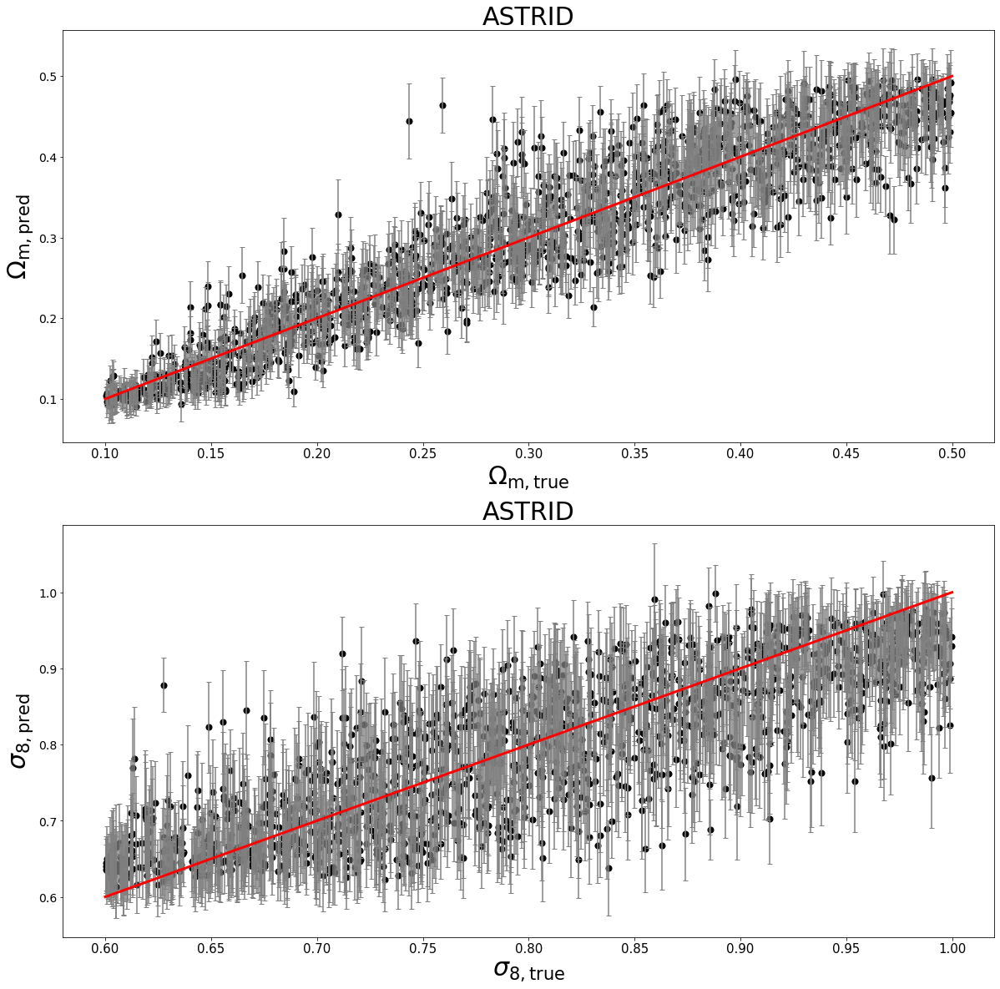

In [4]:
mist.make_plots() # Adam 1e-3 z_dim=1000

In [95]:
field = 'HI';
sim   = 'ASTRID' #['TNG', 'SIMBA']
norm = True
mono = False
fe=0.3;fd=0.6;z_dim=400;dr=0.1
average=False
fname = "ASTRID_{}_test".format(sim, field)
mist = MIST(sim=sim,field=field, normalization=norm, monopole=mono, average=average, data_type='wph',
            L=4, dn=0, projection=True)
mist.train(which_machine='vib',tol=1e-5,z_dim=z_dim,hidden1=fe, hidden2=fd,dr=dr,
           patience=50, gamma=1e-2, beta=1,epochs=3000,learning_rate=1e-3, fname=fname, save_plot=True
           , save_model=False)

epoch 0   | loss: 4.92879  | accuracy: 0.0121   | val_loss: 5.30915  | Om_m: 0.77984  | sig8: 0.19417 
epoch 1   | loss: 3.06379  | accuracy: 0.00773  | val_loss: 4.81931  | Om_m: 0.78056  | sig8: 0.17723 
epoch 2   | loss: 2.51254  | accuracy: 0.00672  | val_loss: 4.6231   | Om_m: 0.64004  | sig8: 0.17725 
epoch 3   | loss: 1.91378  | accuracy: 0.00559  | val_loss: 3.98518  | Om_m: 0.51463  | sig8: 0.17432 
epoch 4   | loss: 1.41313  | accuracy: 0.0049   | val_loss: 3.25944  | Om_m: 0.38693  | sig8: 0.14742 
epoch 5   | loss: 1.08955  | accuracy: 0.00448  | val_loss: 3.31778  | Om_m: 0.42787  | sig8: 0.14636 
epoch 6   | loss: 0.82577  | accuracy: 0.00419  | val_loss: 2.96518  | Om_m: 0.35013  | sig8: 0.14748 
epoch 7   | loss: 0.66703  | accuracy: 0.00399  | val_loss: 2.689    | Om_m: 0.33078  | sig8: 0.136   
epoch 8   | loss: 0.53468  | accuracy: 0.00388  | val_loss: 2.78078  | Om_m: 0.35481  | sig8: 0.14271 
epoch 9   | loss: 0.41368  | accuracy: 0.0037   | val_loss: 2.56013  | Om

KeyboardInterrupt: 

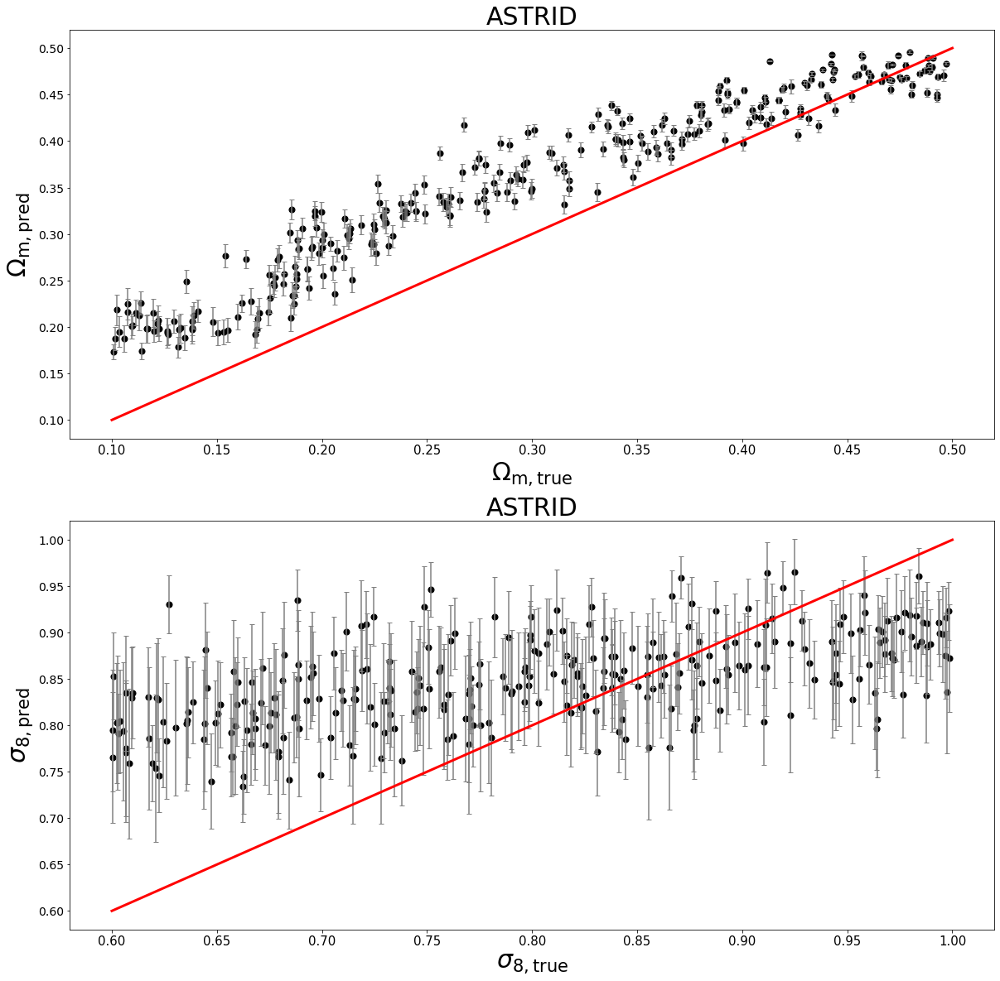

In [96]:
mist.make_plots() # Adam 1e-3 z_dim=1000

epoch 0   | loss: 3.82351  | accuracy: 0.00932  | val_loss: 6.5286   | Om_m: 0.59029  | sig8: 0.22945 
epoch 1   | loss: 2.55359  | accuracy: 0.00645  | val_loss: 5.90492  | Om_m: 0.5457   | sig8: 0.20148 
epoch 2   | loss: 2.01066  | accuracy: 0.00569  | val_loss: 5.32569  | Om_m: 0.45737  | sig8: 0.18093 
epoch 3   | loss: 1.60104  | accuracy: 0.00519  | val_loss: 4.9057   | Om_m: 0.42656  | sig8: 0.15907 
epoch 4   | loss: 1.23293  | accuracy: 0.00485  | val_loss: 4.69118  | Om_m: 0.40647  | sig8: 0.15607 
epoch 5   | loss: 1.01123  | accuracy: 0.00465  | val_loss: 4.50796  | Om_m: 0.39427  | sig8: 0.1372  
epoch 6   | loss: 0.89501  | accuracy: 0.00452  | val_loss: 4.40332  | Om_m: 0.40187  | sig8: 0.14029 
epoch 7   | loss: 0.73705  | accuracy: 0.00433  | val_loss: 4.21118  | Om_m: 0.38968  | sig8: 0.13498 
epoch 8   | loss: 0.64244  | accuracy: 0.00421  | val_loss: 4.18769  | Om_m: 0.3768   | sig8: 0.1304  
epoch 9   | loss: 0.60591  | accuracy: 0.00409  | val_loss: 4.1613   | Om

KeyboardInterrupt: 

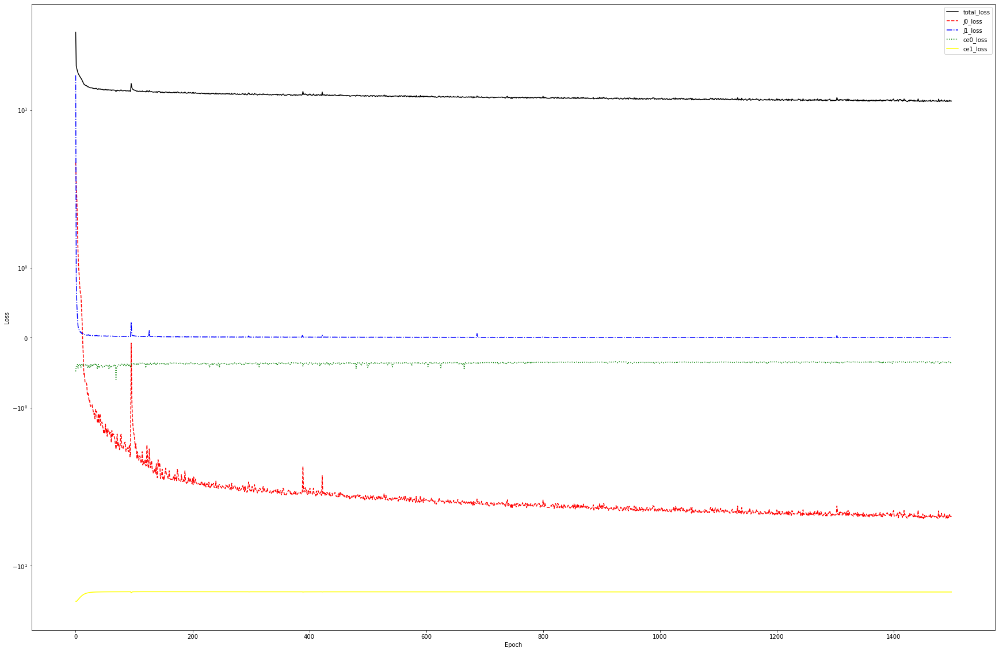

In [33]:
field = 'HI';
sim   = ['TNG', 'SIMBA']
norm = True
mono = False
fe=0.3;fd=0.6;z_dim=400;dr=0.1
average=False
fname = "TNG_SIMBA_{}_test".format(sim, field)
mist = MIST(sim=sim,field=field, normalization=norm, monopole=mono, average=average, data_type='wph',
            L=4, dn=0, projection=True)
mist.train(which_machine='vib+cls', tol=1e-5,z_dim=z_dim,hidden1=fe, hidden2=fd,dr=dr,
           patience=50, gamma=1e-2, beta=1,epochs=3000,learning_rate=1e-3)
#mist.retrain(tol=1e-7,patience=50,epochs=3000,learning_rate=1e-5)

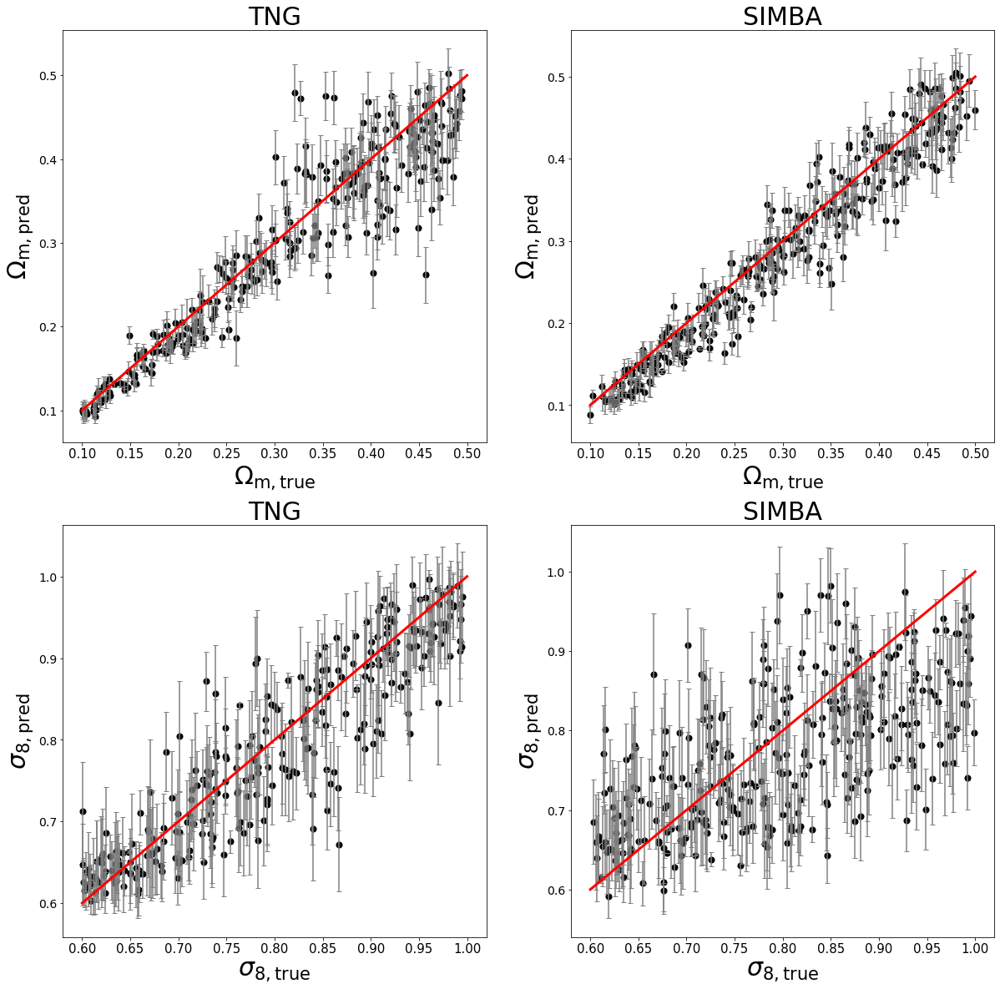

In [34]:
mist.make_plots()

In [45]:
a[1][1].shape

(3000, 2)

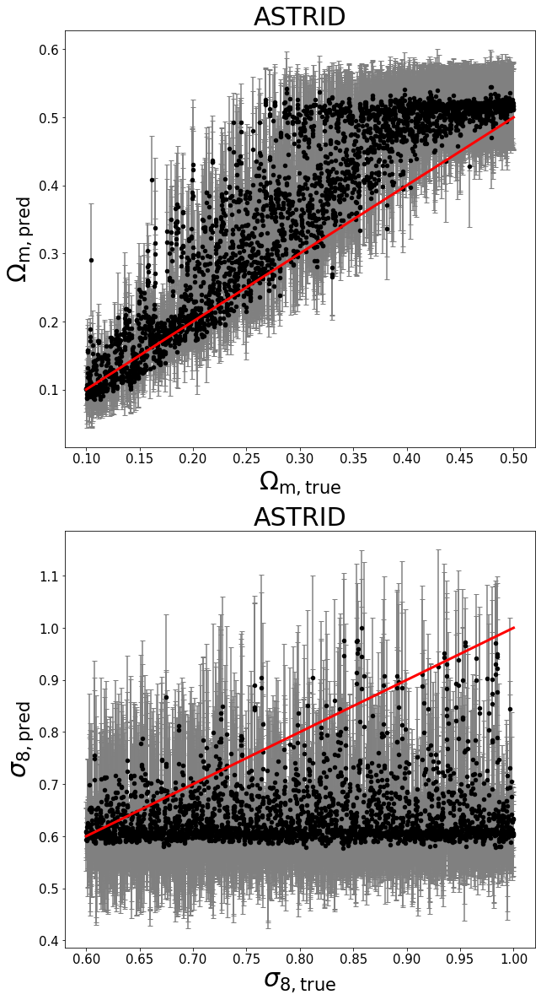

In [36]:
a = mist.test_on(sims="ASTRID", fname="0.01", data_return=True,show_plot=True, show_score=False, save_plot=False)

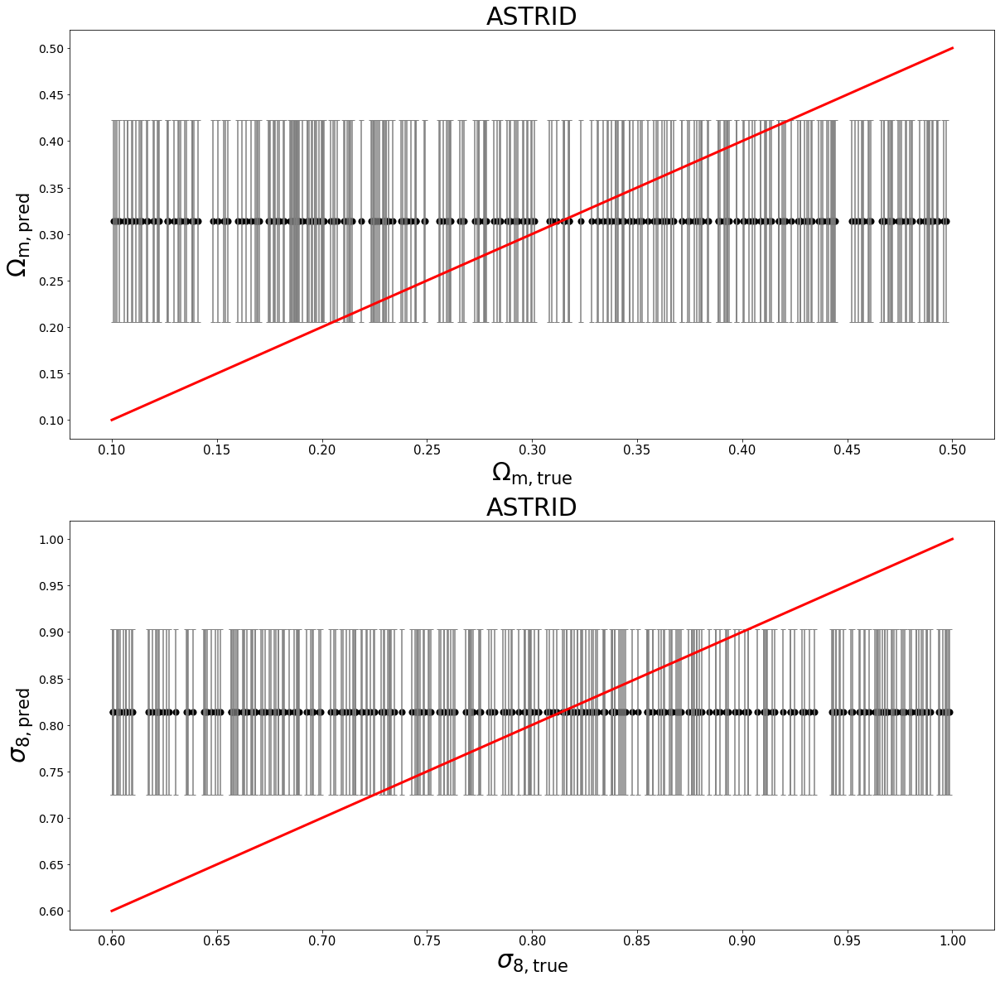

In [52]:
mist.make_plots() # Adam 1e-3 z_dim=1000

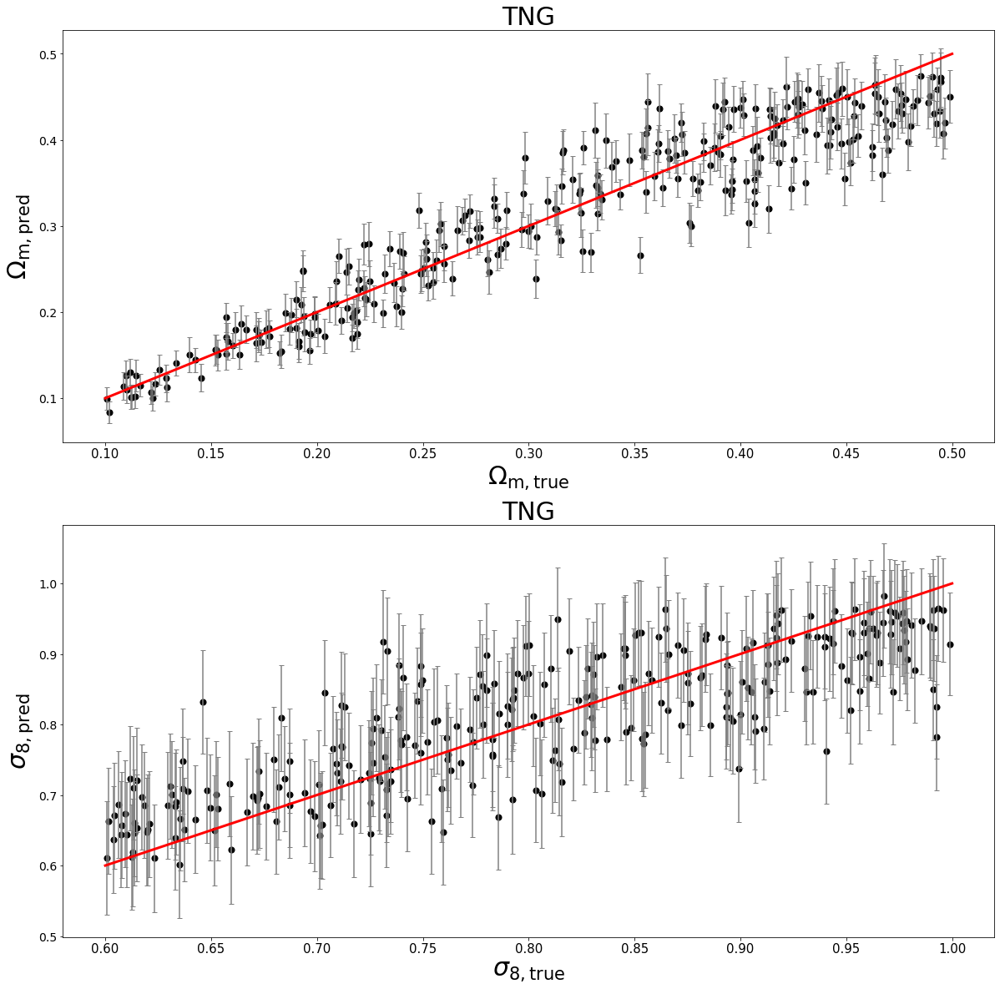

In [264]:
mist.make_plots() # Adam 1e-3 l = 10 dn=4

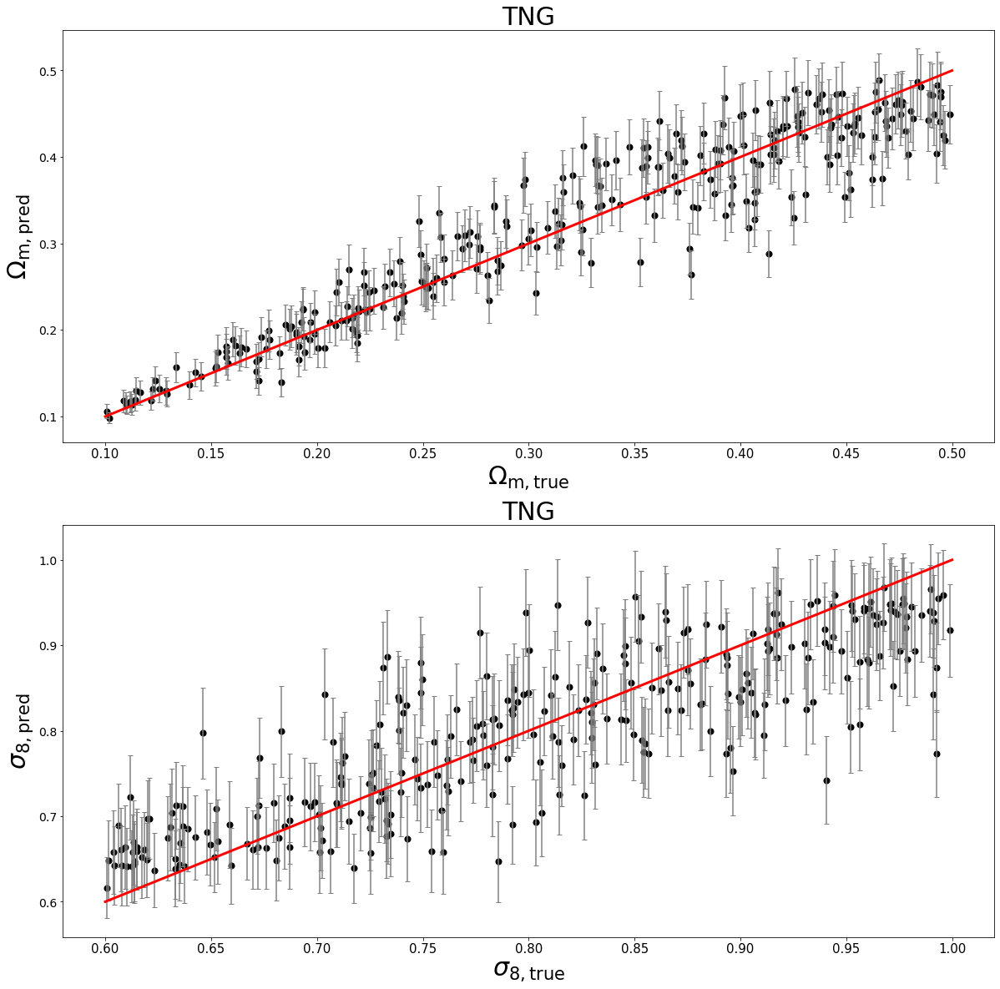

In [254]:
mist.make_plots() # Adam 1e-3 val_loss j1 modif gamma 1e-3

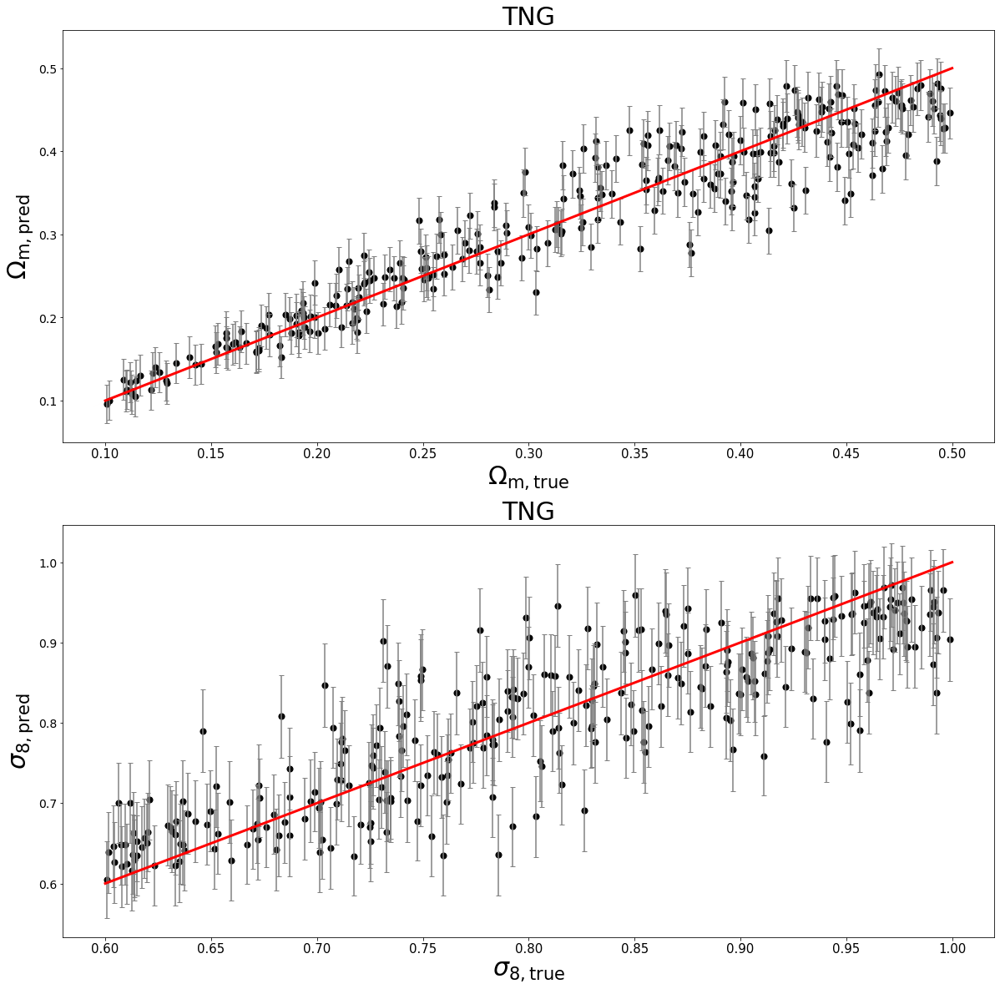

In [251]:
mist.make_plots() # Adam 1e-5 val_loss j1 modif

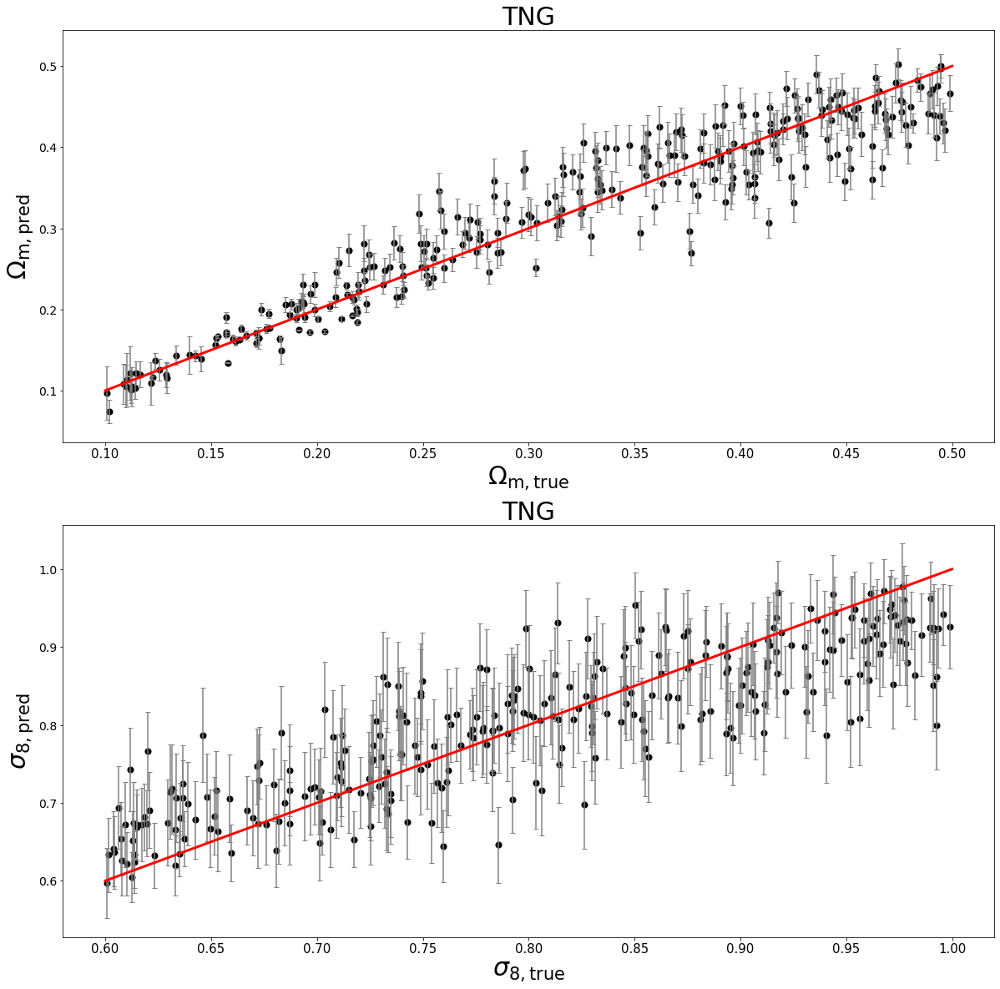

In [240]:
mist.make_plots() # Adam 1e-4 val_loss

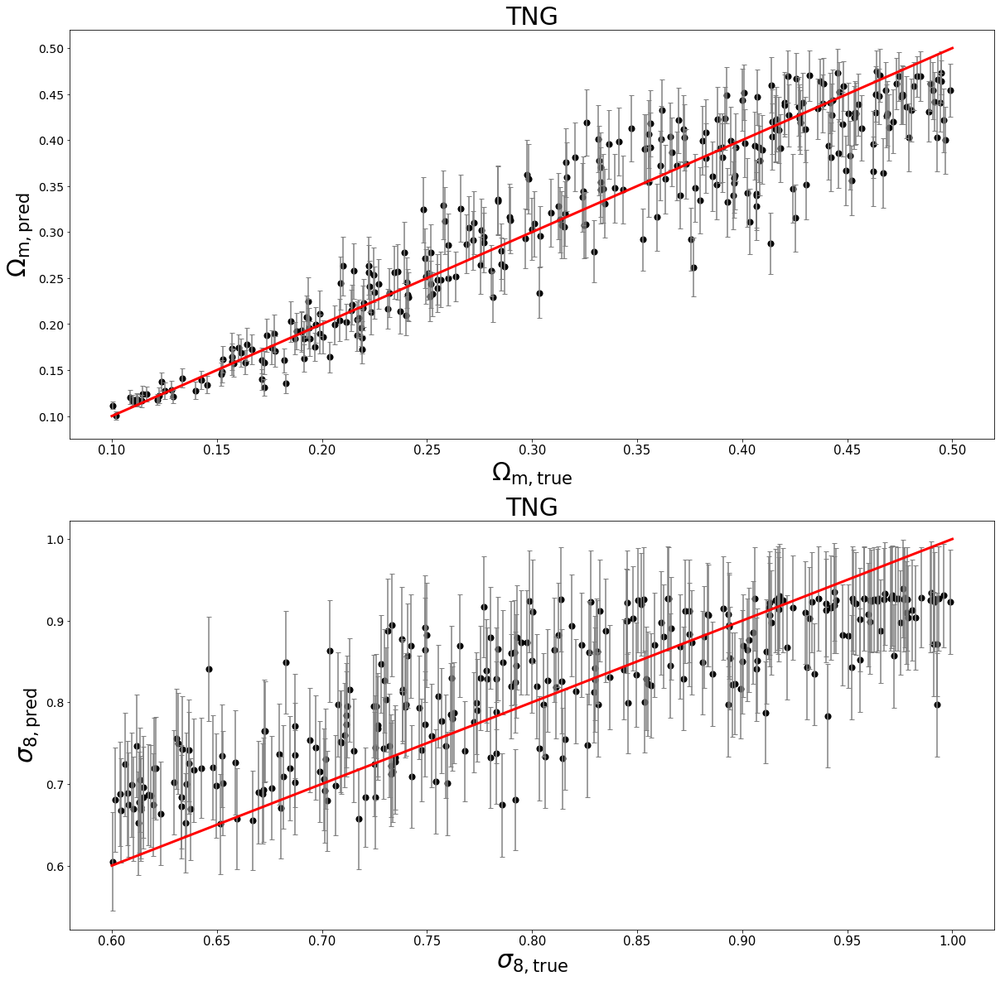

In [238]:
mist.make_plots() # Adam 1e-3 val_loss

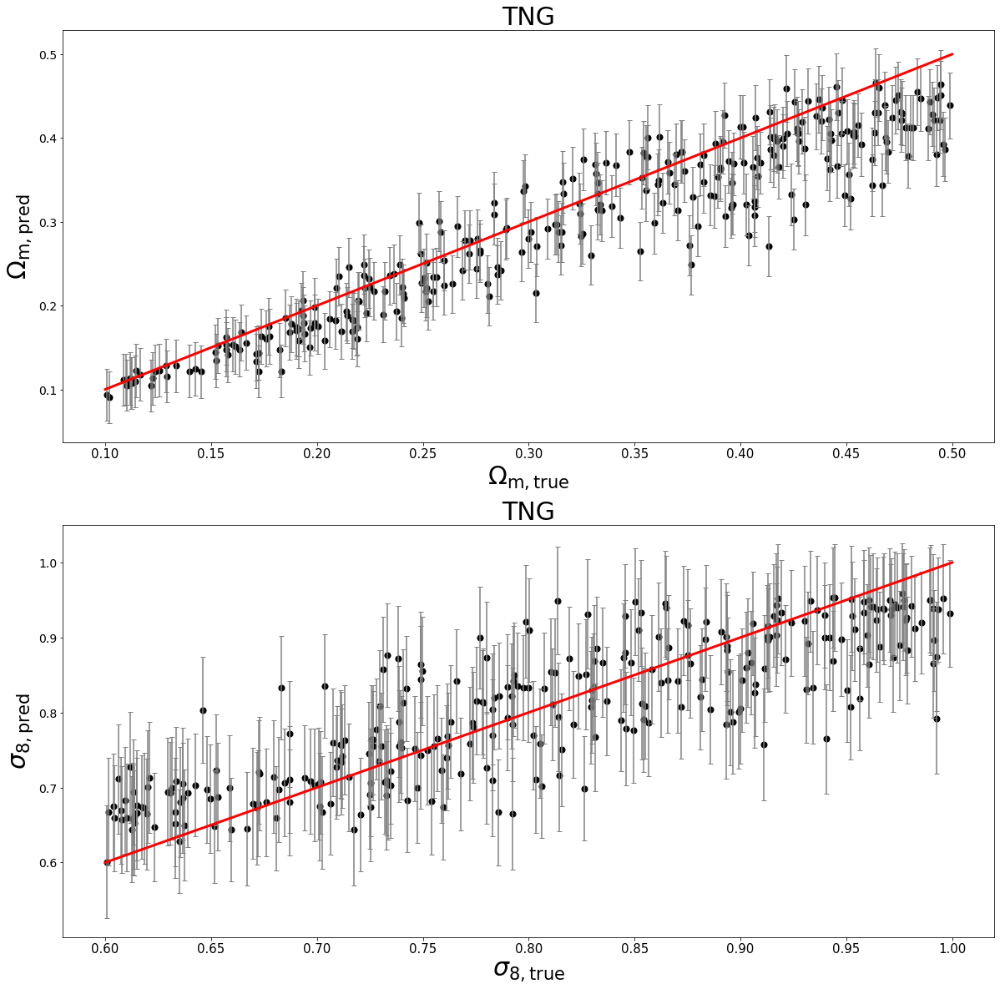

In [228]:
mist.make_plots() # Adam 1e-3

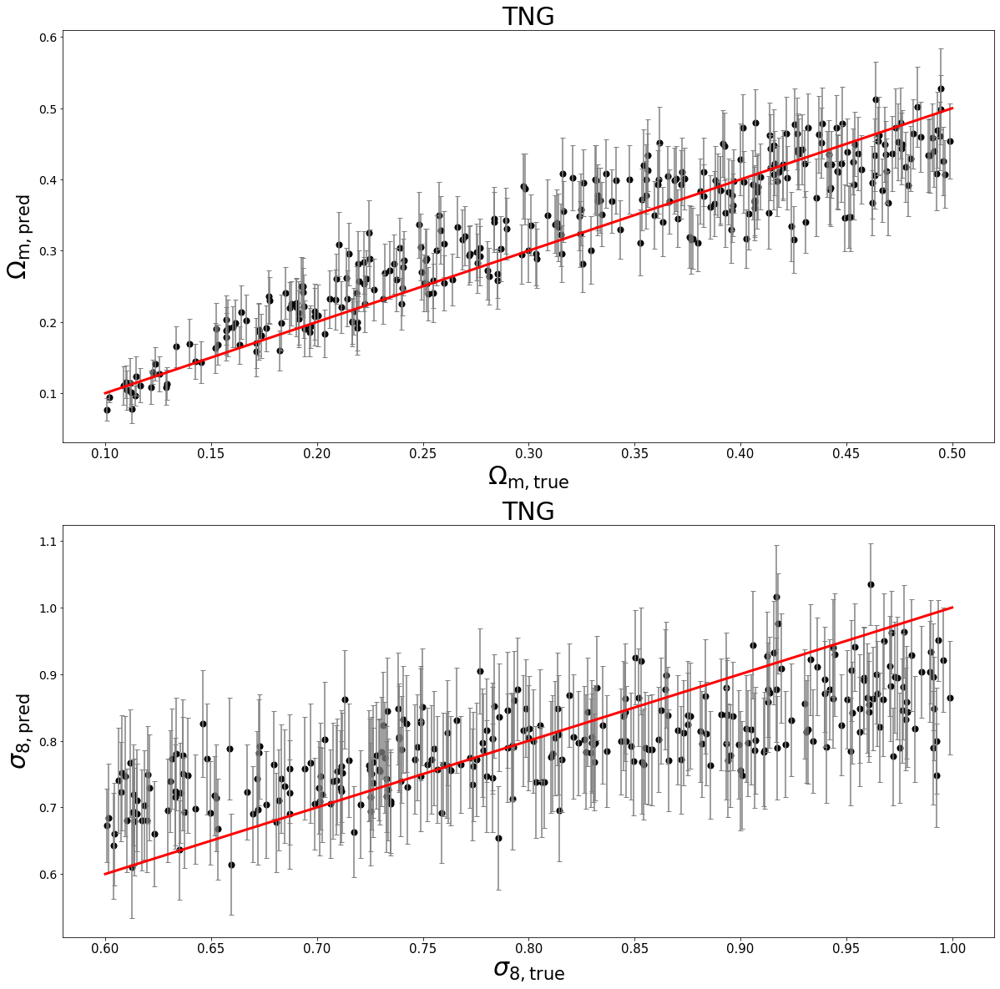

In [220]:
mist.make_plots()

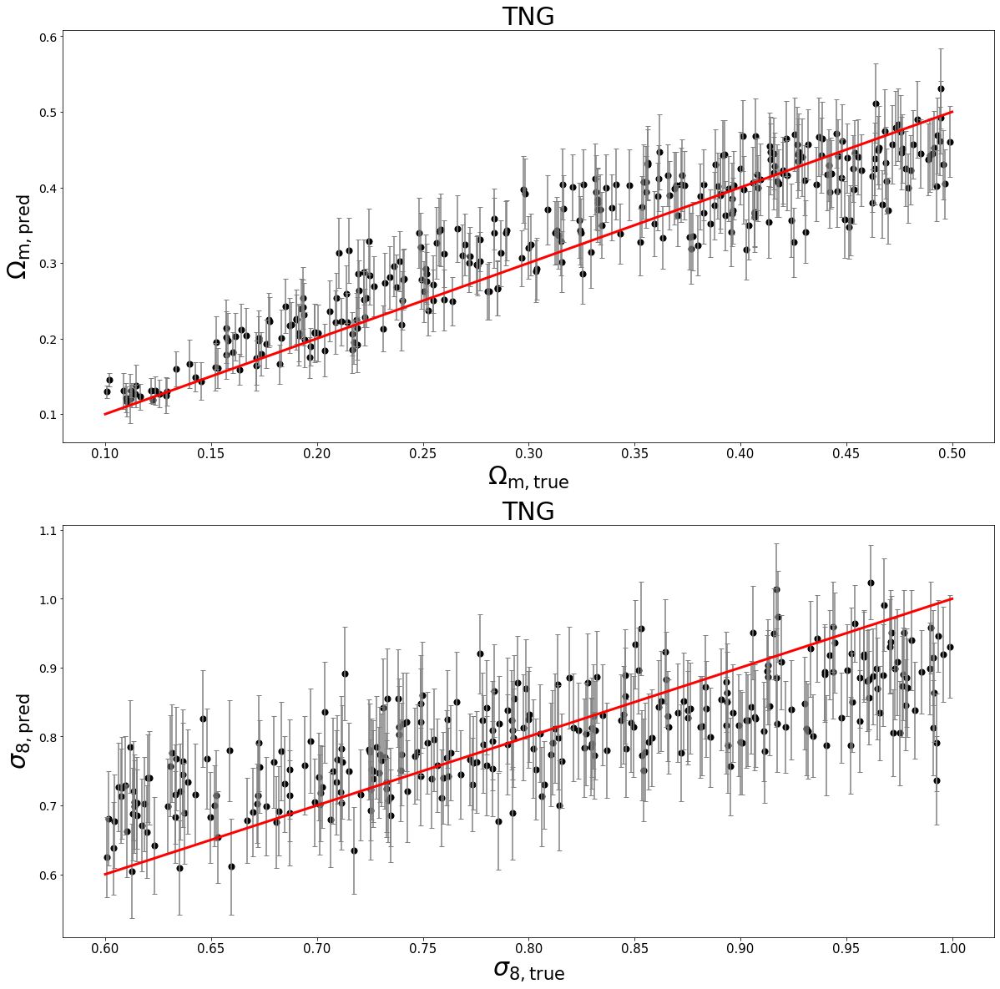

In [218]:
mist.make_plots()  # SGD

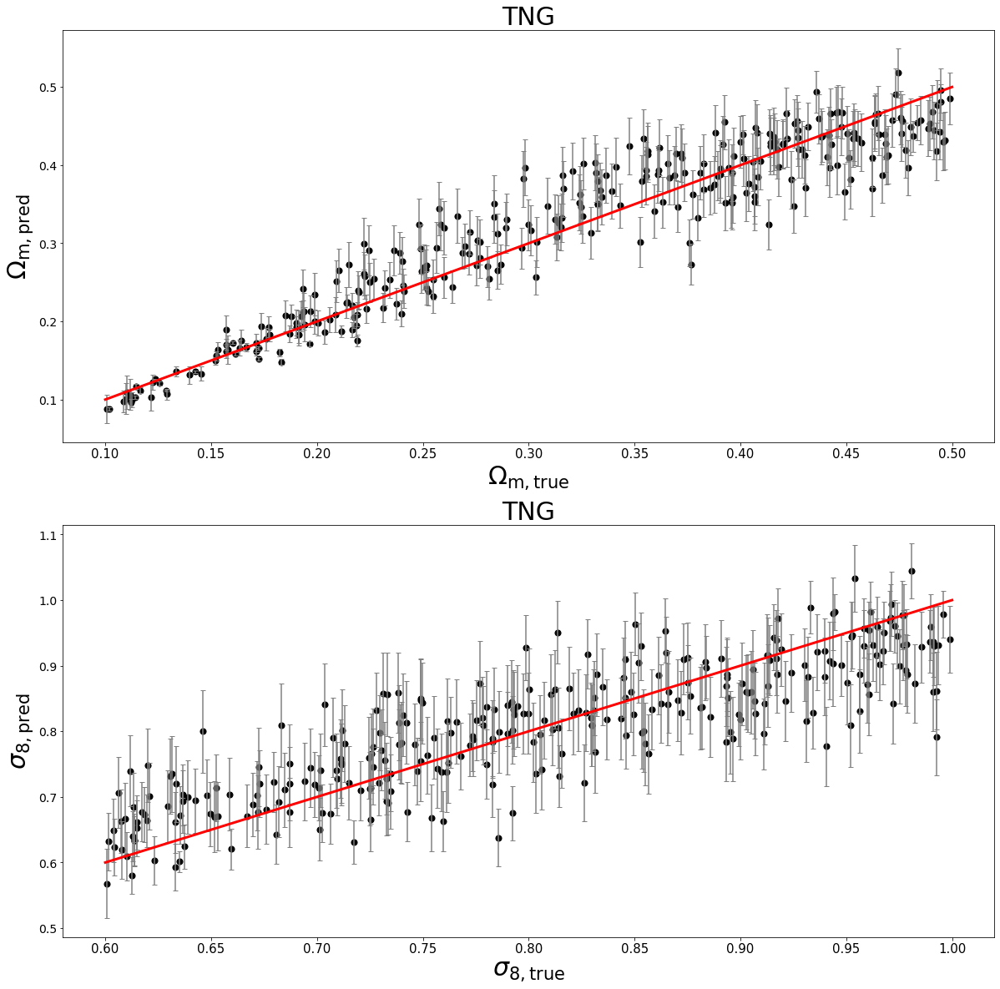

In [215]:
mist.make_plots() # ADAM 1e-4

In [128]:
import sys,os 
import matplotlib.pyplot as plt
import numpy as np
sys.path.append(os.path.abspath("/mnt/home/yjo10/ceph/myutils/"))
from plt_utils import generateAxesForMultiplePlots, remove_inner_axes
from scipy.stats import pearsonr
from sklearn.metrics import mean_squared_error, r2_score
from scipy.stats import chi2_contingency

In [29]:
def metric(arr):
    return arr[2]+arr[3]

In [64]:
field = 'Mtot';
sim   = 'TNG' #['TNG', 'SIMBA']
norm = True
mono = True
h    = 1
average=True
fname = "search/{}_{}_mono_{}_norm_{}_h_{}_img".format(sim, field, int(mono),int(norm),h)
mist = MIST(sim=sim,field=field, normalization=norm, monopole=mono, average=average, data_type='wph', projection=False)
mist.train(which_machine='vib', beta=0)

TypeError: unsupported operand type(s) for +: 'float' and 'tuple'

In [47]:
?mist.train

Signature:
mist.train(
    which_machine='vib+cls',
    fname='test',
    beta=1,
    gamma=0.01,
    learning_rate=0.001,
    decay_rate=0.97,
    z_dim=200,
    epochs=3000,
    hidden=1,
    dr=0.5,
    channels=1,
    verbose=True,
    save_plot=True,
    save_model=True,
    n_estimators=10,
    max_depth=4,
    loss_fn=None,
)
Docstring: <no docstring>
File:      ~/ceph/CAMELS/MIEST/utils/mist_utils.py
Type:      method


In [38]:
mist.input.shape

(1000, 6210)

## batch run for making plots should be implemented

In [31]:
field = 'T';
sim   = 'TNG'
norm = True
mono = True
h    = 1
average=False
fname = "search/{}_{}_mono_{}_norm_{}_h_{}_img".format(sim, field, int(mono),int(norm),h)
mist = MIST(sim=sim,field=field, extended_L=False, normalization=norm, monopole=mono, average=average, data_type='image')
mist.load_models(fname=fname, which_machine='vib_cnn',z_dim=200, hidden=h, dr=0.5)
mist.make_plots(show_plot=True, data_return=False)
#mist.test_on(sims="ASTRID", fname="0.01", data_return=False,show_plot=True, show_score=False, save_plot=False)a

TypeError: __init__() got an unexpected keyword argument 'extended_L'

In [15]:
mist.input.shape

(1000, 3105)

In [44]:
field = 'Mtot';
sim   = 'TNG'
norm = True
mono = True
h    = 2
average=True
z_dim = 1000
fname = "search/{}_{}_mono_{}_norm_{}_h_{}_new".format(sim, field, int(mono),int(norm),h)
mist = MIST(sim=sim,field=field, normalization=norm, monopole=mono, average=average, projection=True, L=4, dn=0)
mist.load_models(fname=fname, which_machine='vib',z_dim=z_dim, hidden=h, dr=0.5)
mist.make_plots(show_plot=True, data_return=False)
#mist.test_on(sims="ASTRID", fname="0.01", data_return=False,show_plot=True, show_score=False, save_plot=False)

You can't use monopole with projection!
Turning off monopole...
You can't use average with projection!
Turning off average...


FileNotFoundError: [Errno 2] No such file or directory: '/mnt/home/yjo10/ceph/CAMELS/MIEST/data/wph_pIllustrisTNG_Mtot_for_vib_total_l_4_dn_0.npy'

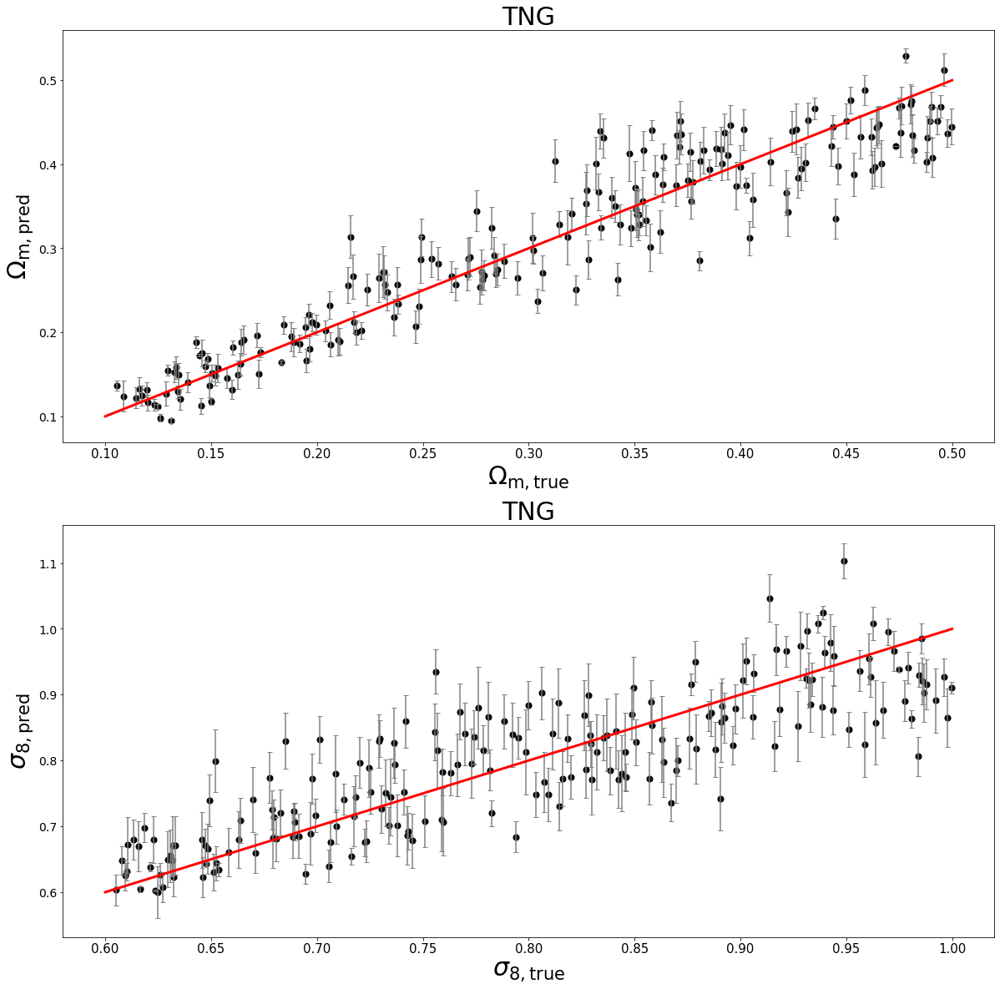

In [21]:
field = 'T';
sim   = 'TNG'
norm = True
mono = True
h    = 1
average=True
fname = "search/{}_{}_mono_{}_norm_{}_h_{}".format(sim, field, int(mono),int(norm),h)
mist = MIST(sim=sim,field=field, normalization=norm, monopole=mono, average=average, projection=False)
mist.load_models(fname=fname, which_machine='vib',z_dim=200, hidden=h, dr=0.5)
mist.make_plots(show_plot=True, data_return=False)
#mist.test_on(sims="ASTRID", fname="0.01", data_return=False,show_plot=True, show_score=False, save_plot=False)

In [13]:
field = 'T';
sim   = 'TNG'
norm = True
mono = True
h    = 1
average=False
fname = "search/{}_{}_mono_{}_norm_{}_h_{}_nav".format(sim, field, int(mono),int(norm),h)
mist = MIST(sim=sim,field=field, extended_L=False, normalization=norm, monopole=mono, average=False)
mist.load_models(fname=fname, which_machine='vib',z_dim=200, hidden=h, dr=0.5)
mist.make_plots(show_plot=True, data_return=False)
#mist.test_on(sims="ASTRID", fname="0.01", data_return=False,show_plot=True, show_score=False, save_plot=False)

RuntimeError: PytorchStreamReader failed reading zip archive: failed finding central directory

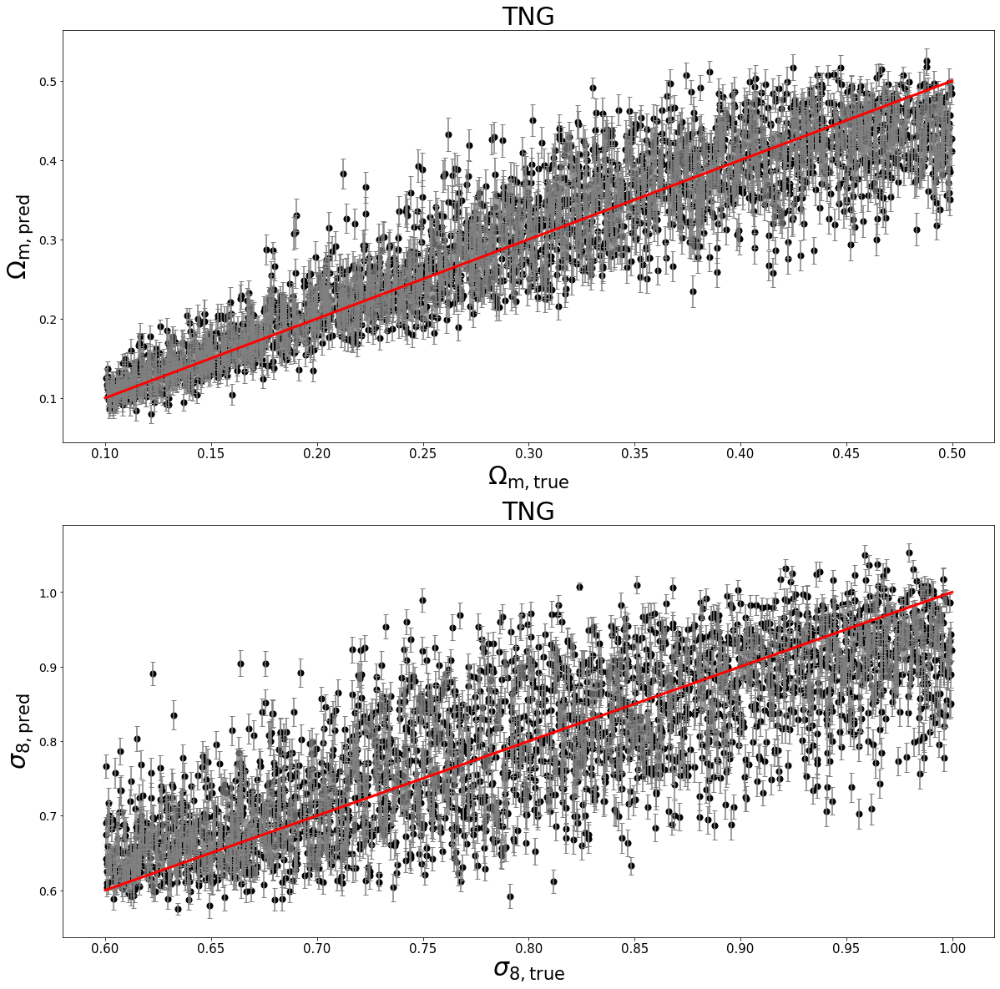

In [7]:
field = 'HI';
sim   = 'TNG'
norm = True
mono = True
h    = 1
average=False
fname = "search/{}_{}_mono_{}_norm_{}_h_{}_no_avg".format(sim, field, int(mono),int(norm),h)
mist = MIST(sim=sim,field=field, extended_L=False, normalization=norm, monopole=mono, average=False)
mist.load_models(fname=fname, which_machine='vib',z_dim=200, hidden=h, dr=0.5)
mist.make_plots(show_plot=True, data_return=False)
#mist.test_on(sims="ASTRID", fname="0.01", data_return=False,show_plot=True, show_score=False, save_plot=False)

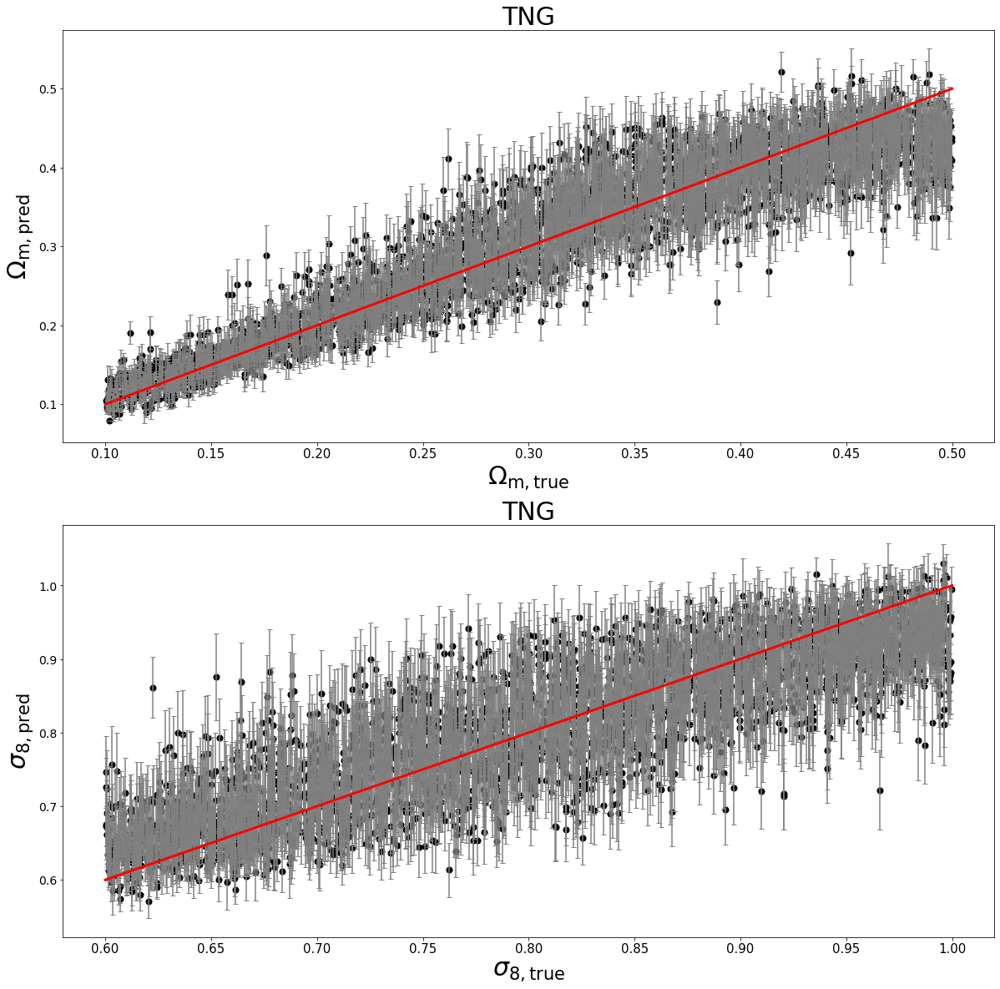

In [22]:
field = 'HI';
sim   = 'TNG'
norm = False
mono = False
h    = 1
average=False
fname = "search/{}_{}_mono_{}_norm_{}_h_{}_no_avg".format(sim, field, int(mono),int(norm),h)
mist = MIST(sim=sim,field=field, extended_L=False, normalization=norm, monopole=mono, average=average)
mist.load_models(fname=fname, which_machine='vib',z_dim=200, hidden=h, dr=0.5)
mist.make_plots(show_plot=True, data_return=False)
#mist.test_on(sims="ASTRID", fname="0.01", data_return=False,show_plot=True, show_score=False, save_plot=False)

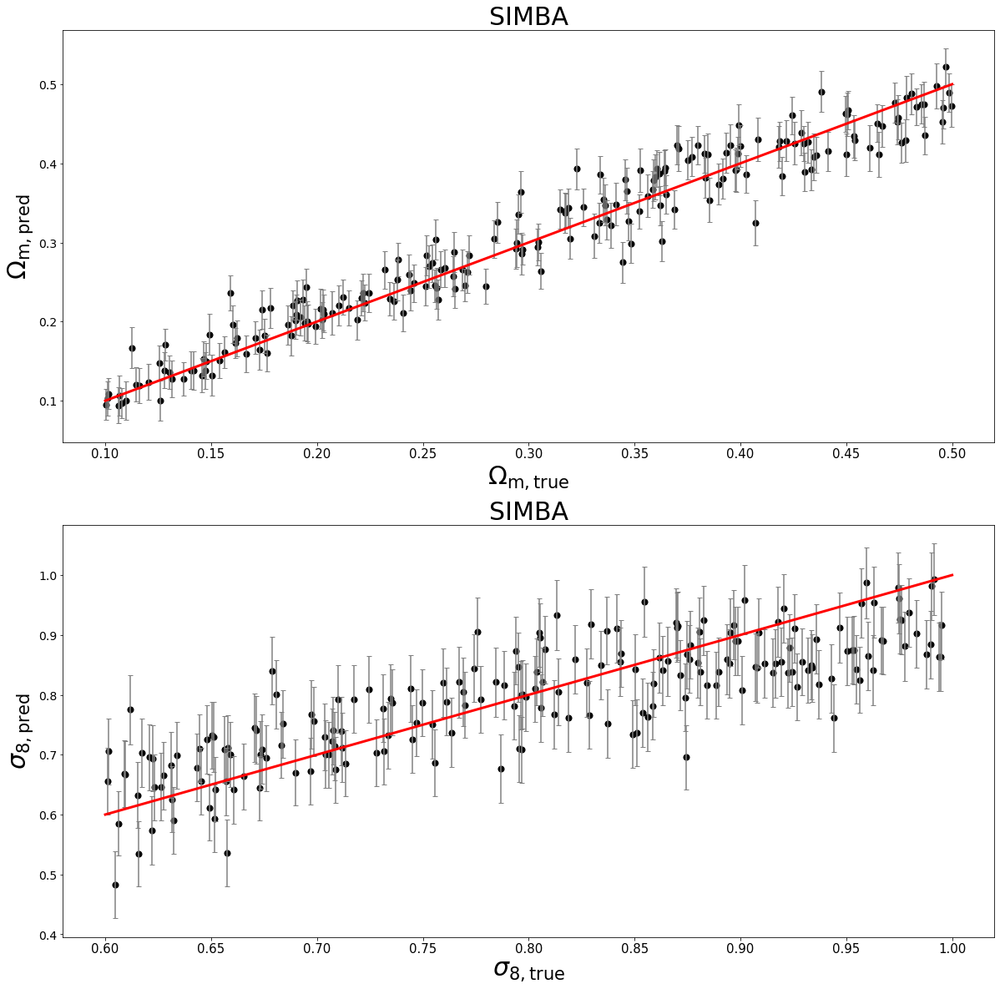

In [20]:
field = 'HI';
sim   = 'SIMBA'
norm = True
mono = False
h    = 1
average=True
fname = "search/{}_{}_mono_{}_norm_{}_h_{}".format(sim, field, int(mono),int(norm),h)
mist = MIST(sim=sim,field=field, extended_L=False, normalization=norm, monopole=mono, average=average)
mist.load_models(fname=fname, which_machine='vib',z_dim=200, hidden=h, dr=0.5)
mist.make_plots(show_plot=True, data_return=False)
#mist.test_on(sims="ASTRID", fname="0.01", data_return=False,show_plot=True, show_score=False, save_plot=False)

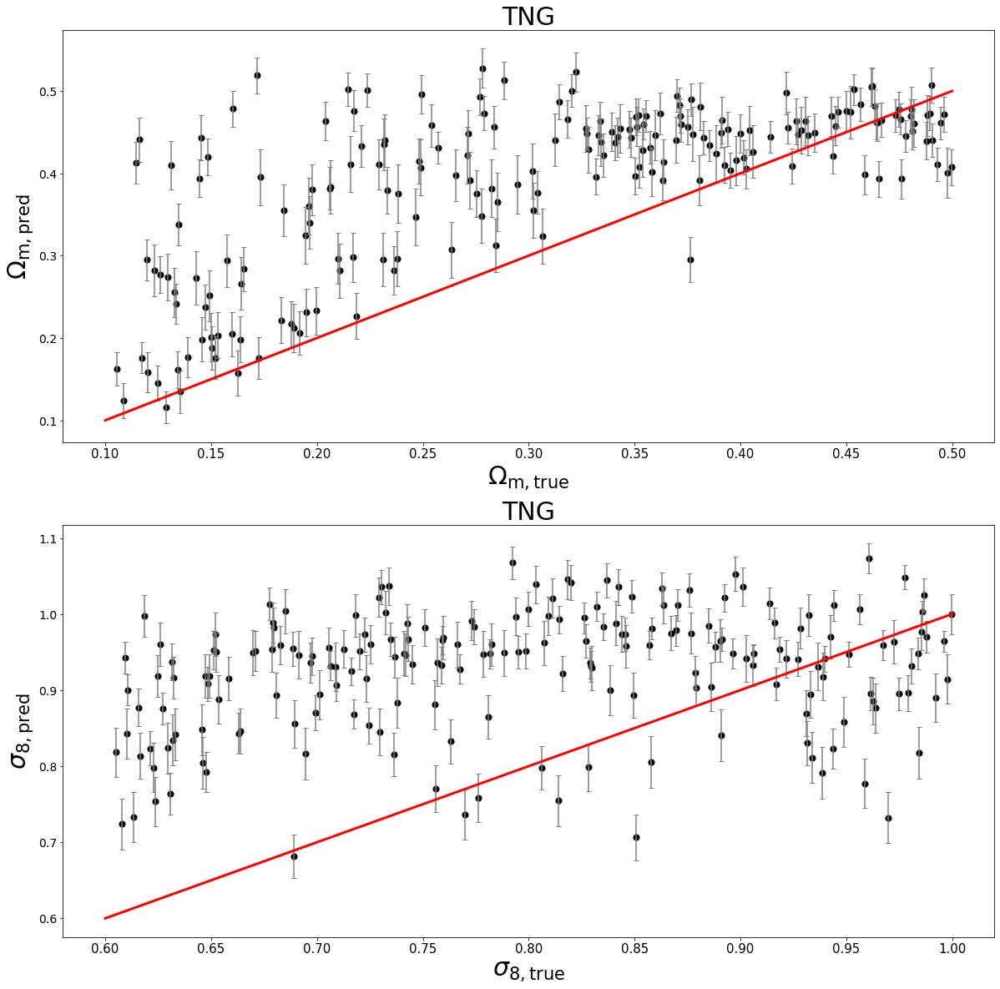

In [17]:
field = 'T';
sim   = 'TNG'
norm = True
mono = False
h    = 1
average=True
fname = "search/{}_{}_mono_{}_norm_{}_h_{}_no_avg".format(sim, field, int(mono),int(norm),h)
mist = MIST(sim=sim,field=field, extended_L=False, normalization=norm, monopole=mono, average=average)
mist.load_models(fname=fname, which_machine='vib',z_dim=200, hidden=h, dr=0.5)
mist.make_plots(show_plot=True, data_return=False)
#mist.test_on(sims="ASTRID", fname="0.01", data_return=False,show_plot=True, show_score=False, save_plot=False)

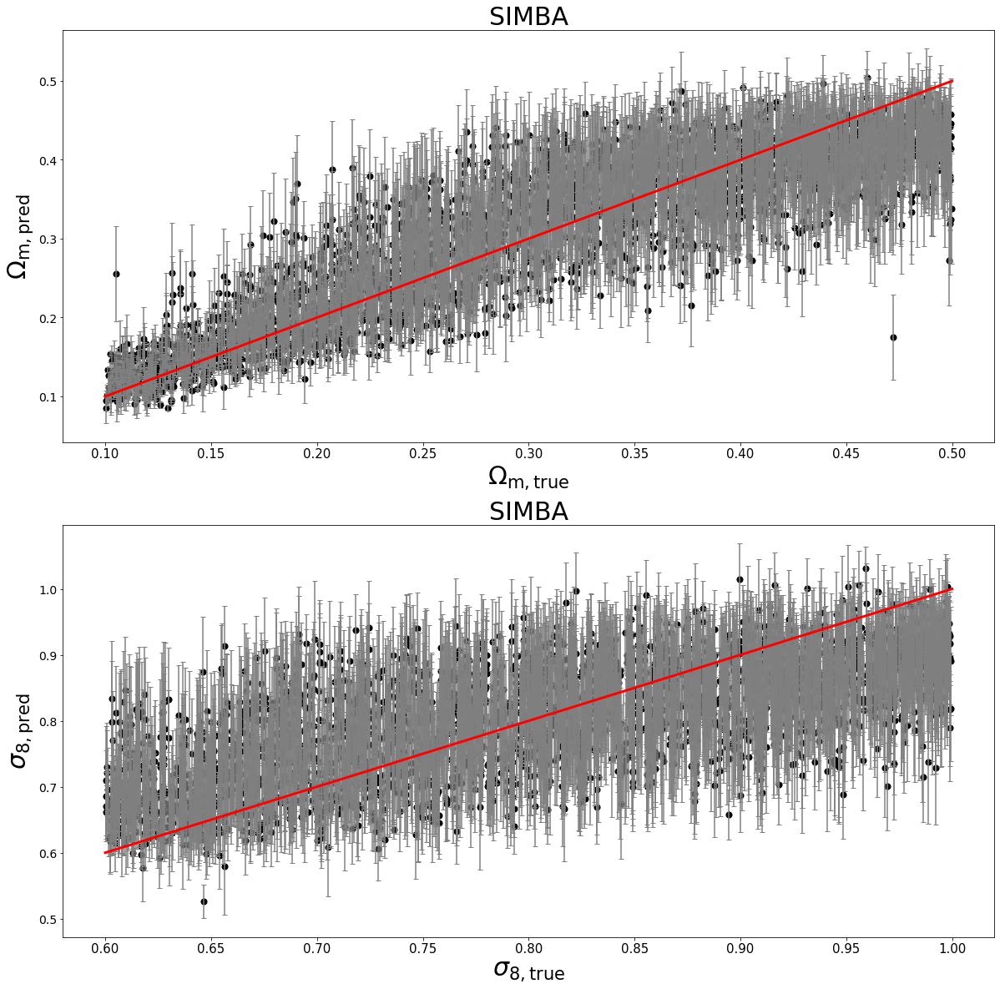

In [13]:
field = 'T';
sim   = 'SIMBA'
norm = False
mono = True
h    = 1
average=False
fname = "search/{}_{}_mono_{}_norm_{}_h_{}_no_avg".format(sim, field, int(mono),int(norm),h)
mist = MIST(sim=sim,field=field, extended_L=False, normalization=norm, monopole=mono, average=average)
mist.load_models(fname=fname, which_machine='vib',z_dim=200, hidden=h, dr=0.5)
mist.make_plots(show_plot=True, data_return=False)
#mist.test_on(sims="ASTRID", fname="0.01", data_return=False,show_plot=True, show_score=False, save_plot=False)

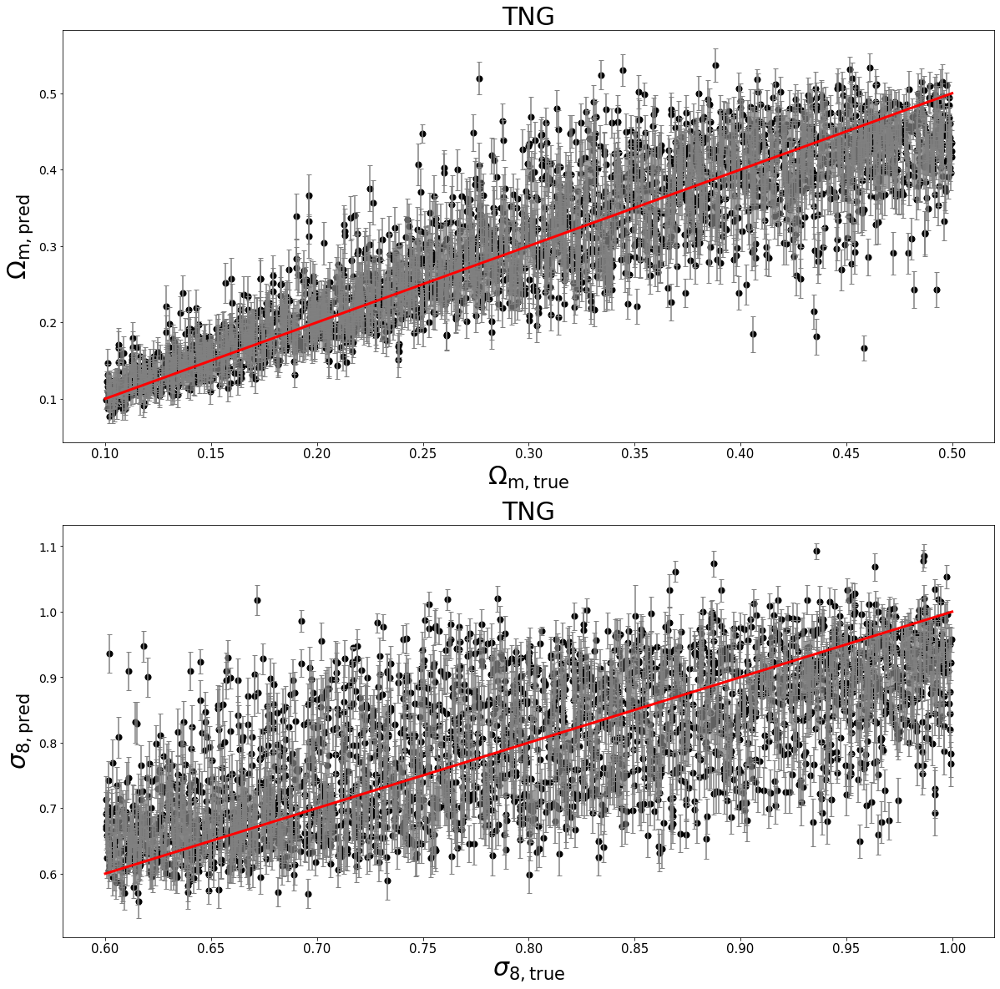

In [10]:
field = 'T';
sim   = 'TNG'
norm = True
mono = True
h    = 1
average=False
fname = "search/{}_{}_mono_{}_norm_{}_h_{}_no_avg".format(sim, field, int(mono),int(norm),h)
mist = MIST(sim=sim,field=field, extended_L=False, normalization=norm, monopole=mono, average=False)
mist.load_models(fname=fname, which_machine='vib',z_dim=200, hidden=h, dr=0.5)
mist.make_plots(show_plot=True, data_return=False)
#mist.test_on(sims="ASTRID", fname="0.01", data_return=False,show_plot=True, show_score=False, save_plot=False)

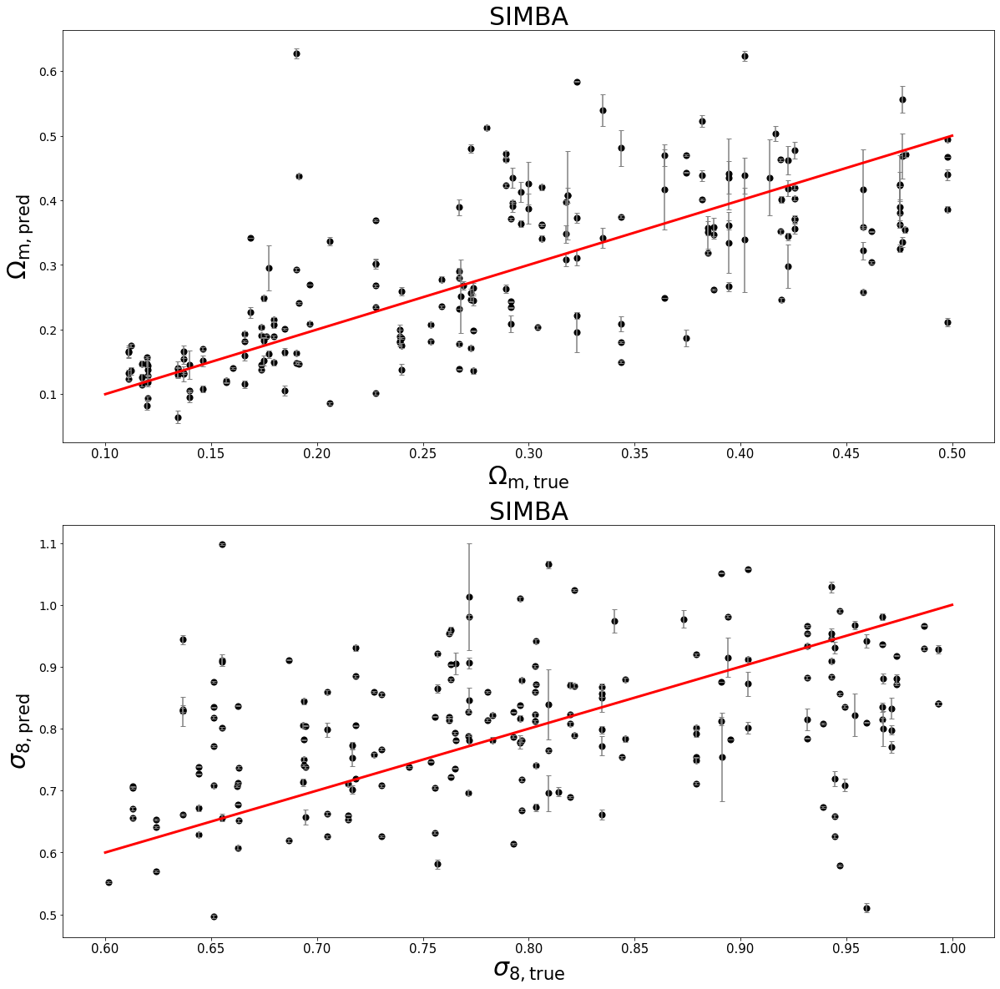

In [10]:
field = 'T';
sim   = 'SIMBA'
norm = True
mono = True
h    = 1
average=False
fname = "search/{}_{}_mono_{}_norm_{}_h_{}_no_avg".format(sim, field, int(mono),int(norm),h)
mist = MIST(sim=sim,field=field, extended_L=False, normalization=norm, monopole=mono, average=False)
mist.load_models(fname=fname, which_machine='vib',z_dim=200, hidden=h, dr=0.5)
mist.make_plots(show_plot=True, data_return=False)
#mist.test_on(sims="ASTRID", fname="0.01", data_return=False,show_plot=True, show_score=False, save_plot=False)

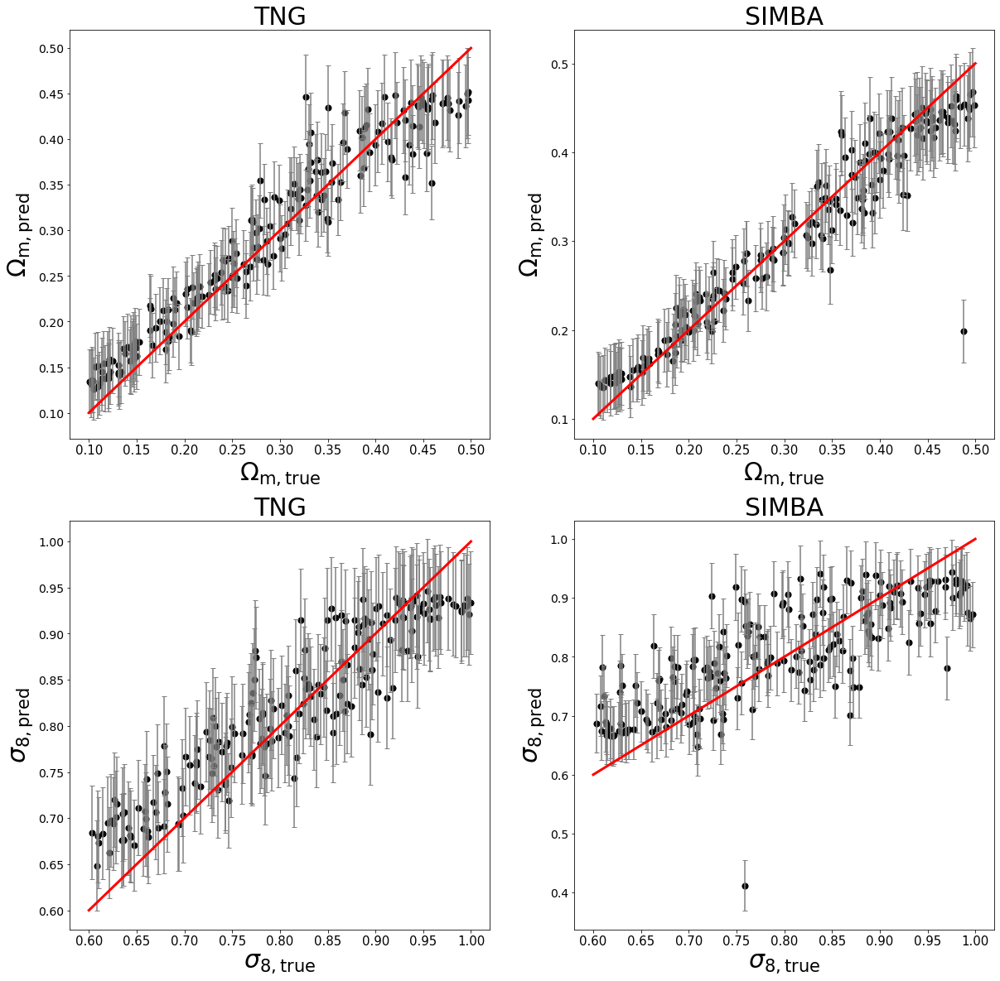

In [25]:
field = 'HI';
norm = True
mono = True
h    = 0.5
fname = "search/TNG+SIMBA_T_mono_{}_norm_{}_h_{}".format(int(mono),int(norm),h)
mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=False, normalization=norm, monopole=mono)
mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
mist.make_plots(show_plot=True, data_return=False)
#mist.test_on(sims="ASTRID", fname="0.01", data_return=False,show_plot=True, show_score=False, save_plot=False)

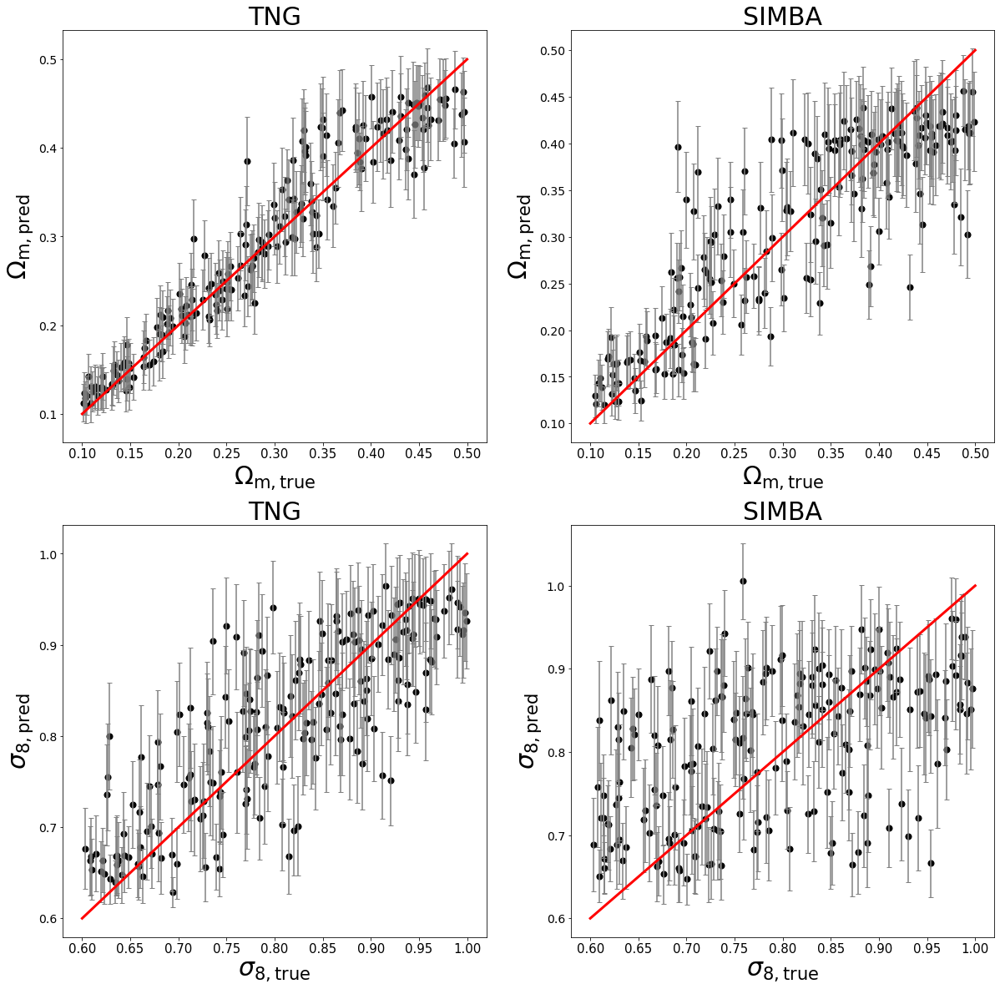

In [21]:
field = 'T';
norm = True
mono = True
h    = 1
fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}_L_10_dn_2_z_1000_j1".format(field,int(mono),int(norm),h)
mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=10, extended_dn=False, normalization=norm, monopole=mono)
mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=1000, hidden=h, dr=0.5)
mist.make_plots(show_plot=True, data_return=False)
#mist.test_on(sims="ASTRID", fname="0.01", data_return=False,show_plot=True, show_score=False, save_plot=False)

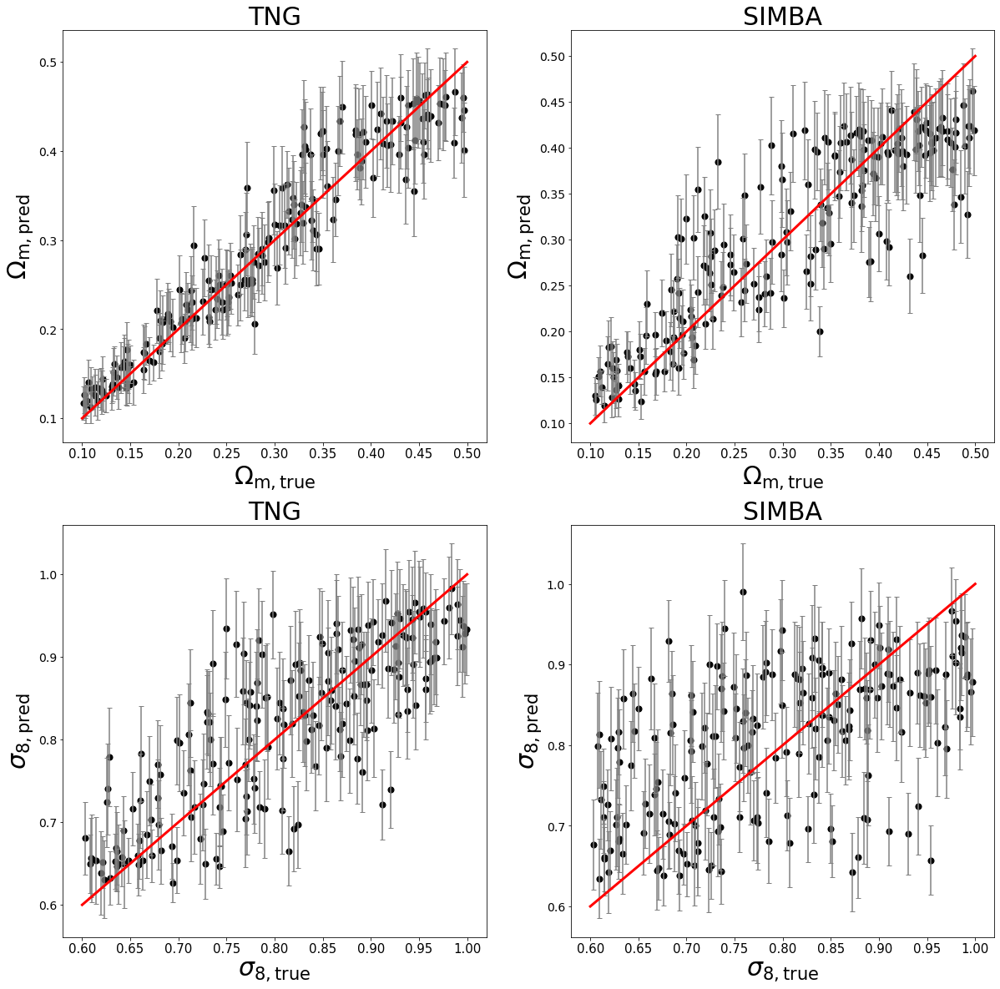

In [20]:
field = 'T';
norm = True
mono = True
h    = 1
fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}_L_10_dn_2_z_1000".format(field,int(mono),int(norm),h)
mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=10, extended_dn=False, normalization=norm, monopole=mono)
mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=1000, hidden=h, dr=0.5)
mist.make_plots(show_plot=True, data_return=False)
#mist.test_on(sims="ASTRID", fname="0.01", data_return=False,show_plot=True, show_score=False, save_plot=False)

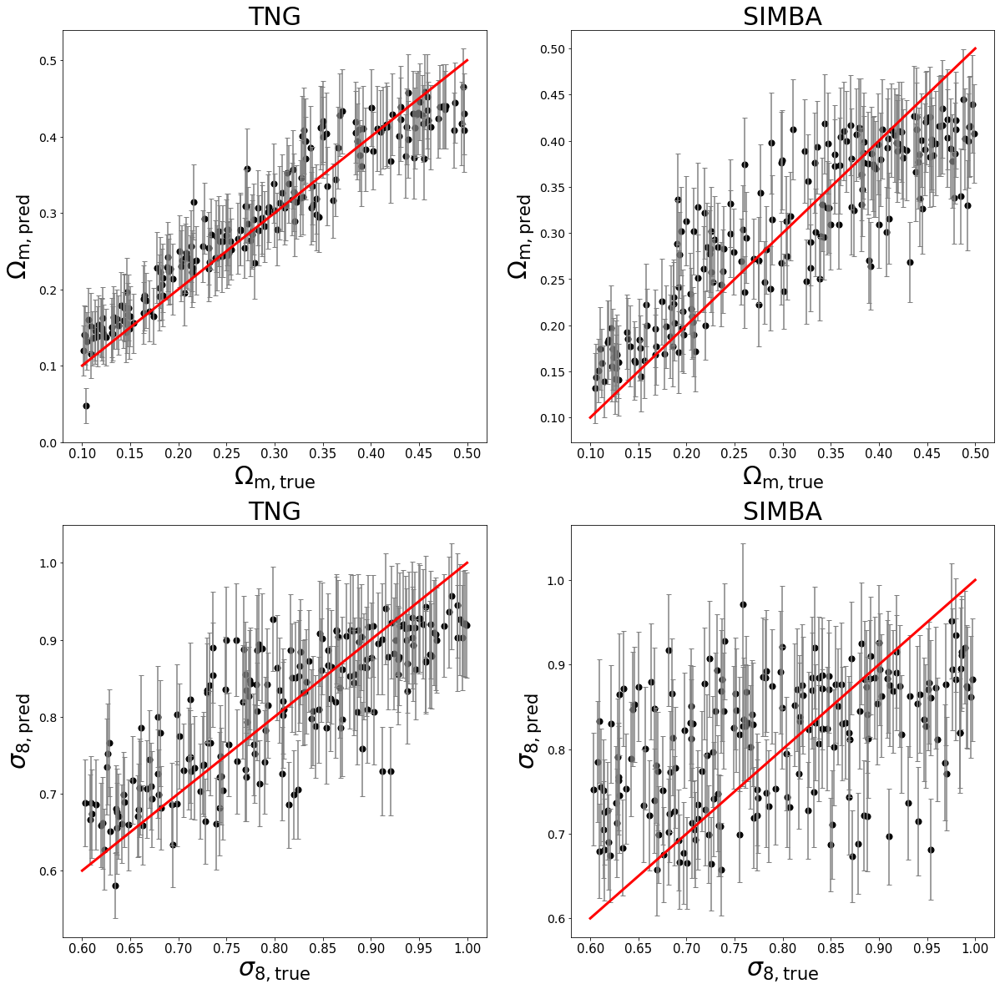

In [8]:
field = 'T';
norm = True
mono = True
h    = 1
fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}_L_10".format(field,int(mono),int(norm),h)
mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=10, extended_dn=False, normalization=norm, monopole=mono)
mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
mist.make_plots(show_plot=True, data_return=False)
#mist.test_on(sims="ASTRID", fname="0.01", data_return=False,show_plot=True, show_score=False, save_plot=False)

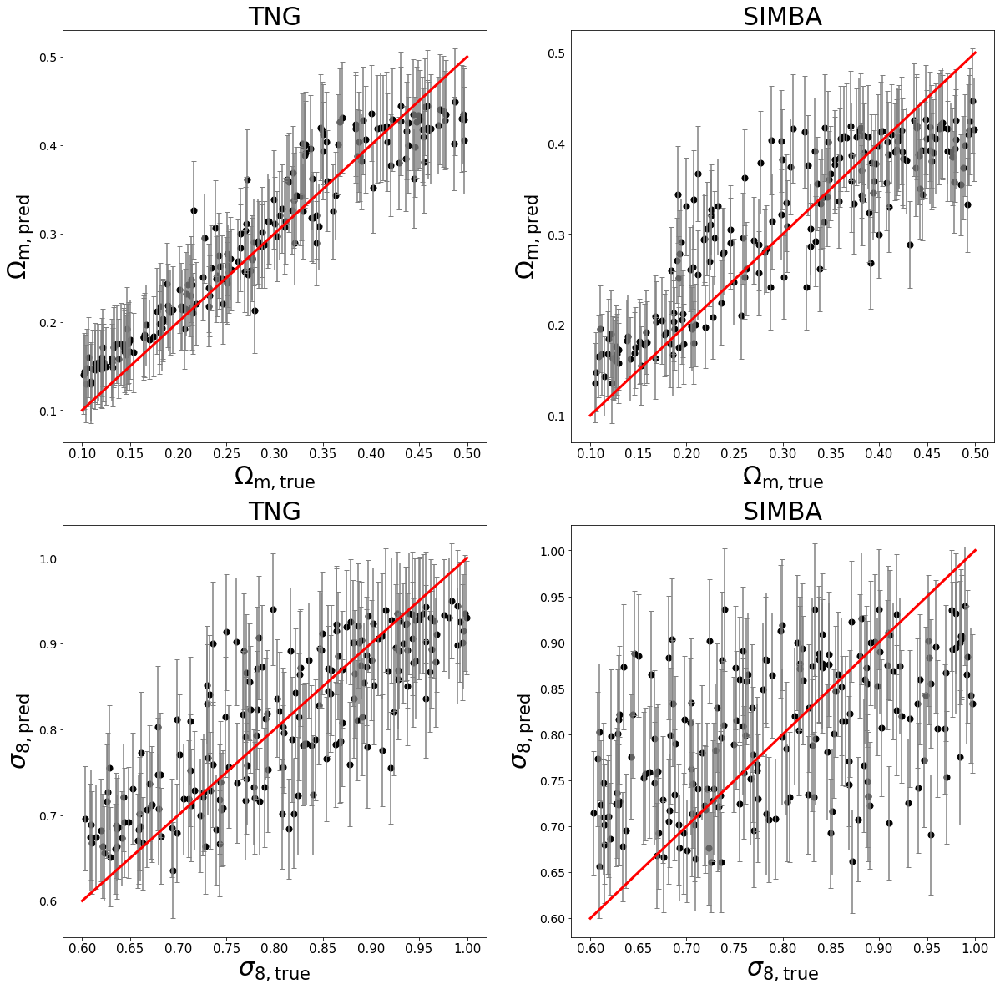

In [10]:
field = 'T';
norm = True
mono = True
h    = 1
fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}_L_10_dn_2".format(field,int(mono),int(norm),h)
mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=10, extended_dn=2, normalization=norm, monopole=mono)
mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
mist.make_plots(show_plot=True, data_return=False)
#mist.test_on(sims="ASTRID", fname="0.01", data_return=False,show_plot=True, show_score=False, save_plot=False)

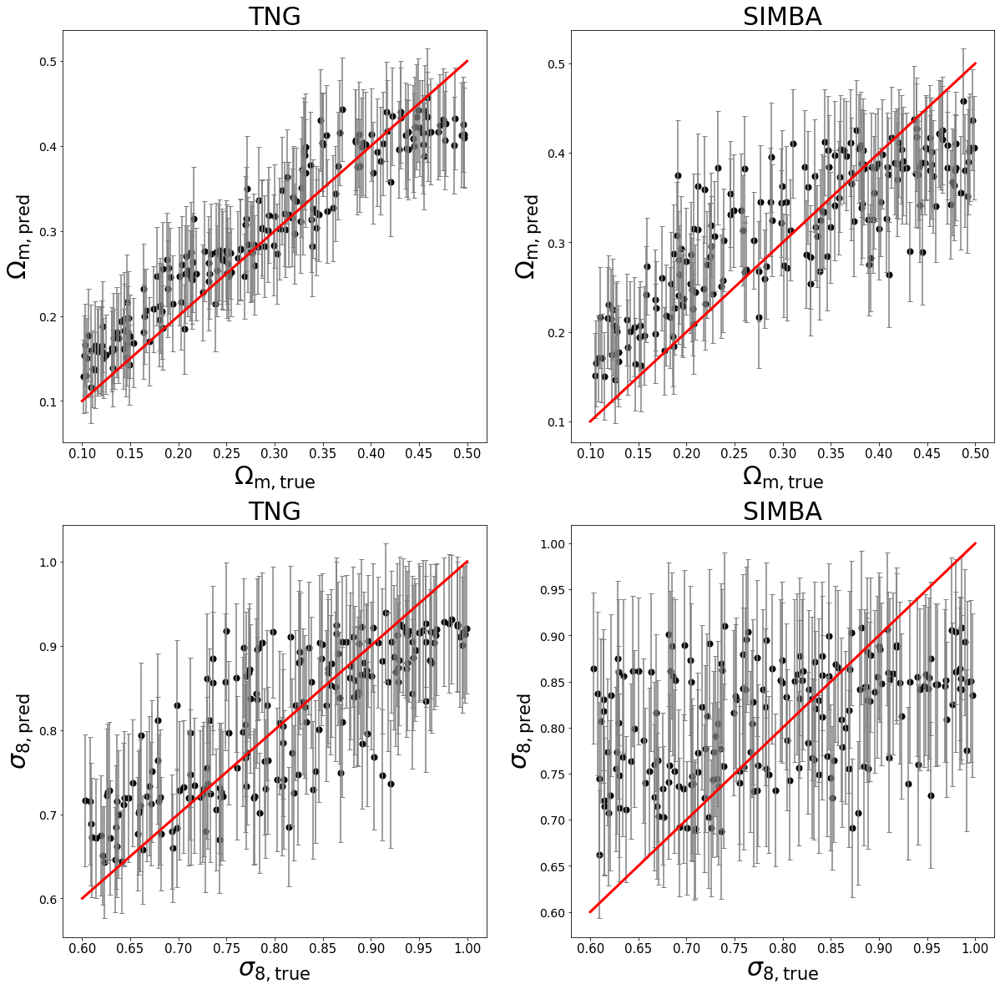

In [9]:
field = 'T';
norm = True
mono = True
h    = 0.5
fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}".format(field,int(mono),int(norm),h)
mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=False, normalization=norm, monopole=mono)
mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
mist.make_plots(show_plot=True, data_return=False)
#mist.test_on(sims="ASTRID", fname="0.01", data_return=False,show_plot=True, show_score=False, save_plot=False)

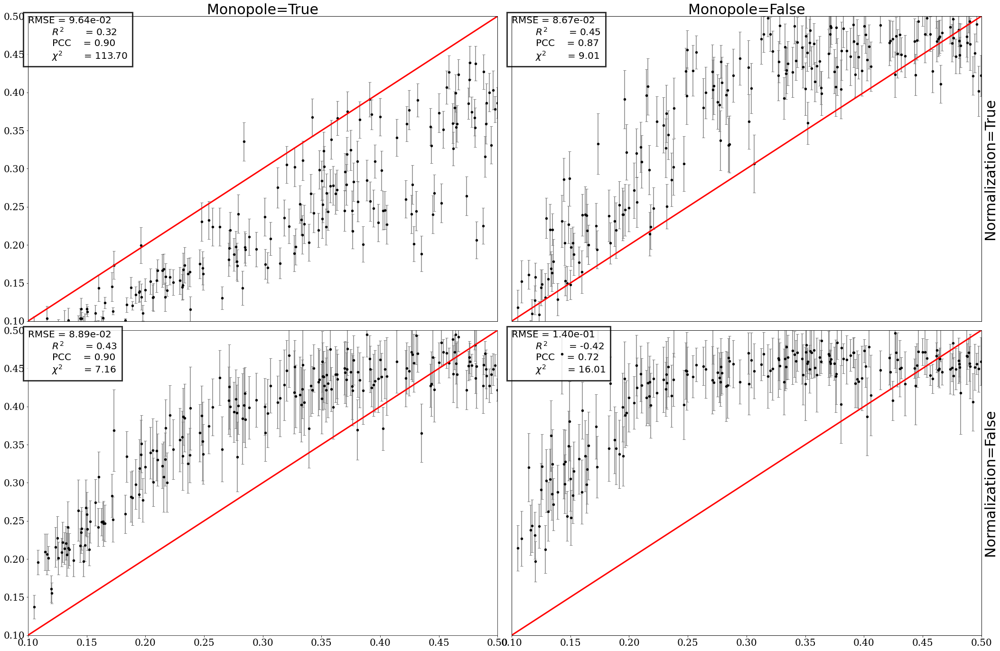

In [13]:
field = 'T';

fig_shape = (2,2)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(36,24),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,0.5,3)
ideal2 = np.linspace(0.2,1.2,3)


monos = [True, False]
norms = [True, False]
hs    = [0.5, 1, 2]
l=0
for i in range(2):
    for j in range(2):
        mono, norm, h = monos[i], norms[j], hs[1]
        fname = "search/TNG_{}_mono_{}_norm_{}_h_{}".format(field,int(mono),int(norm),h)
        mist = MIST(sim="TNG",field=field, extended_L=False,
                    normalization=norm, monopole=mono)
        mist.load_models(fname=fname, which_machine='vib',z_dim=200, hidden=h, dr=0.5)
        y_true, y_pred = mist.make_plots(show_plot=False, data_return=True)
        axes[i,j].errorbar(y_true[l][:,0], y_pred[l][0][:,0], y_pred[l][1][:,0],linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true[l][:,0], y_pred[l][0][:,0],s=20,c='k', zorder=10)
        RMSE = np.sqrt(mean_squared_error(y_true[l][:,0], y_pred[l][0][:,0]))
        R2   = r2_score(y_true[l][:,0], y_pred[l][0][:,0])
        PCC  = pearsonr(y_true[l][:,0], y_pred[l][0][:,0])[0]
        CHI2 = np.mean((y_true[l][:,0]-y_pred[l][0][:,0])**2/y_pred[l][1][:,0]**2)
        text = \
        r"""{:<5}= {:.2e}
        {:<12}= {:.2f}
        {:<7}= {:.2f}
        {:<15}= {:.2f}""".format("RMSE", RMSE,"$R^2$", R2,
                            "PCC", PCC, "$\chi^2$", CHI2)
        axes[i,j].text(0.1, 0.5, text, fontsize=20,
                       ha='left', va='top',bbox=dict(facecolor='white', alpha=0.8,pad=10,
                                                    edgecolor='black', linewidth=3))
        
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        remove_inner_axes(axes,fig_shape)
        axes[i,j].set_xlim(0.1,0.5)
        axes[i,j].set_ylim(0.1,0.5)
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"Monopole={}".format(mono),fontsize=fontsize)
        if i == 1:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"Normalization={}".format(norm),fontsize=fontsize)
#axes[0,3].set_xlabel("$\Omega_\mathrm{m, true}$", fontsize=fontsize)
#axes[0,3].set_ylabel("$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam_TNG.png", dpi=200, bbox_inches='tight')

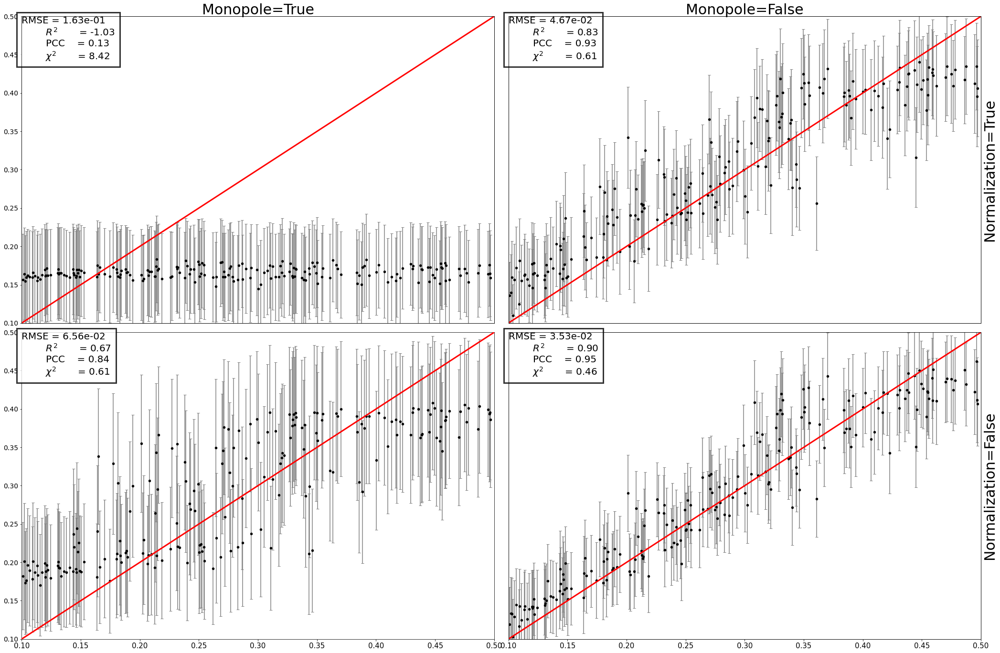

In [16]:
field = 'T';

fig_shape = (2,2)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(36,24),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,0.5,3)
ideal2 = np.linspace(0.2,1.2,3)


monos = [True, False]
norms = [True, False]
hs    = [0.5, 1, 2]
l=0
for i in range(2):
    for j in range(2):
        mono, norm, h = monos[i], norms[j], hs[1]
        fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}".format(field,int(mono),int(norm),h)
        mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=False,
                    normalization=norm, monopole=mono)
        mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
        y_true, y_pred = mist.make_plots(show_plot=False, data_return=True)
        axes[i,j].errorbar(y_true[l][:,0], y_pred[l][0][:,0], y_pred[l][1][:,0],linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true[l][:,0], y_pred[l][0][:,0],s=20,c='k', zorder=10)
        RMSE = np.sqrt(mean_squared_error(y_true[l][:,0], y_pred[l][0][:,0]))
        R2   = r2_score(y_true[l][:,0], y_pred[l][0][:,0])
        PCC  = pearsonr(y_true[l][:,0], y_pred[l][0][:,0])[0]
        CHI2 = np.mean((y_true[l][:,0]-y_pred[l][0][:,0])**2/y_pred[l][1][:,0]**2)
        text = \
        r"""{:<5}= {:.2e}
        {:<12}= {:.2f}
        {:<7}= {:.2f}
        {:<15}= {:.2f}""".format("RMSE", RMSE,"$R^2$", R2,
                            "PCC", PCC, "$\chi^2$", CHI2)
        axes[i,j].text(0.1, 0.5, text, fontsize=20,
                       ha='left', va='top',bbox=dict(facecolor='white', alpha=0.8,pad=10,
                                                    edgecolor='black', linewidth=3))
        
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        remove_inner_axes(axes,fig_shape)
        axes[i,j].set_xlim(0.1,0.5)
        axes[i,j].set_ylim(0.1,0.5)
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"Monopole={}".format(mono),fontsize=fontsize)
        if i == 1:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"Normalization={}".format(norm),fontsize=fontsize)
#axes[0,3].set_xlabel("$\Omega_\mathrm{m, true}$", fontsize=fontsize)
#axes[0,3].set_ylabel("$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam_TNG.png", dpi=200, bbox_inches='tight')

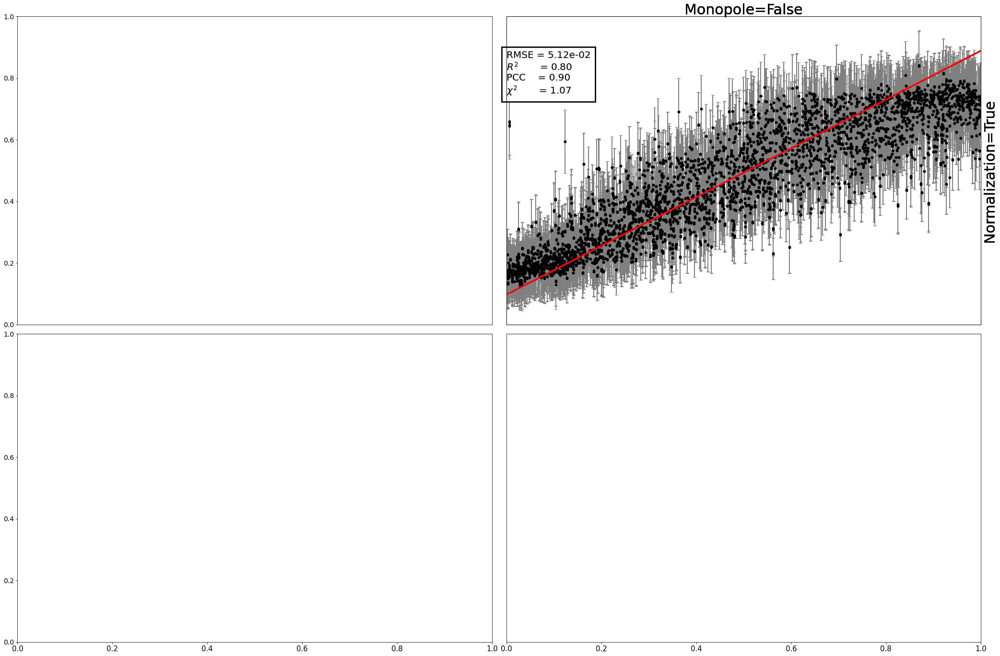

In [23]:
field = 'HI';

fig_shape = (2,2)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(36,24),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,0.5,3)
ideal2 = np.linspace(0.2,1.2,3)


monos = [True, False]
norms = [True, False]
hs    = [0.5, 1, 2]
average = False
l=1
for i in range(2):
    for j in range(2):
        i=1;j=0;
        mono, norm, h = monos[i], norms[j], hs[0]
        fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}_no_avg".format(field,int(mono),int(norm),h)
        mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=False,
                    normalization=norm, monopole=mono, average=average)
        mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
        y_true, y_pred = mist.make_plots(show_plot=False, data_return=True)
        y_true = y_true[l][:,0]
        y_mean = y_pred[l][0][:,0]
        y_std  = y_pred[l][1][:,0]
        
        axes[i,j].errorbar(y_true, y_mean, y_std,linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true, y_mean,s=20,c='k', zorder=10)
        
        RMSE = np.sqrt(mean_squared_error(y_true, y_mean))
        R2   = r2_score(y_true, y_mean)
        PCC  = pearsonr(y_true, y_mean)[0]
        CHI2 = np.mean((y_true-y_mean)**2/y_std**2)
        text = \
r"""{:<5}= {:.2e}
{:<12}= {:.2f}
{:<7}= {:.2f}
{:<15}= {:.2f}""".format("RMSE", RMSE,"$R^2$", R2,
                            "PCC", PCC, "$\chi^2$", CHI2)
        axes[i,j].text(0.1, 0.5, text, fontsize=20,
                       ha='left', va='top',bbox=dict(facecolor='white', alpha=0.8,pad=10,
                                                    edgecolor='black', linewidth=3))
        
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        remove_inner_axes(axes,fig_shape)
        axes[i,j].set_xlim(0.1,0.5)
        #axes[i,j].set_ylim(0.1,0.5)
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"Monopole={}".format(mono),fontsize=fontsize)
        if i == 1:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"Normalization={}".format(norm),fontsize=fontsize)
#axes[0,3].set_xlabel("$\Omega_\mathrm{m, true}$", fontsize=fontsize)
#axes[0,3].set_ylabel("$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam_TNG.png", dpi=200, bbox_inches='tight')

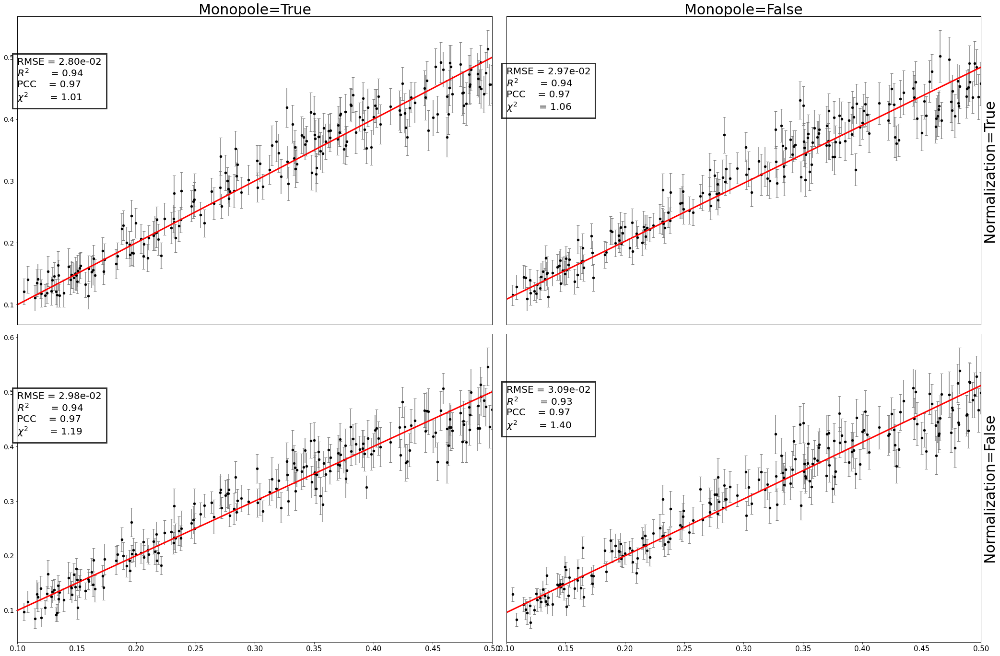

In [30]:
field = 'HI';

fig_shape = (2,2)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(36,24),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,0.5,3)
ideal2 = np.linspace(0.2,1.2,3)


monos = [True, False]
norms = [True, False]
hs    = [0.5, 1, 2]
average = True
sim   = "TNG"
l=0
for i in range(2):
    for j in range(2):
        mono, norm, h = monos[i], norms[j], hs[1]
        fname = "search/{}_{}_mono_{}_norm_{}_h_{}".format(sim, field,int(mono),int(norm),h)
        mist = MIST(sim=sim,field=field, extended_L=False,
                    normalization=norm, monopole=mono, average=average)
        mist.load_models(fname=fname, which_machine='vib',z_dim=200, hidden=h, dr=0.5)
        y_true, y_pred = mist.make_plots(show_plot=False, data_return=True)
        y_true = y_true[l][:,0]
        y_mean = y_pred[l][0][:,0]
        y_std  = y_pred[l][1][:,0]
        
        axes[i,j].errorbar(y_true, y_mean, y_std,linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true, y_mean,s=20,c='k', zorder=10)
        
        RMSE = np.sqrt(mean_squared_error(y_true, y_mean))
        R2   = r2_score(y_true, y_mean)
        PCC  = pearsonr(y_true, y_mean)[0]
        CHI2 = np.mean((y_true-y_mean)**2/y_std**2)
        text = \
r"""{:<5}= {:.2e}
{:<12}= {:.2f}
{:<7}= {:.2f}
{:<15}= {:.2f}""".format("RMSE", RMSE,"$R^2$", R2,
                            "PCC", PCC, "$\chi^2$", CHI2)
        axes[i,j].text(0.1, 0.5, text, fontsize=20,
                       ha='left', va='top',bbox=dict(facecolor='white', alpha=0.8,pad=10,
                                                    edgecolor='black', linewidth=3))
        
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        remove_inner_axes(axes,fig_shape)
        axes[i,j].set_xlim(0.1,0.5)
        #axes[i,j].set_ylim(0.1,0.5)
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"Monopole={}".format(mono),fontsize=fontsize)
        if i == 1:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"Normalization={}".format(norm),fontsize=fontsize)
#axes[0,3].set_xlabel("$\Omega_\mathrm{m, true}$", fontsize=fontsize)
#axes[0,3].set_ylabel("$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam_TNG.png", dpi=200, bbox_inches='tight')

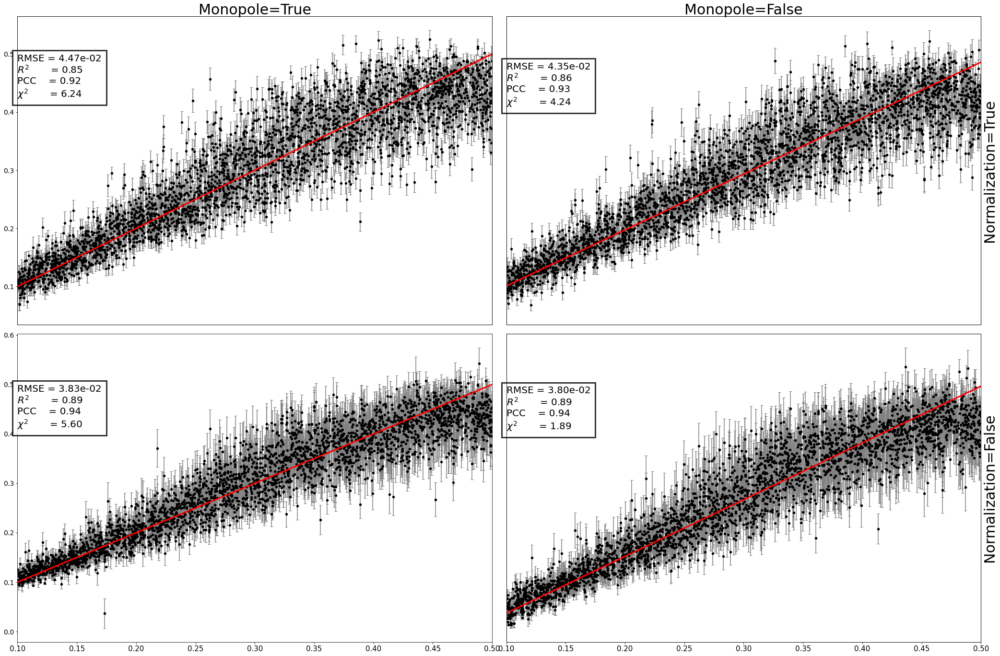

In [29]:
field = 'HI';

fig_shape = (2,2)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(36,24),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,0.5,3)
ideal2 = np.linspace(0.2,1.2,3)


monos = [True, False]
norms = [True, False]
hs    = [0.5, 1, 2]
average = False
sim   = "TNG"
l=0
for i in range(2):
    for j in range(2):
        mono, norm, h = monos[i], norms[j], hs[1]
        fname = "search/{}_{}_mono_{}_norm_{}_h_{}_no_avg".format(sim, field,int(mono),int(norm),h)
        mist = MIST(sim=sim,field=field, extended_L=False,
                    normalization=norm, monopole=mono, average=average)
        mist.load_models(fname=fname, which_machine='vib',z_dim=200, hidden=h, dr=0.5)
        y_true, y_pred = mist.make_plots(show_plot=False, data_return=True)
        y_true = y_true[l][:,0]
        y_mean = y_pred[l][0][:,0]
        y_std  = y_pred[l][1][:,0]
        
        axes[i,j].errorbar(y_true, y_mean, y_std,linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true, y_mean,s=20,c='k', zorder=10)
        
        RMSE = np.sqrt(mean_squared_error(y_true, y_mean))
        R2   = r2_score(y_true, y_mean)
        PCC  = pearsonr(y_true, y_mean)[0]
        CHI2 = np.mean((y_true-y_mean)**2/y_std**2)
        text = \
r"""{:<5}= {:.2e}
{:<12}= {:.2f}
{:<7}= {:.2f}
{:<15}= {:.2f}""".format("RMSE", RMSE,"$R^2$", R2,
                            "PCC", PCC, "$\chi^2$", CHI2)
        axes[i,j].text(0.1, 0.5, text, fontsize=20,
                       ha='left', va='top',bbox=dict(facecolor='white', alpha=0.8,pad=10,
                                                    edgecolor='black', linewidth=3))
        
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        remove_inner_axes(axes,fig_shape)
        axes[i,j].set_xlim(0.1,0.5)
        #axes[i,j].set_ylim(0.1,0.5)
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"Monopole={}".format(mono),fontsize=fontsize)
        if i == 1:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"Normalization={}".format(norm),fontsize=fontsize)
#axes[0,3].set_xlabel("$\Omega_\mathrm{m, true}$", fontsize=fontsize)
#axes[0,3].set_ylabel("$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam_TNG.png", dpi=200, bbox_inches='tight')

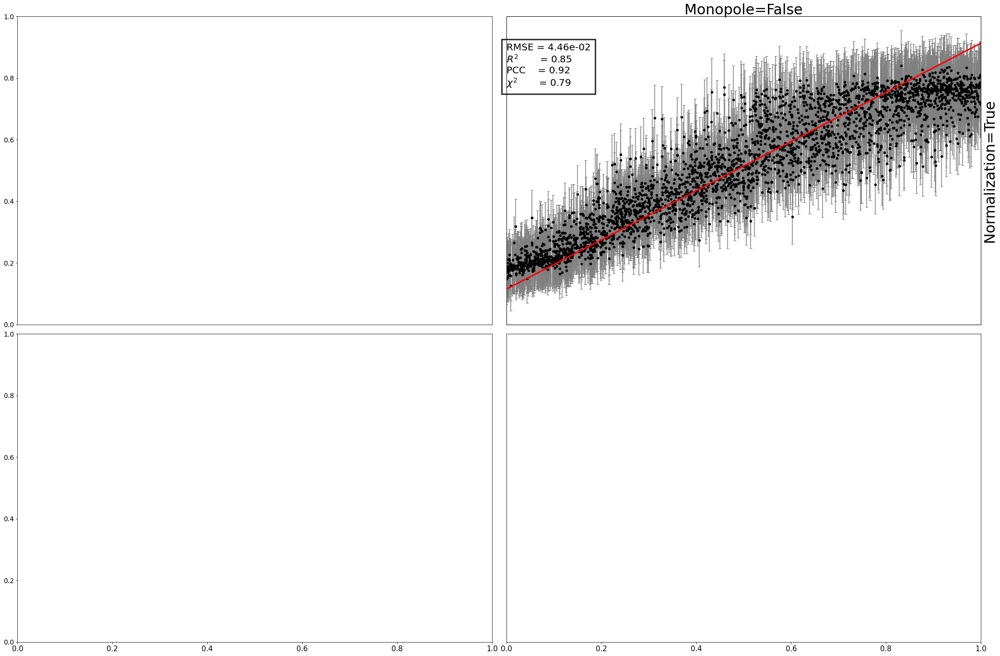

In [18]:
field = 'HI';

fig_shape = (2,2)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(36,24),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,0.5,3)
ideal2 = np.linspace(0.2,1.2,3)


monos = [True, False]
norms = [True, False]
hs    = [0.5, 1, 2]
average = False
l=0
for i in range(1):
    for j in range(1):
        i=1;j=0;
        mono, norm, h = monos[i], norms[j], hs[0]
        fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}_no_avg".format(field,int(mono),int(norm),h)
        mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=False,
                    normalization=norm, monopole=mono, average=average)
        mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
        y_true, y_pred = mist.make_plots(show_plot=False, data_return=True)
        y_true = y_true[l][:,0]
        y_mean = y_pred[l][0][:,0]
        y_std  = y_pred[l][1][:,0]
        
        axes[i,j].errorbar(y_true, y_mean, y_std,linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true, y_mean,s=20,c='k', zorder=10)
        
        RMSE = np.sqrt(mean_squared_error(y_true, y_mean))
        R2   = r2_score(y_true, y_mean)
        PCC  = pearsonr(y_true, y_mean)[0]
        CHI2 = np.mean((y_true-y_mean)**2/y_std**2)
        text = \
r"""{:<5}= {:.2e}
{:<12}= {:.2f}
{:<7}= {:.2f}
{:<15}= {:.2f}""".format("RMSE", RMSE,"$R^2$", R2,
                            "PCC", PCC, "$\chi^2$", CHI2)
        axes[i,j].text(0.1, 0.5, text, fontsize=20,
                       ha='left', va='top',bbox=dict(facecolor='white', alpha=0.8,pad=10,
                                                    edgecolor='black', linewidth=3))
        
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        remove_inner_axes(axes,fig_shape)
        axes[i,j].set_xlim(0.1,0.5)
        #axes[i,j].set_ylim(0.1,0.5)
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"Monopole={}".format(mono),fontsize=fontsize)
        if i == 1:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"Normalization={}".format(norm),fontsize=fontsize)
#axes[0,3].set_xlabel("$\Omega_\mathrm{m, true}$", fontsize=fontsize)
#axes[0,3].set_ylabel("$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam_TNG.png", dpi=200, bbox_inches='tight')

FileNotFoundError: [Errno 2] No such file or directory: './model/search/TNG+SIMBA_HI_mono_1_norm_0_h_0.5_no_avg_vib.pt'

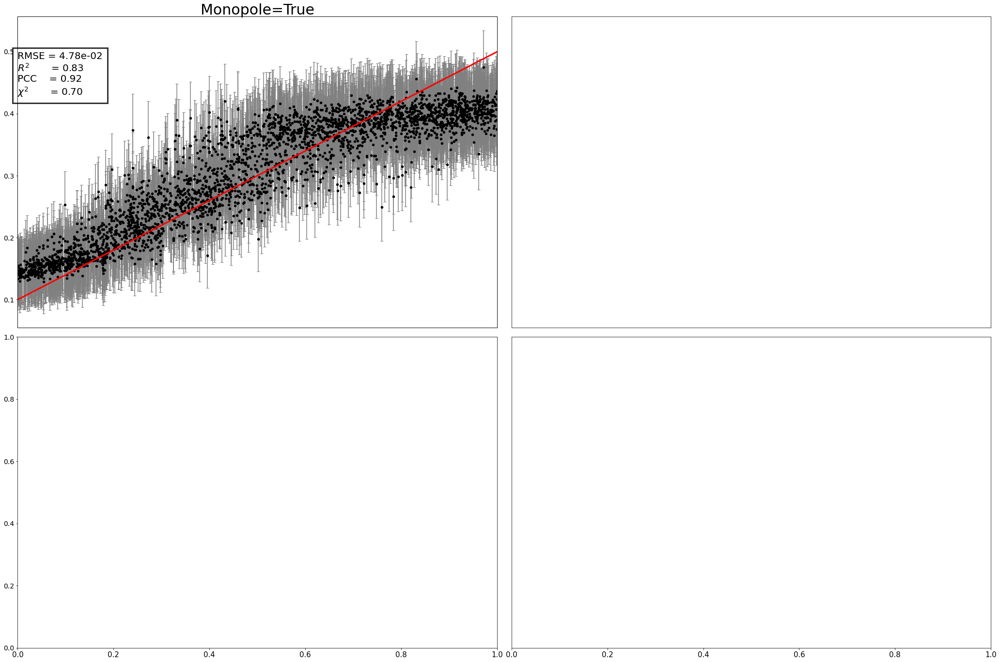

In [16]:
field = 'HI';

fig_shape = (2,2)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(36,24),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,0.5,3)
ideal2 = np.linspace(0.2,1.2,3)


monos = [True, False]
norms = [True, False]
hs    = [0.5, 1, 2]
average = False
l=0
for i in range(2):
    for j in range(2):
        mono, norm, h = monos[i], norms[j], hs[0]
        fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}_no_avg".format(field,int(mono),int(norm),h)
        mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=False,
                    normalization=norm, monopole=mono, average=average)
        mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
        y_true, y_pred = mist.make_plots(show_plot=False, data_return=True)
        y_true = y_true[l][:,0]
        y_mean = y_pred[l][0][:,0]
        y_std  = y_pred[l][1][:,0]
        
        axes[i,j].errorbar(y_true, y_mean, y_std,linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true, y_mean,s=20,c='k', zorder=10)
        
        RMSE = np.sqrt(mean_squared_error(y_true, y_mean))
        R2   = r2_score(y_true, y_mean)
        PCC  = pearsonr(y_true, y_mean)[0]
        CHI2 = np.mean((y_true-y_mean)**2/y_std**2)
        text = \
r"""{:<5}= {:.2e}
{:<12}= {:.2f}
{:<7}= {:.2f}
{:<15}= {:.2f}""".format("RMSE", RMSE,"$R^2$", R2,
                            "PCC", PCC, "$\chi^2$", CHI2)
        axes[i,j].text(0.1, 0.5, text, fontsize=20,
                       ha='left', va='top',bbox=dict(facecolor='white', alpha=0.8,pad=10,
                                                    edgecolor='black', linewidth=3))
        
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        remove_inner_axes(axes,fig_shape)
        axes[i,j].set_xlim(0.1,0.5)
        #axes[i,j].set_ylim(0.1,0.5)
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"Monopole={}".format(mono),fontsize=fontsize)
        if i == 1:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"Normalization={}".format(norm),fontsize=fontsize)
#axes[0,3].set_xlabel("$\Omega_\mathrm{m, true}$", fontsize=fontsize)
#axes[0,3].set_ylabel("$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam_TNG.png", dpi=200, bbox_inches='tight')

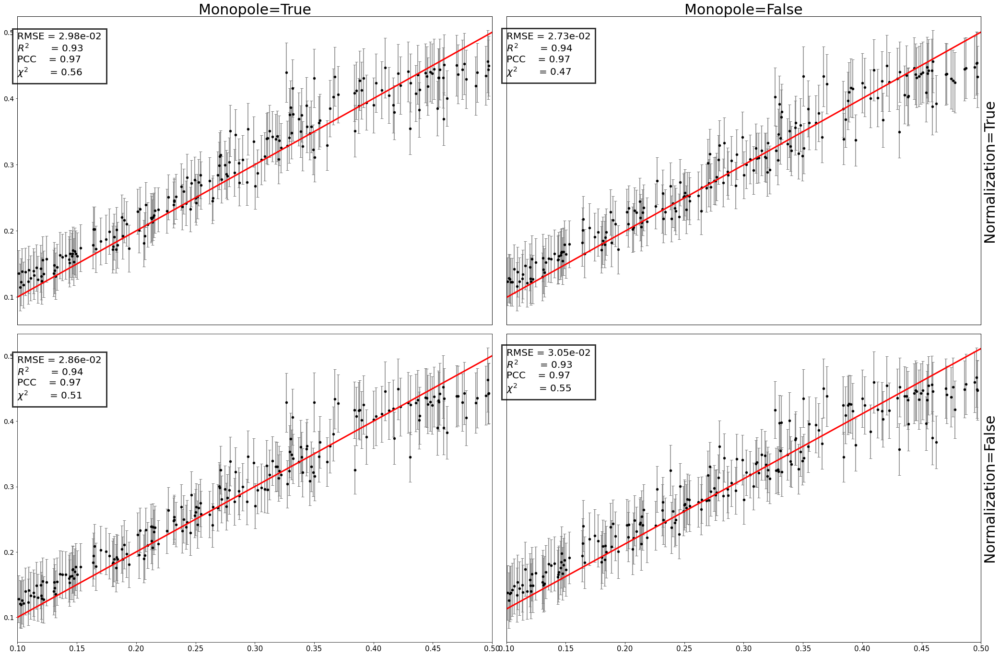

In [32]:
field = 'HI';

fig_shape = (2,2)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(36,24),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,0.5,3)
ideal2 = np.linspace(0.2,1.2,3)


monos = [True, False]
norms = [True, False]
hs    = [0.5, 1, 2]
l=0
for i in range(2):
    for j in range(2):
        mono, norm, h = monos[i], norms[j], hs[0]
        fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}".format(field,int(mono),int(norm),h)
        mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=False,
                    normalization=norm, monopole=mono)
        mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
        y_true, y_pred = mist.make_plots(show_plot=False, data_return=True)
        y_true = y_true[l][:,0]
        y_mean = y_pred[l][0][:,0]
        y_std  = y_pred[l][1][:,0]
        
        axes[i,j].errorbar(y_true, y_mean, y_std,linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true, y_mean,s=20,c='k', zorder=10)
        
        RMSE = np.sqrt(mean_squared_error(y_true, y_mean))
        R2   = r2_score(y_true, y_mean)
        PCC  = pearsonr(y_true, y_mean)[0]
        CHI2 = np.mean((y_true-y_mean)**2/y_std**2)
        text = \
r"""{:<5}= {:.2e}
{:<12}= {:.2f}
{:<7}= {:.2f}
{:<15}= {:.2f}""".format("RMSE", RMSE,"$R^2$", R2,
                            "PCC", PCC, "$\chi^2$", CHI2)
        axes[i,j].text(0.1, 0.5, text, fontsize=20,
                       ha='left', va='top',bbox=dict(facecolor='white', alpha=0.8,pad=10,
                                                    edgecolor='black', linewidth=3))
        
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        remove_inner_axes(axes,fig_shape)
        axes[i,j].set_xlim(0.1,0.5)
        #axes[i,j].set_ylim(0.1,0.5)
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"Monopole={}".format(mono),fontsize=fontsize)
        if i == 1:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"Normalization={}".format(norm),fontsize=fontsize)
#axes[0,3].set_xlabel("$\Omega_\mathrm{m, true}$", fontsize=fontsize)
#axes[0,3].set_ylabel("$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam_TNG.png", dpi=200, bbox_inches='tight')

0.024411430015014418 0.37795966227778666
0.02370237099090386 0.35040306680148803
0.025539084378825235 0.39724300253657036
0.02685599501653836 0.42270103932089226


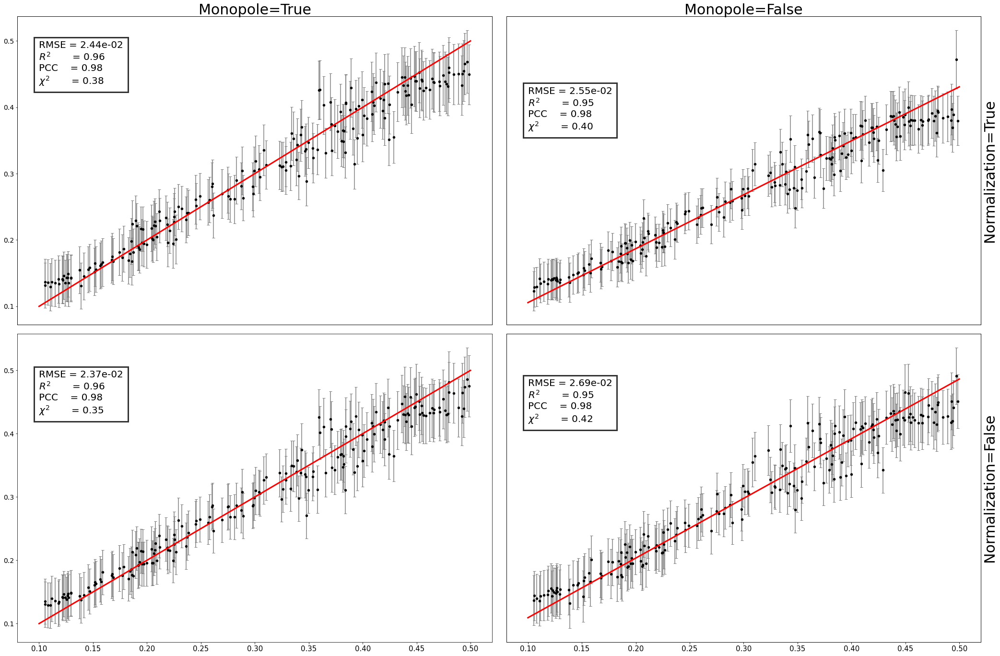

In [33]:
field = 'HI';

fig_shape = (2,2)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(36,24),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,0.5,3)
ideal2 = np.linspace(0.2,1.2,3)


monos = [True, False]
norms = [True, False]
hs    = [0.5, 1, 2]
l=1
for i in range(2):
    for j in range(2):
        mono, norm, h = monos[i], norms[j], hs[1]
        fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}".format(field,int(mono),int(norm),h)
        mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=False,
                    normalization=norm, monopole=mono)
        mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
        y_true, y_pred = mist.make_plots(show_plot=False, data_return=True)
        y_true = y_true[l][:,0]
        y_mean = y_pred[l][0][:,0]
        y_std  = y_pred[l][1][:,0]
        y_true = y_true[y_mean>0]
        y_std  = y_std[y_mean>0]
        y_mean = y_mean[y_mean>0]
        
        axes[i,j].errorbar(y_true, y_mean, y_std,linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true, y_mean,s=20,c='k', zorder=10)
        
        RMSE = np.sqrt(mean_squared_error(y_true, y_mean))
        R2   = r2_score(y_true, y_mean)
        PCC  = pearsonr(y_true, y_mean)[0]
        CHI2 = np.mean((y_true-y_mean)**2/y_std**2)
        print(RMSE, CHI2)
        text = \
r"""{:<5}= {:.2e}
{:<12}= {:.2f}
{:<7}= {:.2f}
{:<15}= {:.2f}""".format("RMSE", RMSE,"$R^2$", R2,
                            "PCC", PCC, "$\chi^2$", CHI2)
        axes[i,j].text(0.1, 0.5, text, fontsize=20,
                       ha='left', va='top',bbox=dict(facecolor='white', alpha=0.8,pad=10,
                                                    edgecolor='black', linewidth=3))
        
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        remove_inner_axes(axes,fig_shape)
        #axes[i,j].set_xlim(0.1,0.5)
        #axes[i,j].set_ylim(0.1,0.5)
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"Monopole={}".format(mono),fontsize=fontsize)
        if i == 1:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"Normalization={}".format(norm),fontsize=fontsize)
#axes[0,3].set_xlabel("$\Omega_\mathrm{m, true}$", fontsize=fontsize)
#axes[0,3].set_ylabel("$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam_TNG.png", dpi=200, bbox_inches='tight')

0.14503227102340607 2.3100704701320947
0.10520937280992763 1.0543733940591145
0.07319424031342736 0.8036311233168769
0.06721941627987851 0.8679832183387931


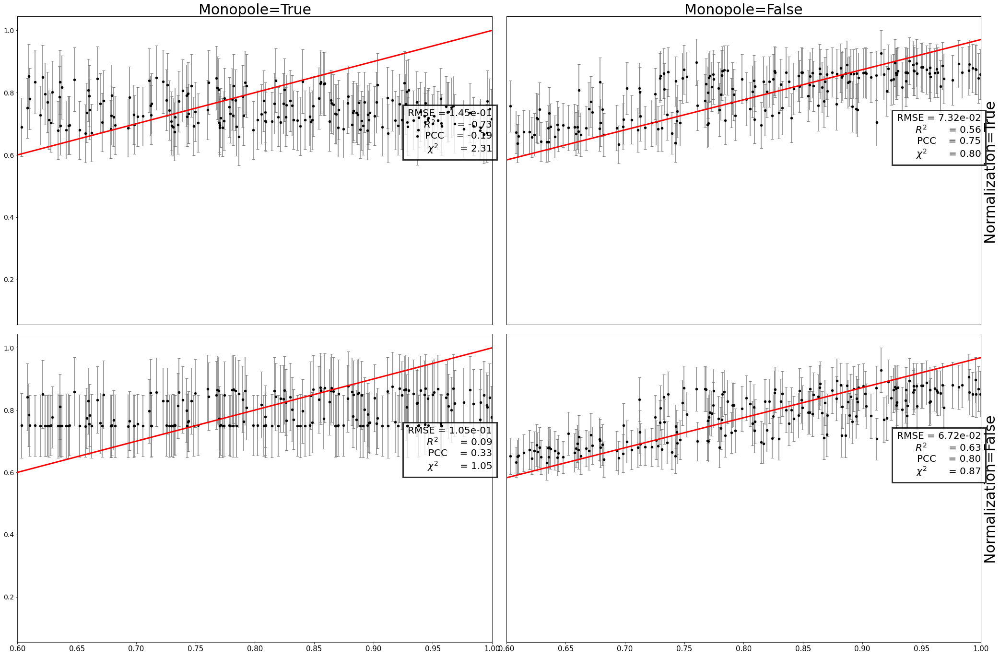

In [42]:
field = 'T';

fig_shape = (2,2)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(36,24),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,1,3)
ideal2 = np.linspace(0.2,1.2,3)


monos = [True, False]
norms = [True, False]
hs    = [0.5, 1, 2]
l=0
m=1
for i in range(2):
    for j in range(2):
        mono, norm, h = monos[i], norms[j], hs[1]
        fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}".format(field,int(mono),int(norm),h)
        mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=False,
                    normalization=norm, monopole=mono)
        mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
        y_true, y_pred = mist.make_plots(show_plot=False, data_return=True)
        y_true = y_true[l][:,m]
        y_mean = y_pred[l][0][:,m]
        y_std  = y_pred[l][1][:,m]
        y_true = y_true[y_mean>0]
        y_std  = y_std[y_mean>0]
        y_mean = y_mean[y_mean>0]
        
        axes[i,j].errorbar(y_true, y_mean, y_std,linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true, y_mean,s=20,c='k', zorder=10)
        
        RMSE = np.sqrt(mean_squared_error(y_true, y_mean))
        R2   = r2_score(y_true, y_mean)
        PCC  = pearsonr(y_true, y_mean)[0]
        CHI2 = np.mean((y_true-y_mean)**2/y_std**2)
        print(RMSE, CHI2)
        text = \
r"""{:<5}= {:.2e}
{:<12}= {:.2f}
{:<7}= {:.2f}
{:<15}= {:.2f}""".format("RMSE", RMSE,"$R^2$", R2,
                            "PCC", PCC, "$\chi^2$", CHI2)
        axes[i,j].text(1, 0.6, text, fontsize=20,
                       ha='right', va='bottom',bbox=dict(facecolor='white', alpha=0.8,pad=10,
                                                    edgecolor='black', linewidth=3))
        
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        remove_inner_axes(axes,fig_shape)
        #axes[i,j].set_xlim(0.1,0.5)
        axes[i,j].set_xlim(0.6,1)
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"Monopole={}".format(mono),fontsize=fontsize)
        if i == 1:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"Normalization={}".format(norm),fontsize=fontsize)
#axes[0,3].set_xlabel("$\Omega_\mathrm{m, true}$", fontsize=fontsize)
#axes[0,3].set_ylabel("$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam_TNG.png", dpi=200, bbox_inches='tight')

0.18900112245204312 4.248956146716418
0.10478187461684844 1.010117427859828
0.11311520684105136 1.8717269333930504
0.10565578547844989 2.1308005385502233


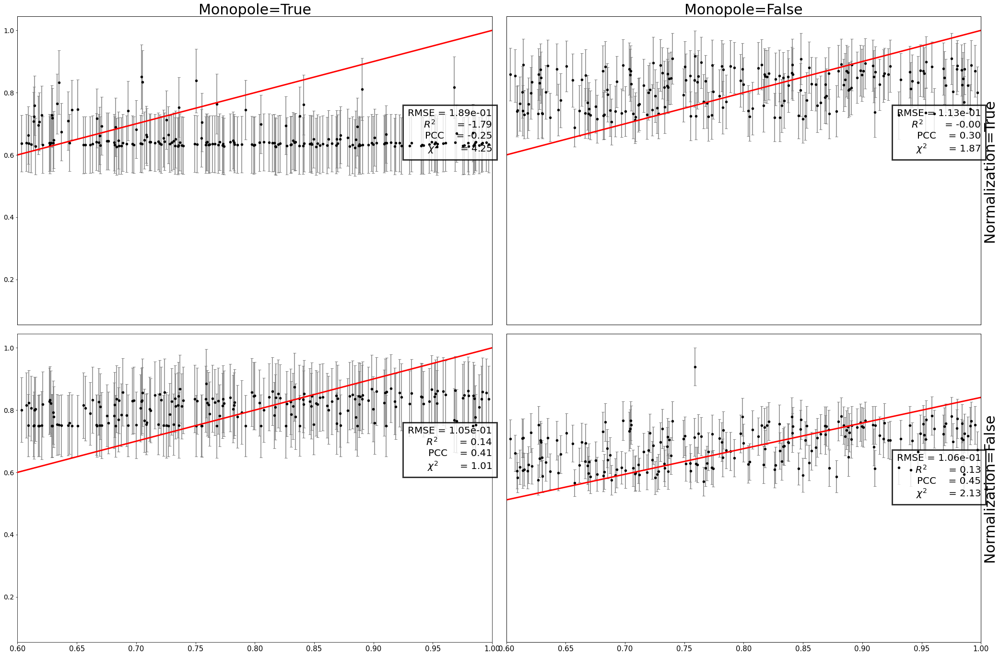

In [44]:
field = 'T';

fig_shape = (2,2)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(36,24),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,1,3)
ideal2 = np.linspace(0.2,1.2,3)


monos = [True, False]
norms = [True, False]
hs    = [0.5, 1, 2]
l=1
m=1
for i in range(2):
    for j in range(2):
        mono, norm, h = monos[i], norms[j], hs[1]
        fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}".format(field,int(mono),int(norm),h)
        mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=False,
                    normalization=norm, monopole=mono)
        mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
        y_true, y_pred = mist.make_plots(show_plot=False, data_return=True)
        y_true = y_true[l][:,m]
        y_mean = y_pred[l][0][:,m]
        y_std  = y_pred[l][1][:,m]
        y_true = y_true[y_mean>0]
        y_std  = y_std[y_mean>0]
        y_mean = y_mean[y_mean>0]
        
        axes[i,j].errorbar(y_true, y_mean, y_std,linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true, y_mean,s=20,c='k', zorder=10)
        
        RMSE = np.sqrt(mean_squared_error(y_true, y_mean))
        R2   = r2_score(y_true, y_mean)
        PCC  = pearsonr(y_true, y_mean)[0]
        CHI2 = np.mean((y_true-y_mean)**2/y_std**2)
        print(RMSE, CHI2)
        text = \
r"""{:<5}= {:.2e}
{:<12}= {:.2f}
{:<7}= {:.2f}
{:<15}= {:.2f}""".format("RMSE", RMSE,"$R^2$", R2,
                            "PCC", PCC, "$\chi^2$", CHI2)
        axes[i,j].text(1, 0.6, text, fontsize=20,
                       ha='right', va='bottom',bbox=dict(facecolor='white', alpha=0.8,pad=10,
                                                    edgecolor='black', linewidth=3))
        
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        remove_inner_axes(axes,fig_shape)
        #axes[i,j].set_xlim(0.1,0.5)
        axes[i,j].set_xlim(0.6,1)
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"Monopole={}".format(mono),fontsize=fontsize)
        if i == 1:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"Normalization={}".format(norm),fontsize=fontsize)
#axes[0,3].set_xlabel("$\Omega_\mathrm{m, true}$", fontsize=fontsize)
#axes[0,3].set_ylabel("$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam_TNG.png", dpi=200, bbox_inches='tight')

0.05277663526844983 1.0999066011500194
0.0333728290595907 0.4344285781813338
0.04066258459526885 0.563586066916536
0.039958038015918095 0.5341236734666465


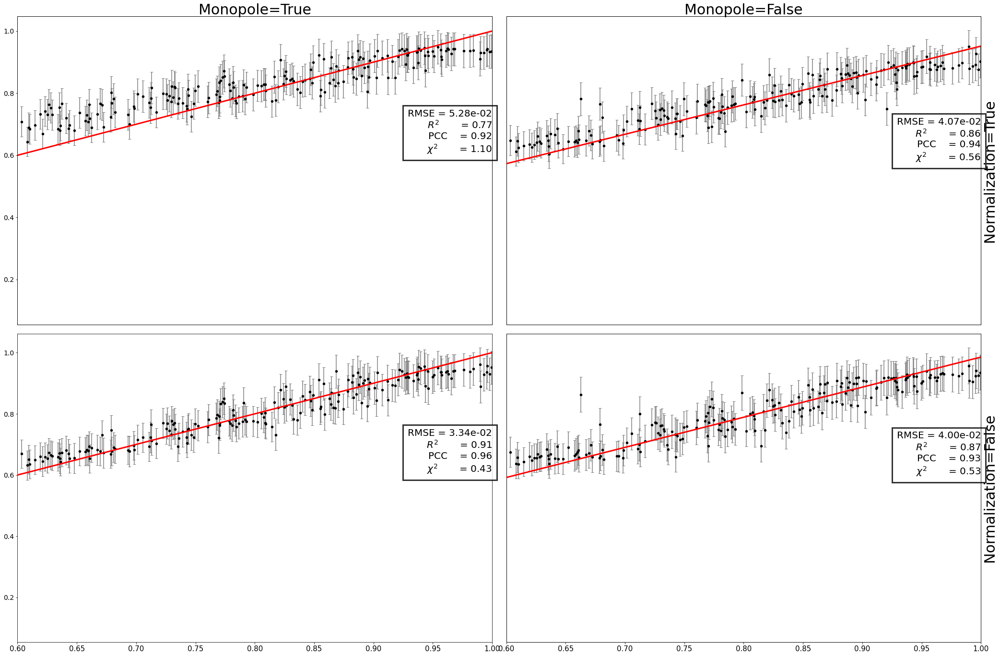

In [45]:
field = 'HI';

fig_shape = (2,2)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(36,24),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,1,3)
ideal2 = np.linspace(0.2,1.2,3)


monos = [True, False]
norms = [True, False]
hs    = [0.5, 1, 2]
l=0
m=1
for i in range(2):
    for j in range(2):
        mono, norm, h = monos[i], norms[j], hs[1]
        fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}".format(field,int(mono),int(norm),h)
        mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=False,
                    normalization=norm, monopole=mono)
        mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
        y_true, y_pred = mist.make_plots(show_plot=False, data_return=True)
        y_true = y_true[l][:,m]
        y_mean = y_pred[l][0][:,m]
        y_std  = y_pred[l][1][:,m]
        y_true = y_true[y_mean>0.5]
        y_std  = y_std[y_mean>0.5]
        y_mean = y_mean[y_mean>0.5]
        
        axes[i,j].errorbar(y_true, y_mean, y_std,linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true, y_mean,s=20,c='k', zorder=10)
        
        RMSE = np.sqrt(mean_squared_error(y_true, y_mean))
        R2   = r2_score(y_true, y_mean)
        PCC  = pearsonr(y_true, y_mean)[0]
        CHI2 = np.mean((y_true-y_mean)**2/y_std**2)
        print(RMSE, CHI2)
        text = \
r"""{:<5}= {:.2e}
{:<12}= {:.2f}
{:<7}= {:.2f}
{:<15}= {:.2f}""".format("RMSE", RMSE,"$R^2$", R2,
                            "PCC", PCC, "$\chi^2$", CHI2)
        axes[i,j].text(1, 0.6, text, fontsize=20,
                       ha='right', va='bottom',bbox=dict(facecolor='white', alpha=0.8,pad=10,
                                                    edgecolor='black', linewidth=3))
        
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        remove_inner_axes(axes,fig_shape)
        #axes[i,j].set_xlim(0.1,0.5)
        axes[i,j].set_xlim(0.6,1)
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"Monopole={}".format(mono),fontsize=fontsize)
        if i == 1:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"Normalization={}".format(norm),fontsize=fontsize)
#axes[0,3].set_xlabel("$\Omega_\mathrm{m, true}$", fontsize=fontsize)
#axes[0,3].set_ylabel("$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam_TNG.png", dpi=200, bbox_inches='tight')

0.06679015435207948 1.731477397105063
0.06571876216200799 1.6711934014473109
0.07107188306921 1.666431282077474
0.07167088659736941 1.6893643101891922


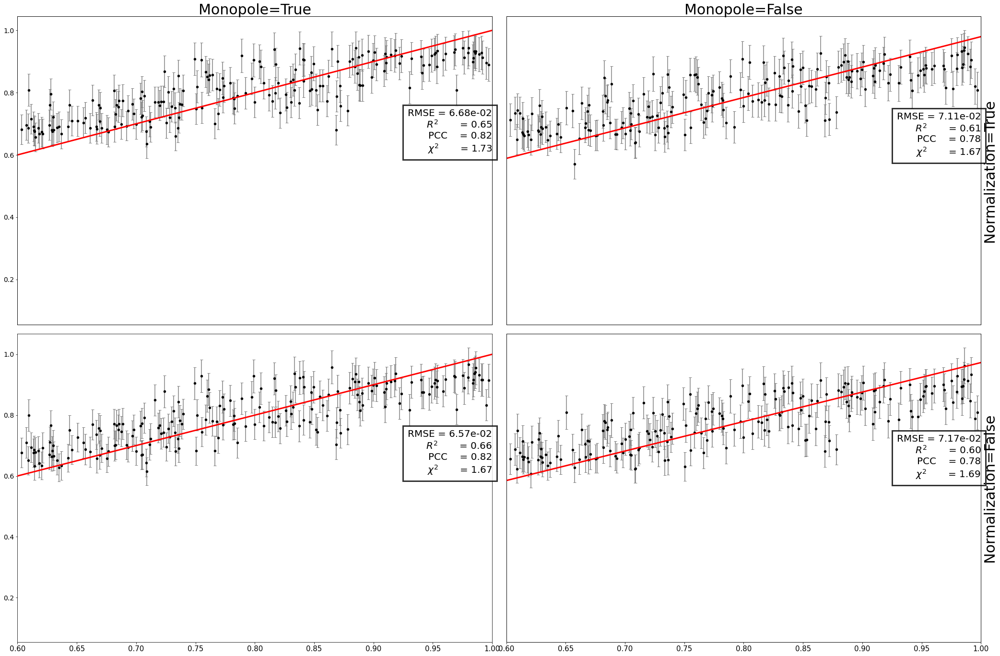

In [43]:
field = 'HI';

fig_shape = (2,2)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(36,24),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,1,3)
ideal2 = np.linspace(0.2,1.2,3)


monos = [True, False]
norms = [True, False]
hs    = [0.5, 1, 2]
l=1
m=1
for i in range(2):
    for j in range(2):
        mono, norm, h = monos[i], norms[j], hs[1]
        fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}".format(field,int(mono),int(norm),h)
        mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=False,
                    normalization=norm, monopole=mono)
        mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
        y_true, y_pred = mist.make_plots(show_plot=False, data_return=True)
        y_true = y_true[l][:,m]
        y_mean = y_pred[l][0][:,m]
        y_std  = y_pred[l][1][:,m]
        y_true = y_true[y_mean>0.5]
        y_std  = y_std[y_mean>0.5]
        y_mean = y_mean[y_mean>0.5]
        
        axes[i,j].errorbar(y_true, y_mean, y_std,linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true, y_mean,s=20,c='k', zorder=10)
        
        RMSE = np.sqrt(mean_squared_error(y_true, y_mean))
        R2   = r2_score(y_true, y_mean)
        PCC  = pearsonr(y_true, y_mean)[0]
        CHI2 = np.mean((y_true-y_mean)**2/y_std**2)
        print(RMSE, CHI2)
        text = \
r"""{:<5}= {:.2e}
{:<12}= {:.2f}
{:<7}= {:.2f}
{:<15}= {:.2f}""".format("RMSE", RMSE,"$R^2$", R2,
                            "PCC", PCC, "$\chi^2$", CHI2)
        axes[i,j].text(1, 0.6, text, fontsize=20,
                       ha='right', va='bottom',bbox=dict(facecolor='white', alpha=0.8,pad=10,
                                                    edgecolor='black', linewidth=3))
        
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        remove_inner_axes(axes,fig_shape)
        #axes[i,j].set_xlim(0.1,0.5)
        axes[i,j].set_xlim(0.6,1)
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"Monopole={}".format(mono),fontsize=fontsize)
        if i == 1:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"Normalization={}".format(norm),fontsize=fontsize)
#axes[0,3].set_xlabel("$\Omega_\mathrm{m, true}$", fontsize=fontsize)
#axes[0,3].set_ylabel("$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam_TNG.png", dpi=200, bbox_inches='tight')

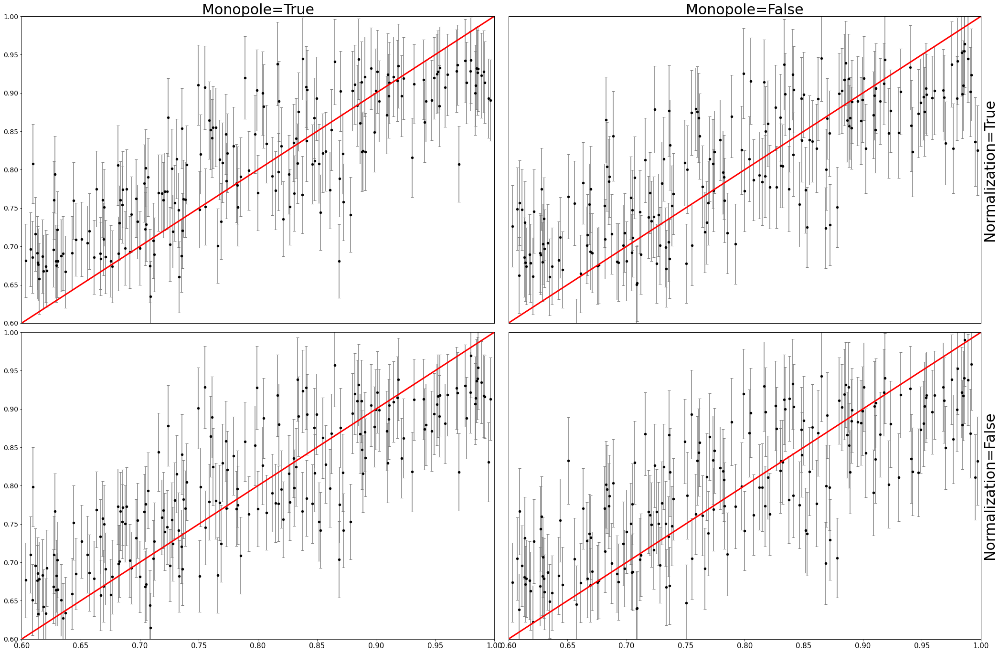

In [9]:
field = 'HI';

fig_shape = (2,2)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(36,24),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,1,3)
ideal2 = np.linspace(0.2,1.2,3)


monos = [True, False]
norms = [True, False]
hs    = [0.5, 1, 2]
l=1
for i in range(2):
    for j in range(2):
        mono, norm, h = monos[i], norms[j], hs[1]
        fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}".format(field,int(mono),int(norm),h)
        mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=False,
                    normalization=norm, monopole=mono)
        mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
        y_true, y_pred = mist.make_plots(show_plot=False, data_return=True)
        axes[i,j].errorbar(y_true[l][:,1], y_pred[l][0][:,1], y_pred[l][1][:,1],linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true[l][:,1], y_pred[l][0][:,1],s=20,c='k', zorder=10)
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        remove_inner_axes(axes,fig_shape)
        axes[i,j].set_xlim(0.6,1.0)
        axes[i,j].set_ylim(0.6,1.0)
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"Monopole={}".format(mono),fontsize=fontsize)
        if i == 1:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"Normalization={}".format(norm),fontsize=fontsize)
#axes[0,3].set_xlabel("$\Omega_\mathrm{m, true}$", fontsize=fontsize)
#axes[0,3].set_ylabel("$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam_TNG.png", dpi=200, bbox_inches='tight')

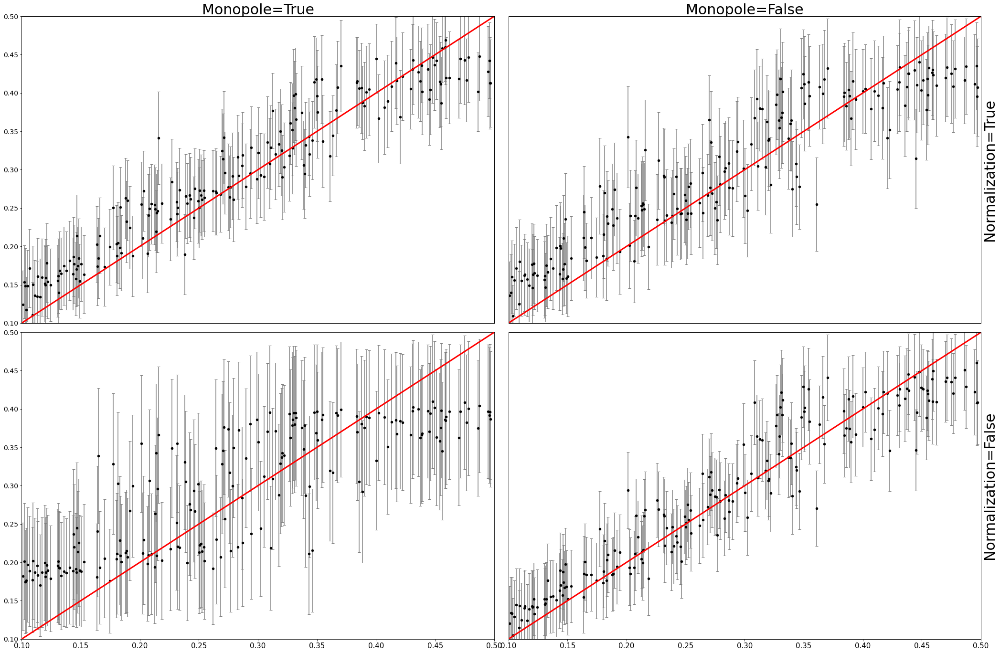

In [7]:
field = 'T';

fig_shape = (2,2)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(36,24),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,0.5,3)
ideal2 = np.linspace(0.2,1.2,3)


monos = [True, False]
norms = [True, False]
hs    = [0.5, 1, 2]
l=0
for i in range(2):
    for j in range(2):
        mono, norm, h = monos[i], norms[j], hs[1]
        fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}".format(field,int(mono),int(norm),h)
        mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=False,
                    normalization=norm, monopole=mono)
        mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
        y_true, y_pred = mist.make_plots(show_plot=False, data_return=True)
        axes[i,j].errorbar(y_true[l][:,0], y_pred[l][0][:,0], y_pred[l][1][:,0],linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true[l][:,0], y_pred[l][0][:,0],s=20,c='k', zorder=10)
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        remove_inner_axes(axes,fig_shape)
        axes[i,j].set_xlim(0.1,0.5)
        axes[i,j].set_ylim(0.1,0.5)
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"Monopole={}".format(mono),fontsize=fontsize)
        if i == 1:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"Normalization={}".format(norm),fontsize=fontsize)
#axes[0,3].set_xlabel("$\Omega_\mathrm{m, true}$", fontsize=fontsize)
#axes[0,3].set_ylabel("$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam_TNG.png", dpi=200, bbox_inches='tight')

RuntimeError: Error(s) in loading state_dict for VIB_a:
	size mismatch for nn_encoder.0.weight: copying a param with shape torch.Size([4504, 9009]) from checkpoint, the shape in current model is torch.Size([1552, 3105]).
	size mismatch for nn_encoder.0.bias: copying a param with shape torch.Size([4504]) from checkpoint, the shape in current model is torch.Size([1552]).
	size mismatch for nn_encoder.3.weight: copying a param with shape torch.Size([2252, 4504]) from checkpoint, the shape in current model is torch.Size([776, 1552]).
	size mismatch for nn_encoder.3.bias: copying a param with shape torch.Size([2252]) from checkpoint, the shape in current model is torch.Size([776]).
	size mismatch for nn_encoder.6.weight: copying a param with shape torch.Size([1126, 2252]) from checkpoint, the shape in current model is torch.Size([388, 776]).
	size mismatch for nn_encoder.6.bias: copying a param with shape torch.Size([1126]) from checkpoint, the shape in current model is torch.Size([388]).
	size mismatch for nn_encoder.9.weight: copying a param with shape torch.Size([200, 1126]) from checkpoint, the shape in current model is torch.Size([200, 388]).

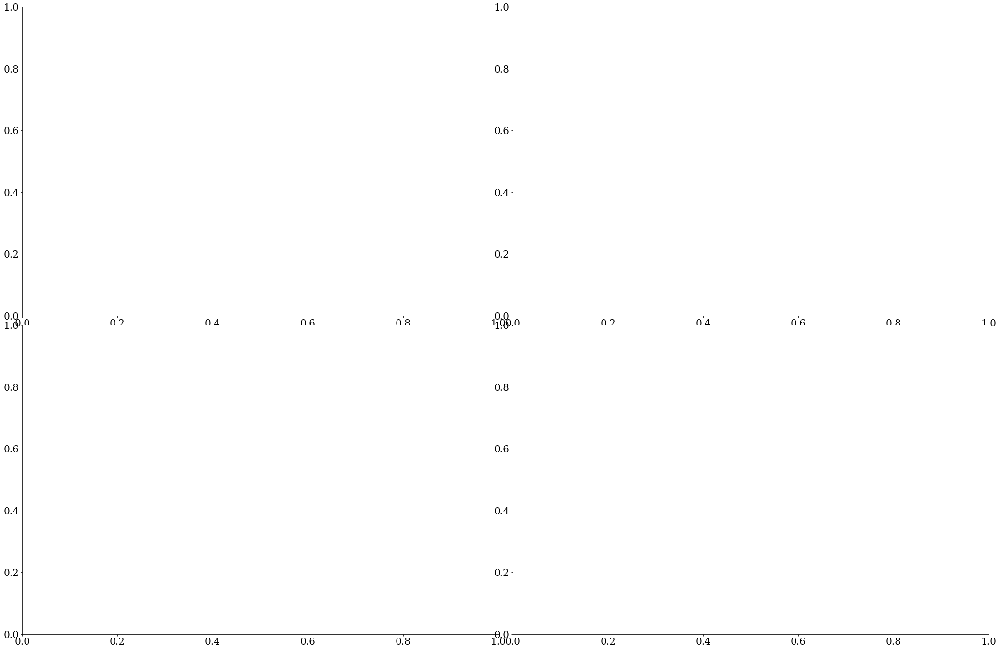

In [12]:
field = 'T';

fig_shape = (2,2)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(36,24),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,0.5,3)
ideal2 = np.linspace(0.2,1.2,3)


monos = [True, False]
norms = [True, False]
hs    = [0.5, 1, 2]
l=1
for i in range(2):
    for j in range(2):
        mono, norm, h = monos[i], norms[j], hs[1]
        fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}".format(field,int(mono),int(norm),h)
        mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=False, extended_dn=False,
                    normalization=norm, monopole=mono)
        mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
        y_true, y_pred = mist.make_plots(show_plot=False, data_return=True)
        axes[i,j].errorbar(y_true[l][:,0], y_pred[l][0][:,0], y_pred[l][1][:,0],linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true[l][:,0], y_pred[l][0][:,0],s=20,c='k', zorder=10)
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        remove_inner_axes(axes,fig_shape)
        axes[i,j].set_xlim(0.1,0.5)
        axes[i,j].set_ylim(0.1,0.5)
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"Monopole={}".format(mono),fontsize=fontsize)
        if i == 1:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"Normalization={}".format(norm),fontsize=fontsize)
#axes[0,3].set_xlabel("$\Omega_\mathrm{m, true}$", fontsize=fontsize)
#axes[0,3].set_ylabel("$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam_TNG.png", dpi=200, bbox_inches='tight')

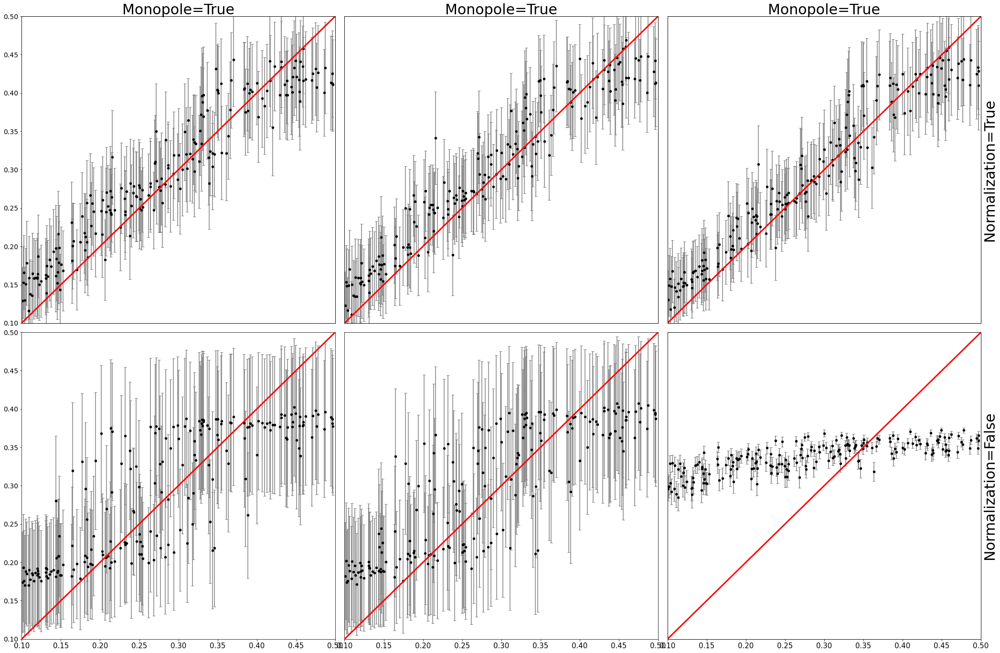

In [7]:
field = 'T';

fig_shape = (3,2)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(36,24),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,0.5,3)
ideal2 = np.linspace(0.2,1.2,3)


monos = [True, False]
norms = [True, False]
hs    = [0.5, 1, 2]
l=0
for i in range(3):
    for j in range(2):
        mono, norm, h = True, norms[j], hs[i]
        fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}".format(field,int(mono),int(norm),h)
        mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=False,
                    normalization=norm, monopole=mono)
        mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
        y_true, y_pred = mist.make_plots(show_plot=False, data_return=True)
        axes[i,j].errorbar(y_true[l][:,0], y_pred[l][0][:,0], y_pred[l][1][:,0],linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true[l][:,0], y_pred[l][0][:,0],s=20,c='k', zorder=10)
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        remove_inner_axes(axes,fig_shape)
        axes[i,j].set_xlim(0.1,0.5)
        axes[i,j].set_ylim(0.1,0.5)
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"Monopole={}".format(mono),fontsize=fontsize)
        if i == 2:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"Normalization={}".format(norm),fontsize=fontsize)
#axes[0,3].set_xlabel("$\Omega_\mathrm{m, true}$", fontsize=fontsize)
#axes[0,3].set_ylabel("$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam_TNG.png", dpi=200, bbox_inches='tight')

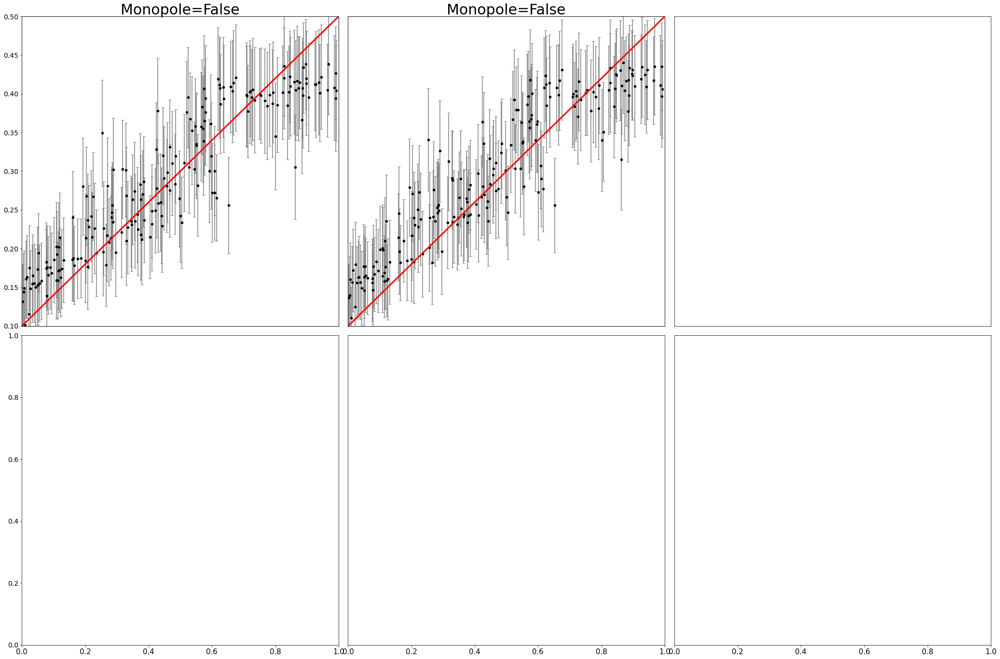

In [8]:
field = 'T';

fig_shape = (3,2)
axes = generateAxesForMultiplePlots(shape=fig_shape,figsize=(36,24),wspace=0.03,hspace=0.03)
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
fontsize = 30
ideal1 = np.linspace(0.1,0.5,3)
ideal2 = np.linspace(0.2,1.2,3)


monos = [True, False]
norms = [True, False]
hs    = [0.5, 1, 2]
l=0
for i in range(2):
    for j in range(1):
        mono, norm, h = monos[1], norms[j], hs[i]
        fname = "search/TNG+SIMBA_{}_mono_{}_norm_{}_h_{}".format(field,int(mono),int(norm),h)
        mist = MIST(sim=["TNG","SIMBA"],field=field, extended_L=False,
                    normalization=norm, monopole=mono)
        mist.load_models(fname=fname, which_machine='vib+cls_a',z_dim=200, hidden=h, dr=0.5)
        y_true, y_pred = mist.make_plots(show_plot=False, data_return=True)
        axes[i,j].errorbar(y_true[l][:,0], y_pred[l][0][:,0], y_pred[l][1][:,0],linestyle="None",ecolor="grey",
                         capsize=3,zorder=0)
        axes[i,j].scatter(y_true[l][:,0], y_pred[l][0][:,0],s=20,c='k', zorder=10)
        axes[i,j].plot(ideal1,ideal1,"r",lw=3,zorder=12)
        remove_inner_axes(axes,fig_shape)
        axes[i,j].set_xlim(0.1,0.5)
        axes[i,j].set_ylim(0.1,0.5)
        if j == 0:
            ax = axes[i,j].twiny()
            ax.xaxis.tick_top()
            ax.set_xticks([])
            ax.set_xlabel(r"Monopole={}".format(mono),fontsize=fontsize)
        if i == 2:
            ax = axes[i,j].twinx()
            ax.yaxis.tick_right()
            ax.set_yticks([])
            ax.set_ylabel(r"Normalization={}".format(norm),fontsize=fontsize)
#axes[0,3].set_xlabel("$\Omega_\mathrm{m, true}$", fontsize=fontsize)
#axes[0,3].set_ylabel("$\Omega_\mathrm{m, pred}$", fontsize=fontsize)
#plt.savefig("Exploration_HI_omegam_TNG.png", dpi=200, bbox_inches='tight')

## 1. Halo mass-stellar mass relation: $p(M_{\star}|M_\mathrm{halo}, \theta)$
## 2. Stellar mass function: $\rho(M_{\star})|_{\theta=\theta_0} = \int p(M_{\star}|M_\mathrm{halo}, \theta_0)p(M_\mathrm{halo})dM_{\mathrm{halo}}$
## Here, the prior $p(M_\mathrm{halo})$ is given by simulations. We can simply compute the integral by sampling halos from simulations and adding them up accordingly. 
## 3. In training: the emulator learns the mapping $f: (M_{\star},M_\mathrm{halo}, \theta)_\mathrm{low} \mapsto p_\mathrm{high}(M_{\star}|M_\mathrm{halo}, \theta)$, so that this machine can predict probability of $M_\star$ as a function of $M_\mathrm{halo}$ and $\theta$. If Gaussian is assumed, we can predict means and variances of the distribution instead. However, I think intractable probaility distribution can be more favorable. Note that we are trying to learn one to one relation between halos and its stellar masses. 